<a href="https://colab.research.google.com/github/anjali88/HFT-ML/blob/master/AIHFT***.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
pip install mxnet

     |████████████████████████████████| 68.7MB 59kB/s 
  Found existing installation: graphviz 0.10.1
    Uninstalling graphviz-0.10.1:
      Successfully uninstalled graphviz-0.10.1


In [2]:
pip install utils

In [3]:
import pandas as pd
import numpy as np
import mxnet as mx
import time
import datetime
from pandas import DataFrame
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import math
from pylab import rcParams
from tqdm import tqdm_notebook

#Normalising imports
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

# Modelling imports
from statsmodels.tsa.ar_model import AR
from statsmodels.tsa.arima_model import ARIMA
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.linear_model import LinearRegression
from keras.models import Sequential
from keras.layers import Dense,Activation
from keras.layers import LSTM
from keras.layers import Dropout, Flatten


#Performance metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score

import warnings
warnings.filterwarnings("ignore")

#Setting up mxnet model Need this to create an ARIMA model and Fourier series model easily
context = mx.cpu(); model_ctx=mx.cpu()
mx.random.seed(1719)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


##DATA ACQUISITION



In [4]:
from google.colab import files
uploaded1 = files.upload()
uploaded2 =files.upload()
uploaded3 = files.upload()
uploaded4 = files.upload()
uploaded5 = files.upload()
uploaded6 = files.upload()
uploaded7 = files.upload()
uploaded8 = files.upload()
uploaded9 = files.upload()
uploaded10 = files.upload()

Saving RDSB.xlsx to RDSB.xlsx


Saving ULVR.xlsx to ULVR.xlsx


Saving HSBC.xlsx to HSBC.xlsx


Saving BP.xlsx to BP.xlsx


Saving GSK.xlsx to GSK.xlsx


Saving LLOY.xlsx to LLOY.xlsx


Saving AZN.xlsx to AZN.xlsx


Saving TSCO.xlsx to TSCO.xlsx


Saving AAL.xlsx to AAL.xlsx


Saving DGE.xlsx to DGE.xlsx


##Data Visualisation

In [6]:
import io
dataset_ex_df_RDSB = pd.read_excel(io.BytesIO(uploaded1['RDSB.xlsx']))
print('RDSB Dataset')
print(dataset_ex_df_RDSB.head())

dataset_ex_df_ULVR = pd.read_excel(io.BytesIO(uploaded2['ULVR.xlsx']))
print('\n ULVR Dataset')
print(dataset_ex_df_ULVR.head())

dataset_ex_df_HSBC = pd.read_excel(io.BytesIO(uploaded3['HSBC.xlsx']))
print('\n HSBC Dataset')
print(dataset_ex_df_HSBC.head())

dataset_ex_df_BP = pd.read_excel(io.BytesIO(uploaded4['BP.xlsx']))
print('\n BP Dataset')
print(dataset_ex_df_BP.head())

dataset_ex_df_GSK = pd.read_excel(io.BytesIO(uploaded5['GSK.xlsx']))
print('\n GSK Dataset')
print(dataset_ex_df_GSK.head())

dataset_ex_df_LLOY = pd.read_excel(io.BytesIO(uploaded6['LLOY.xlsx']))
print('\n LLOY Dataset')
print(dataset_ex_df_LLOY.head())

dataset_ex_df_AZN = pd.read_excel(io.BytesIO(uploaded7['AZN.xlsx']))
print('\n AZN Dataset')
print(dataset_ex_df_AZN.head())

dataset_ex_df_TSCO = pd.read_excel(io.BytesIO(uploaded8['TSCO.xlsx']))
print('\n TSCO Dataset')
print(dataset_ex_df_TSCO.head())

RDSB Dataset
                Dates    Open   Close    High     Low       Value  Volume
0 2018-02-14 08:00:00  2319.0  2315.5  2319.0  2315.5  64152800.0   27677
1 2018-02-14 08:01:00  2316.5  2314.0  2316.5  2312.5  39831632.0   17206
2 2018-02-14 08:02:00  2311.5  2306.0  2312.0  2305.0  38951624.0   16871
3 2018-02-14 08:03:00  2306.5  2306.5  2309.5  2305.0  33872616.0   14683
4 2018-02-14 08:04:00  2309.0  2309.0  2309.0  2308.5   6997242.0    3031

 ULVR Dataset
                Dates    Open   Close    High     Low       Value  Volume
0 2018-02-14 08:00:00  3805.0  3797.5  3806.0  3797.5  37356124.0  9819.0
1 2018-02-14 08:01:00  3801.0  3800.0  3801.0  3800.0   2485724.0   654.0
2 2018-02-14 08:02:00  3797.0  3793.0  3797.0  3793.0   2189957.0   577.0
3 2018-02-14 08:03:00  3796.0  3802.5  3802.5  3795.0   6434300.5  1694.0
4 2018-02-14 08:04:00  3801.0  3799.5  3803.0  3796.5   8324898.0  2191.0

 HSBC Dataset
                Dates   Open  Close   High    Low         Value   Vol

In [7]:
dataset_ex_df_AAL = pd.read_excel(io.BytesIO(uploaded9['AAL.xlsx']))
print('\n AAL Dataset')
dataset_ex_df_AAL.head()


 AAL Dataset


,Dates,Open,Close,High,Low,Value,Volume
0,2018-02-14 08:00:00,1682.0,1679.8,1682.0,1677.6,36935376.0,21978
1,2018-02-14 08:01:00,1679.8,1680.8,1681.6,1678.0,28434078.0,16930
2,2018-02-14 08:02:00,1681.2,1679.0,1681.2,1678.0,24295556.0,14466
3,2018-02-14 08:03:00,1679.0,1675.6,1679.8,1675.4,19602172.0,11683
4,2018-02-14 08:04:00,1674.6,1676.4,1677.4,1674.6,10772108.0,6427


In [8]:
dataset_ex_df_DGE = pd.read_excel(io.BytesIO(uploaded10['DGE.xlsx']))
print('\n DGE Dataset')
dataset_ex_df_DGE.head()


 DGE Dataset


,Dates,Open,Close,High,Low,Value,Volume
0,2018-02-14 08:00:00,2473.0,2473.0,2474.0,2472.0,92973784.0,37595
1,2018-02-14 08:01:00,2474.0,2474.5,2474.5,2474.0,2642458.5,1068
2,2018-02-14 08:02:00,2476.0,2475.0,2476.0,2475.0,19469766.0,7866
3,2018-02-14 08:03:00,2473.0,2474.0,2474.0,2473.0,10175348.0,4114
4,2018-02-14 08:04:00,2472.0,2475.5,2475.5,2471.5,15807450.0,6391


In [9]:
print('There are {} number of observations in the RDSB.'.format(dataset_ex_df_RDSB.shape[0]))
print('There are {} number of observations in the ULVR.'.format(dataset_ex_df_ULVR.shape[0]))
print('There are {} number of observations in the HSBC.'.format(dataset_ex_df_HSBC.shape[0]))
print('There are {} number of observations in the BP.'.format(dataset_ex_df_BP.shape[0]))
print('There are {} number of observations in the GSK.'.format(dataset_ex_df_GSK.shape[0]))
print('There are {} number of observations in the LLOY.'.format(dataset_ex_df_LLOY.shape[0]))
print('There are {} number of observations in the AZN.'.format(dataset_ex_df_AZN.shape[0]))
print('There are {} number of observations in the TSCO.'.format(dataset_ex_df_TSCO.shape[0]))
print('There are {} number of observations in the AAL.'.format(dataset_ex_df_AAL.shape[0]))
print('There are {} number of observations in the DGE.'.format(dataset_ex_df_DGE.shape[0]))

There are 66932 number of observations in the RDSB.
There are 67973 number of observations in the ULVR.
There are 68286 number of observations in the HSBC.
There are 68449 number of observations in the BP.
There are 67419 number of observations in the GSK.
There are 67529 number of observations in the LLOY.
There are 65995 number of observations in the AZN.
There are 57526 number of observations in the TSCO.
There are 68167 number of observations in the AAL.
There are 65850 number of observations in the DGE.


In [10]:
# Describe method is used to view some basic statistical details like percentile, mean, std etc. of a data frame of numeric values.

print('RDSB dataset charactertics')
print(dataset_ex_df_RDSB.describe())
print('ULVR dataset charactertics')
print(dataset_ex_df_ULVR.describe())
print('HSBC dataset charactertics')
print(dataset_ex_df_HSBC.describe())
print('BP dataset charactertics')
print(dataset_ex_df_BP.describe())
print('GSK dataset charactertics')
print(dataset_ex_df_GSK.describe())
print('LLOY dataset charactertics')
print(dataset_ex_df_LLOY.describe())
print('AZN dataset charactertics')
print(dataset_ex_df_AZN.describe())
print('TSCO dataset charactertics')
print(dataset_ex_df_TSCO.describe())
print('AAL dataset charactertics')
print(dataset_ex_df_AAL.describe())
print('DGE dataset charactertics')
print(dataset_ex_df_DGE.describe())

RDSB dataset charactertics
               Open         Close  ...         Value        Volume
count  66932.000000  66932.000000  ...  6.693200e+04  6.693200e+04
mean    2545.859664   2545.876266  ...  2.082363e+07  8.157015e+03
std      179.411875    179.426086  ...  1.537493e+08  6.091065e+04
min     2194.500000   2194.500000  ...  2.283000e+03  1.000000e+00
25%     2331.000000   2331.500000  ...  4.144341e+06  1.642000e+03
50%     2609.000000   2609.000000  ...  9.087163e+06  3.566000e+03
75%     2690.500000   2690.500000  ...  1.812303e+07  7.087000e+03
max     2844.500000   2844.500000  ...  1.387216e+10  5.661201e+06

[8 rows x 6 columns]
ULVR dataset charactertics
               Open         Close  ...         Value        Volume
count  67972.000000  67972.000000  ...  6.797200e+04  6.797200e+04
mean    4075.163564   4075.129756  ...  1.761480e+07  4.335208e+03
std      219.160765    219.128482  ...  1.202446e+08  3.004001e+04
min     3679.500000   3680.000000  ...  3.808500e+03 

In [11]:
# Given data set is not having any null values.
print('RDSB dataset info')
print(dataset_ex_df_RDSB.info())
print('\n ULVR dataset info')
print(dataset_ex_df_ULVR.info())
print('\n HSBC dataset info')
print(dataset_ex_df_HSBC.info())
print('\n BP dataset info')
print(dataset_ex_df_BP.info())
print('\n GSK dataset info')
print(dataset_ex_df_GSK.info())
print('\n LLOY dataset info')
print(dataset_ex_df_LLOY.info())
print('\n AZN dataset info')
print(dataset_ex_df_AZN.info())
print('\n TSCO dataset info')
print(dataset_ex_df_TSCO.info())
print('\n AAL dataset info')
print(dataset_ex_df_AAL.info())
print('\n DGE dataset info')
print(dataset_ex_df_DGE.info())

RDSB dataset info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66932 entries, 0 to 66931
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Dates   66932 non-null  datetime64[ns]
 1   Open    66932 non-null  float64       
 2   Close   66932 non-null  float64       
 3   High    66932 non-null  float64       
 4   Low     66932 non-null  float64       
 5   Value   66932 non-null  float64       
 6   Volume  66932 non-null  int64         
dtypes: datetime64[ns](1), float64(5), int64(1)
memory usage: 3.6 MB
None

 ULVR dataset info
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 67973 entries, 0 to 67972
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Dates   67973 non-null  datetime64[ns]
 1   Open    67972 non-null  float64       
 2   Close   67972 non-null  float64       
 3   High    67972 non-null  float64       
 4   Low    

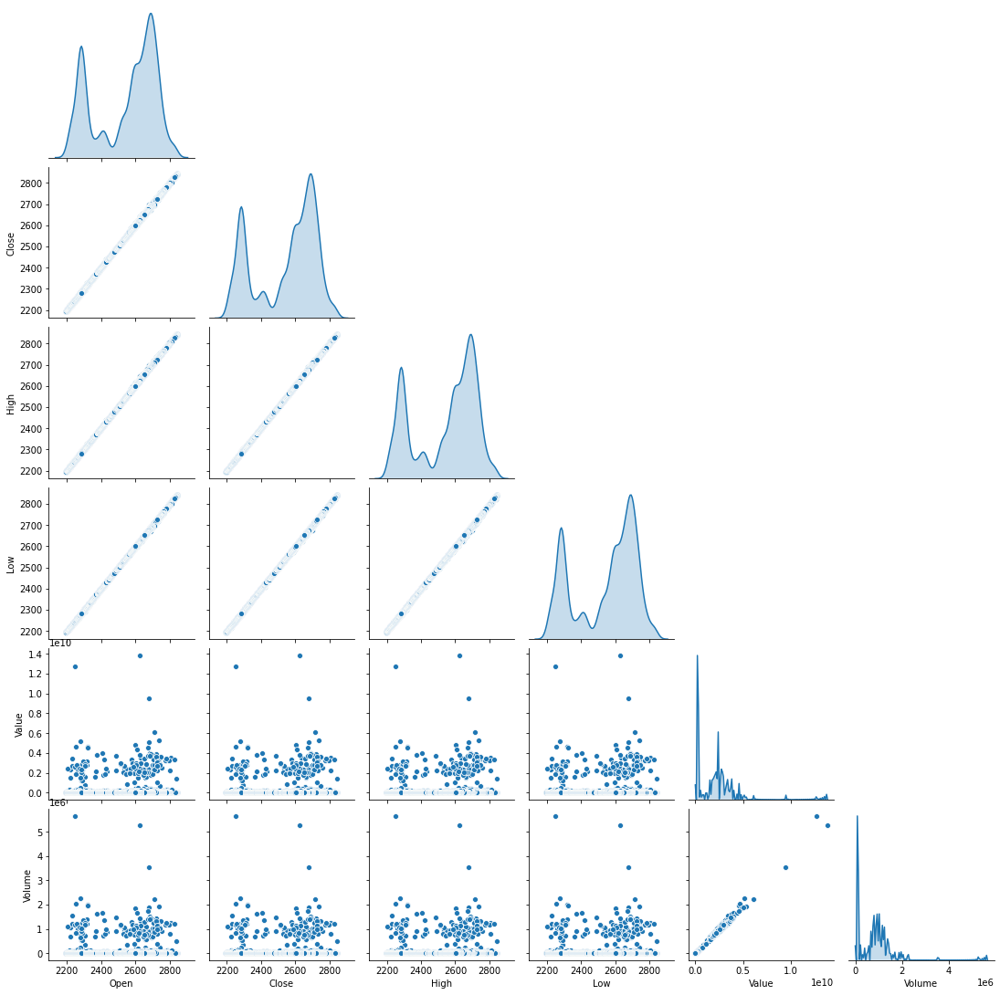

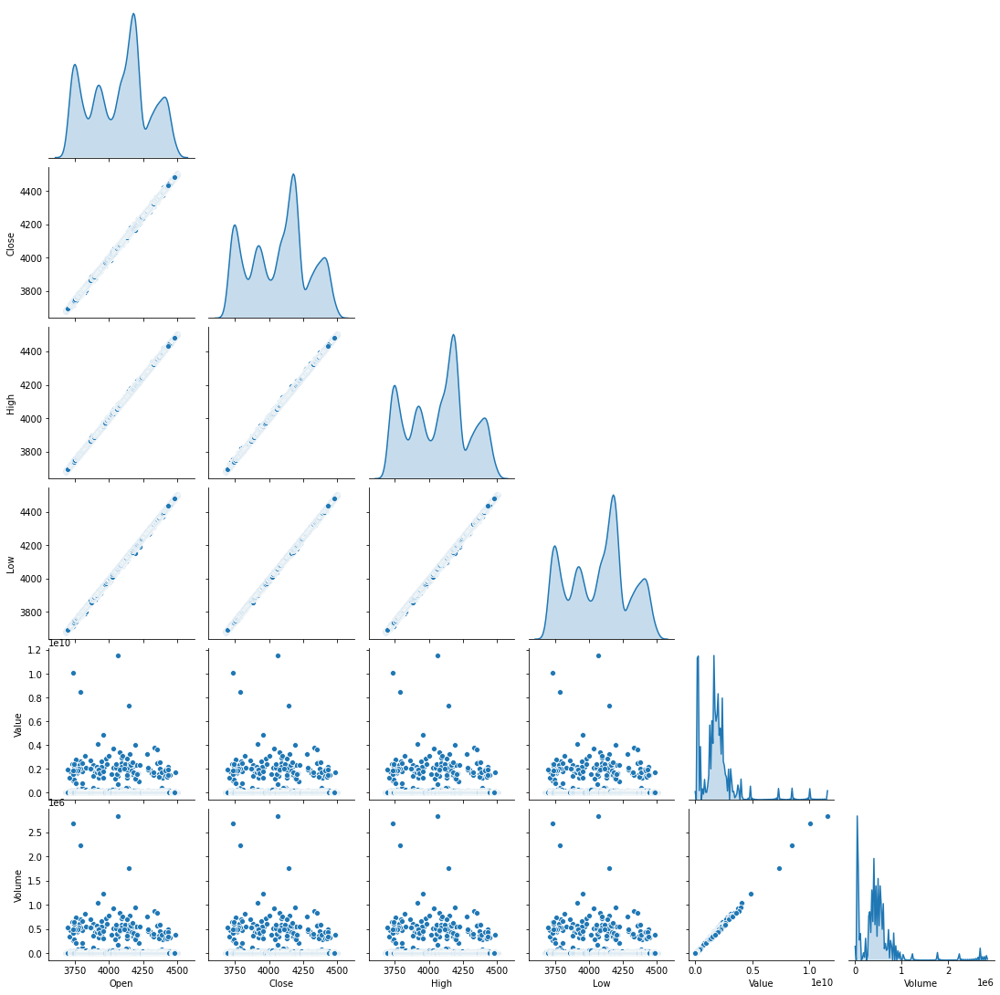

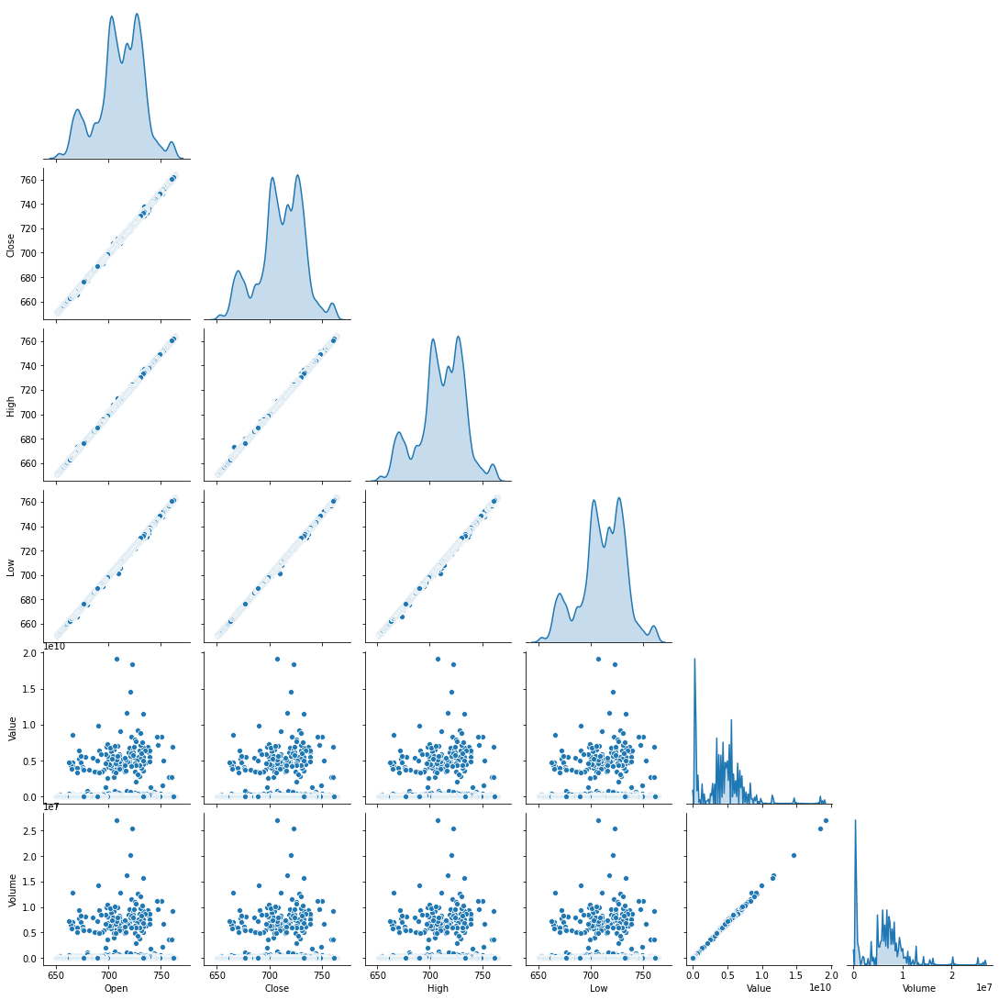

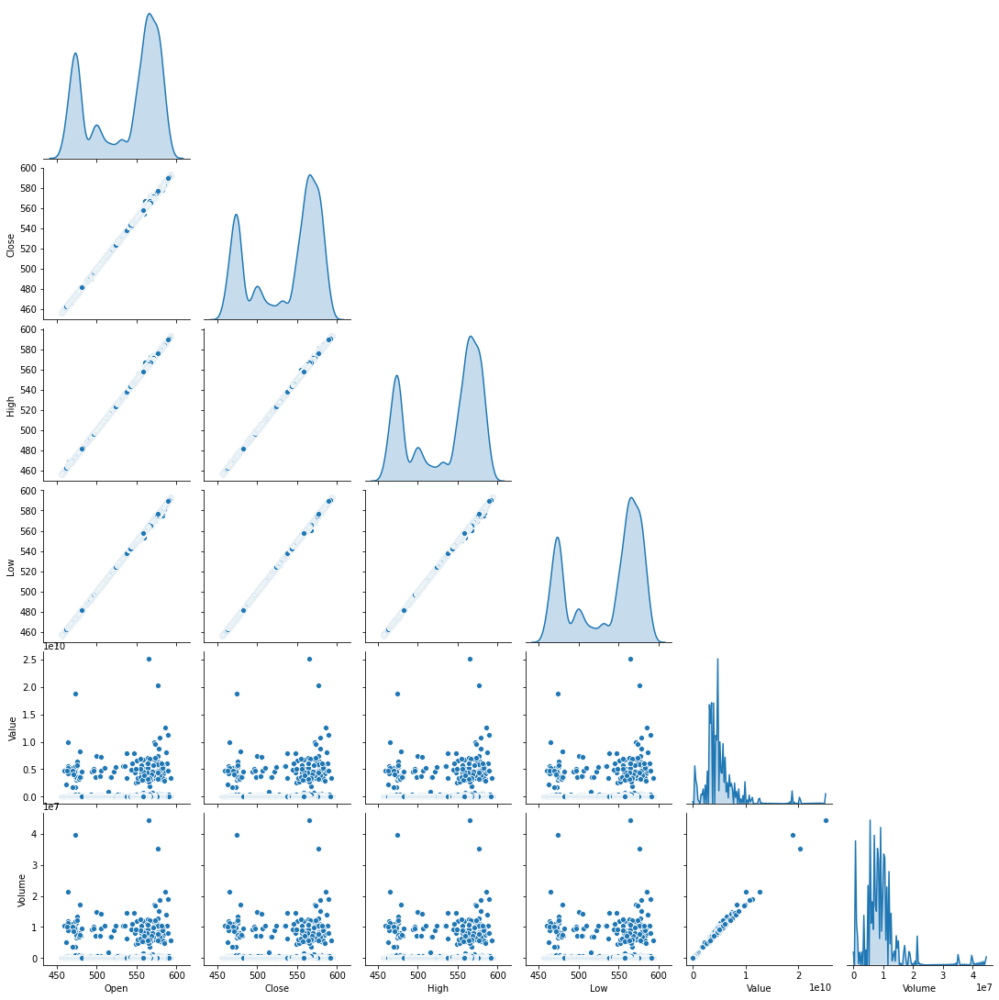

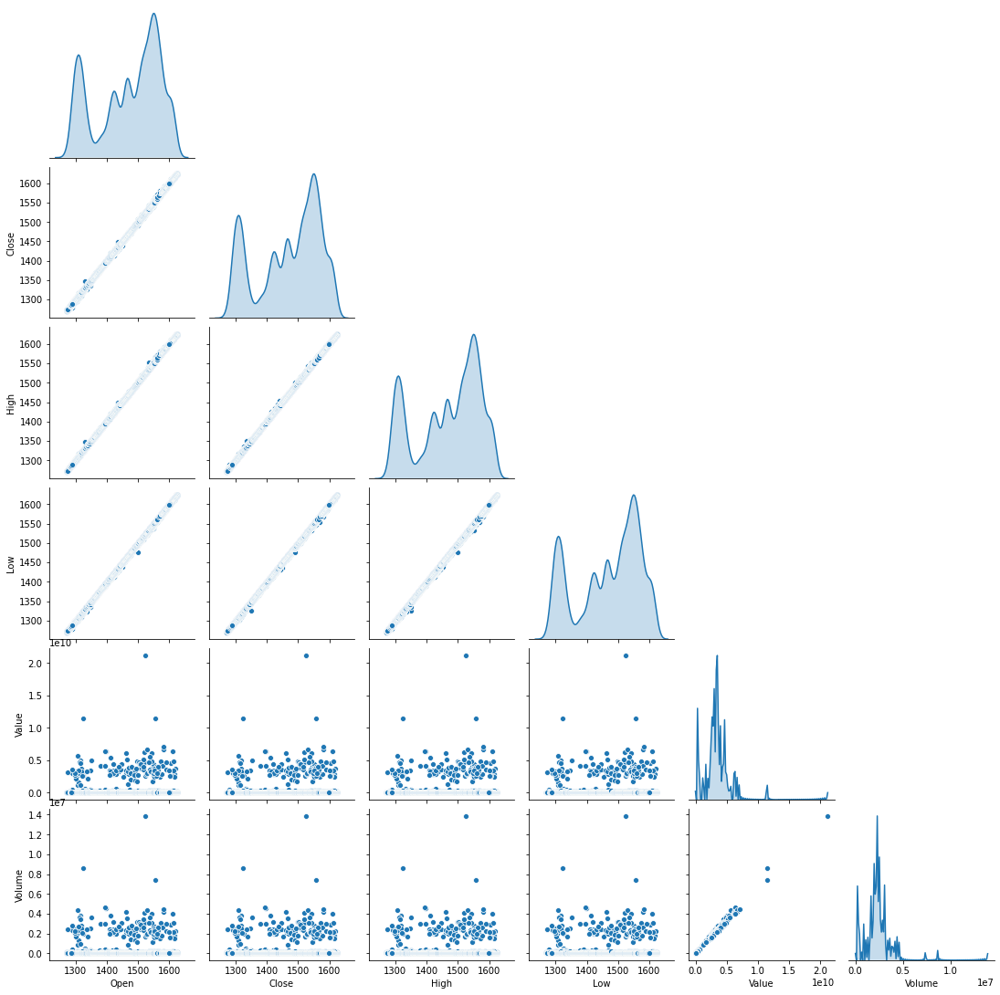

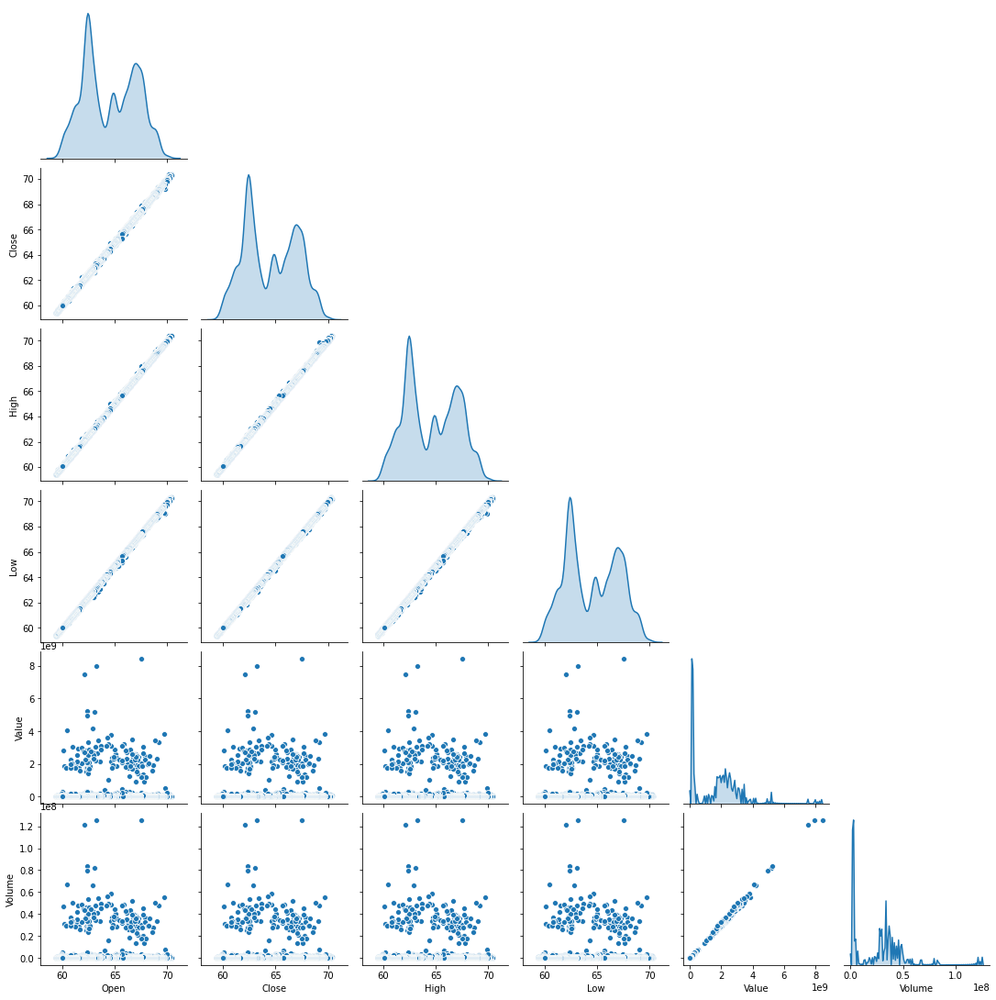

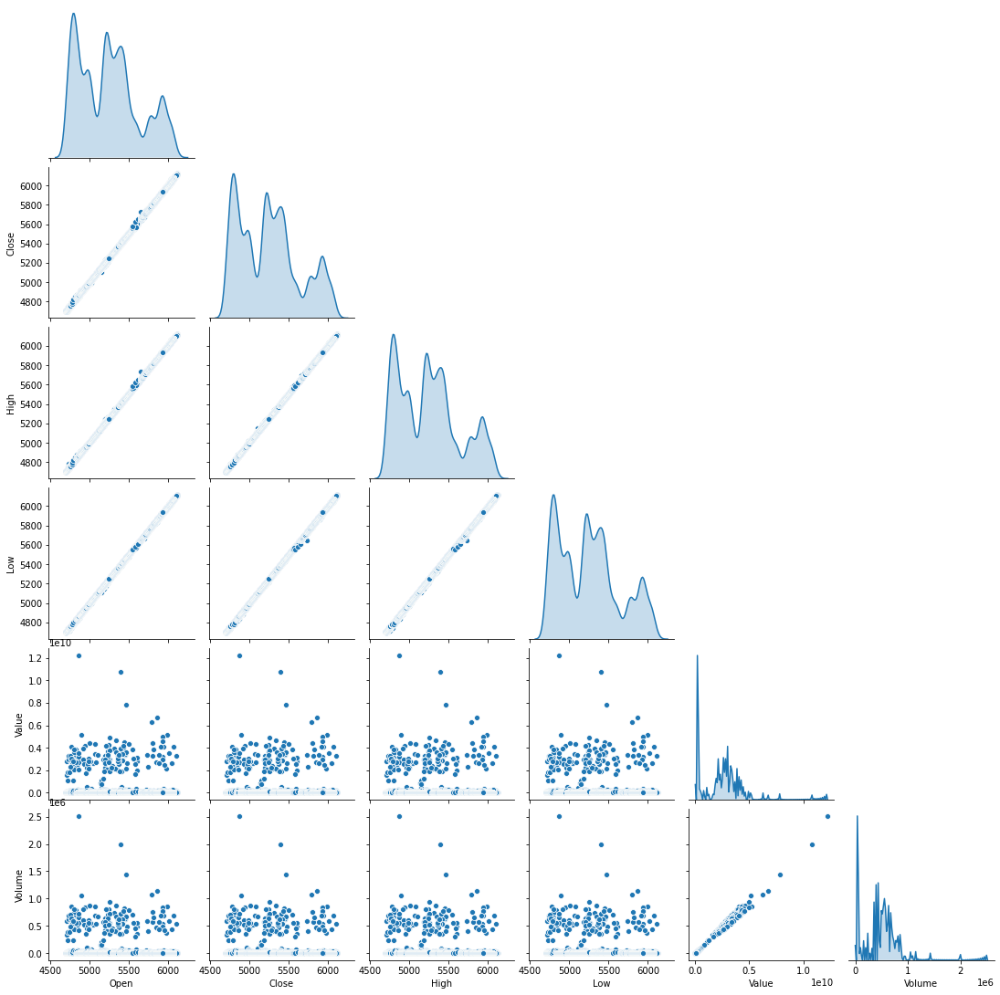

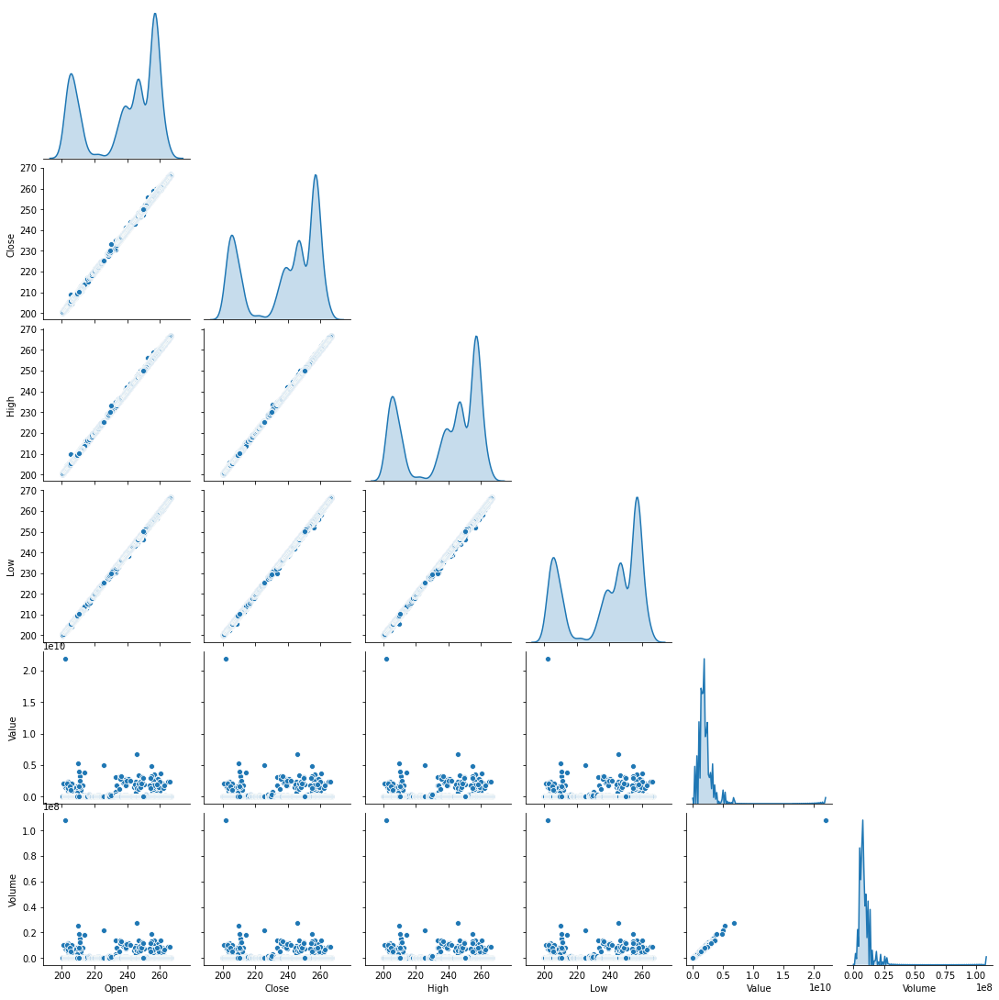

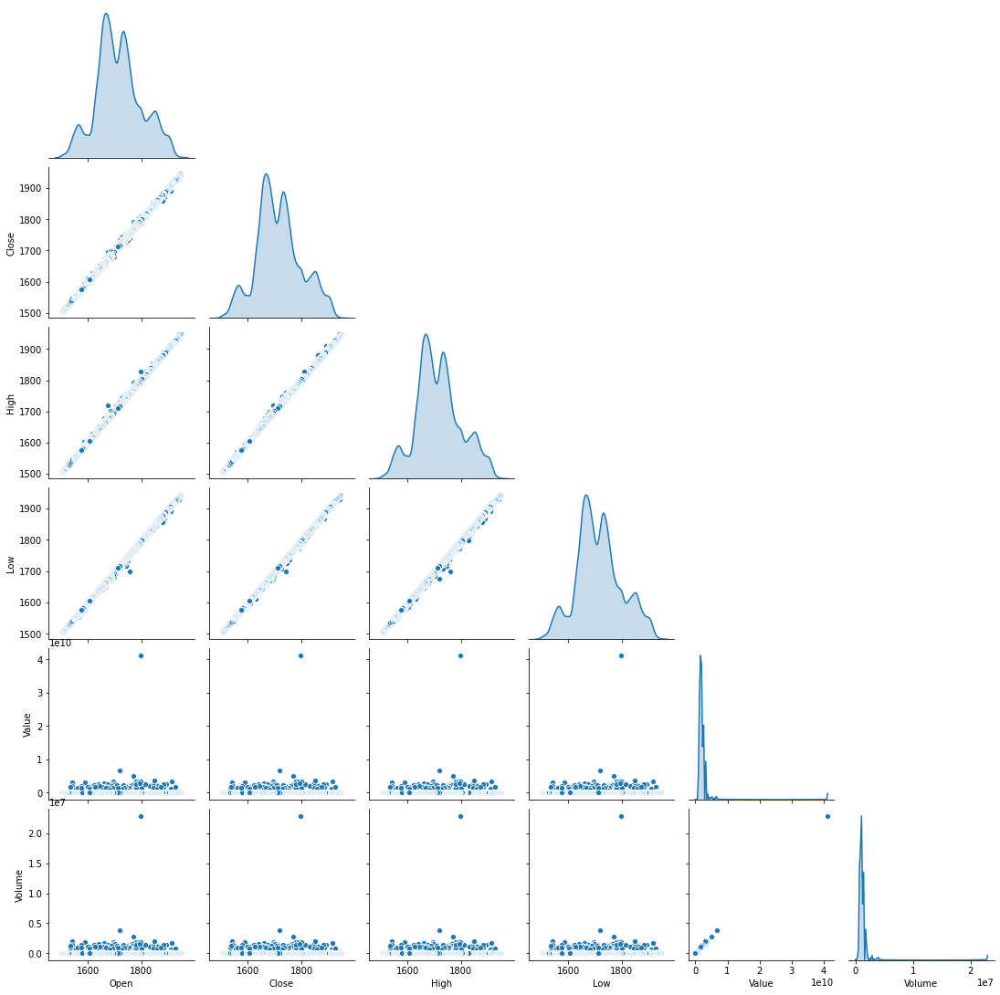

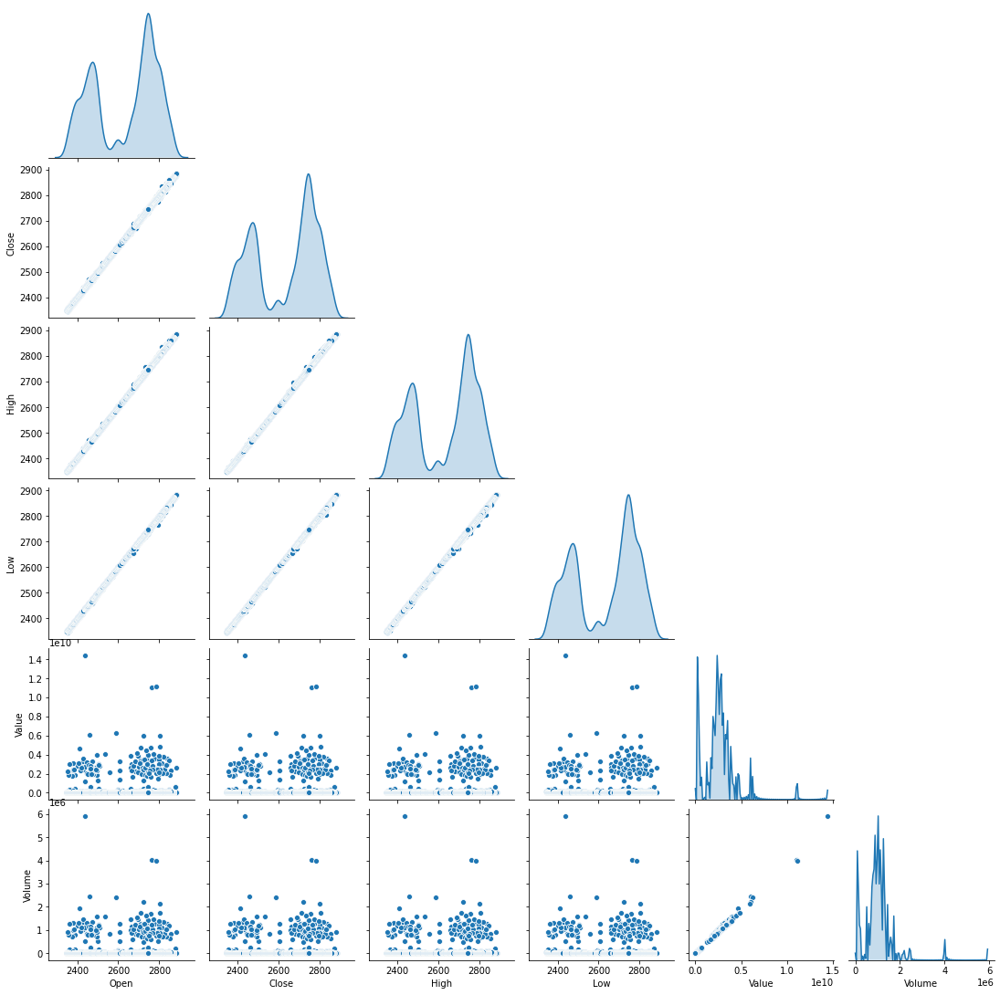

In [12]:
# Visualizations Heading: Verifying how the given Data Set form regression and distributions of Data points.
# Plot Used   : Pair Plot
# Description : Visualize how the data points has been distributed between variables.
# Outcome     : a) Both Open and Close Stock price form clear regression here. 
#               b) Used Kernel density estimates to see the distribution between vairables. Mostly you can see bi-normal and right skewed distribution.
#print('RDSB dataset')
sns.pairplot(dataset_ex_df_RDSB,corner=True,diag_kind="kde")
#print('ULVR dataset')
sns.pairplot(dataset_ex_df_ULVR,corner=True,diag_kind="kde")
#print('HSBC dataset')
sns.pairplot(dataset_ex_df_HSBC,corner=True,diag_kind="kde")
#print('BP dataset')
sns.pairplot(dataset_ex_df_BP,corner=True,diag_kind="kde")
#print('GSK dataset')
sns.pairplot(dataset_ex_df_GSK,corner=True,diag_kind="kde")
#print('LLOY dataset')
sns.pairplot(dataset_ex_df_LLOY,corner=True,diag_kind="kde")
#print('AZN dataset')
sns.pairplot(dataset_ex_df_AZN,corner=True,diag_kind="kde")
#print('TSCO dataset')
sns.pairplot(dataset_ex_df_TSCO,corner=True,diag_kind="kde")
#print('AAL dataset')
sns.pairplot(dataset_ex_df_AAL,corner=True,diag_kind="kde")
#print('DGE dataset')
sns.pairplot(dataset_ex_df_DGE,corner=True,diag_kind="kde")

In [13]:
#Make copy of datasets
dataset_ex_df_RDSB1 = dataset_ex_df_RDSB.copy()
dataset_ex_df_ULVR1 = dataset_ex_df_ULVR.copy()
dataset_ex_df_HSBC1 = dataset_ex_df_HSBC.copy()
dataset_ex_df_BP1 = dataset_ex_df_BP.copy()
dataset_ex_df_GSK1 = dataset_ex_df_GSK.copy()
dataset_ex_df_LLOY1 = dataset_ex_df_LLOY.copy()
dataset_ex_df_AZN1 = dataset_ex_df_AZN.copy()
dataset_ex_df_TSCO1 = dataset_ex_df_TSCO.copy()
dataset_ex_df_AAL1 = dataset_ex_df_AAL.copy()
dataset_ex_df_DGE1 = dataset_ex_df_DGE.copy()

#EDA

**1. Market Trend**

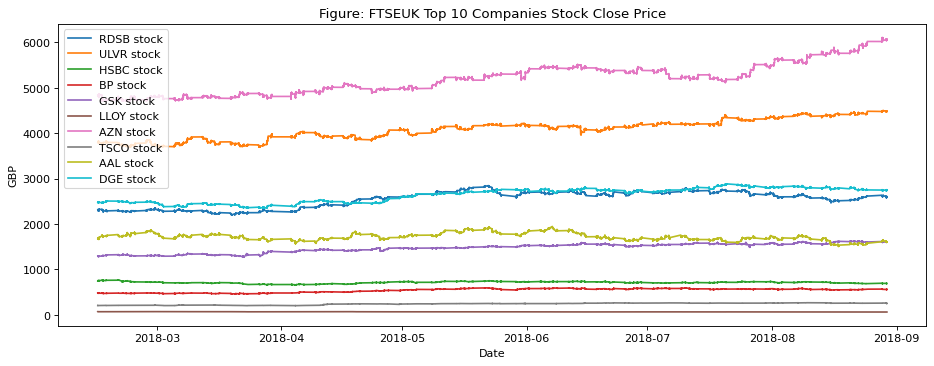

In [14]:
plt.figure(figsize=(14, 5), dpi=80)
plt.plot(dataset_ex_df_RDSB['Dates'], dataset_ex_df_RDSB['Close'], label='RDSB stock')
plt.plot(dataset_ex_df_ULVR['Dates'], dataset_ex_df_ULVR['Close'], label='ULVR stock')
plt.plot(dataset_ex_df_HSBC['Dates'], dataset_ex_df_HSBC['Close'], label='HSBC stock')
plt.plot(dataset_ex_df_BP['Dates'], dataset_ex_df_BP['Close'], label='BP stock')
plt.plot(dataset_ex_df_GSK['Dates'], dataset_ex_df_GSK['Close'], label='GSK stock')
plt.plot(dataset_ex_df_LLOY['Dates'], dataset_ex_df_LLOY['Close'], label='LLOY stock')
plt.plot(dataset_ex_df_AZN['Dates'], dataset_ex_df_AZN['Close'], label='AZN stock')
plt.plot(dataset_ex_df_TSCO['Dates'], dataset_ex_df_TSCO['Close'], label='TSCO stock')
plt.plot(dataset_ex_df_AAL['Dates'], dataset_ex_df_AAL['Close'], label='AAL stock')
plt.plot(dataset_ex_df_DGE['Dates'], dataset_ex_df_DGE['Close'], label='DGE stock')
plt.xlabel('Date')
plt.ylabel('GBP')
plt.title('Figure: FTSEUK Top 10 Companies Stock Close Price')
plt.legend()
plt.show()

**2. Test for data stationarity - Dickey Fuller Test**
1.   Test Statistic
2.   p-Value
3.   Lags used
4.   Critical value(1%)
5.   Critical value(5%)
6.   Critical value(10%)
7.   Rolling mean
9.   Standard Deviation


In [15]:
import statsmodels.tsa.stattools as ts

In [16]:
def dftest(timeseries):
    """This code is from a Metis lecture on testing for stationary data with the
    Dickey Fuller test for time series analysis. It takes in a time series and outputs statistics and graphics
    If the p value is <.05, then the data passes the test and is ready for ARMA models."""
    dftest = ts.adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','Lags Used','Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    #Determine rolling statistics
    rolmean = timeseries.rolling(window=12).mean()
    rolstd = timeseries.rolling(window=12).std()

    #Plot rolling statistics:

    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean and Standard Deviation')
    plt.show(block=False)

Test RDSB data stationarity:

Test Statistic             -1.429702
p-value                     0.567957
Lags Used                  26.000000
Observations Used       66905.000000
Critical Value (1%)        -3.430448
Critical Value (5%)        -2.861583
Critical Value (10%)       -2.566793
dtype: float64


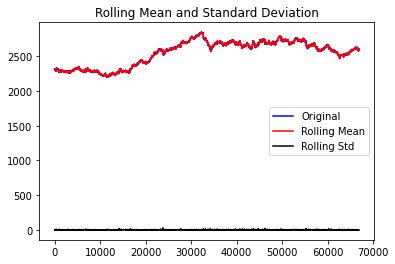

None
Test ULVR data stationarity:

Test Statistic                   NaN
p-value                          NaN
Lags Used                   0.000000
Observations Used       67972.000000
Critical Value (1%)        -3.430446
Critical Value (5%)        -2.861583
Critical Value (10%)       -2.566793
dtype: float64


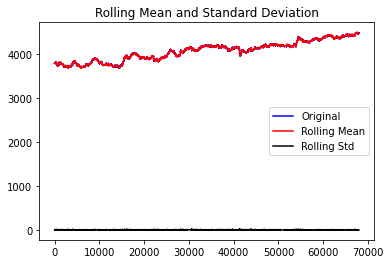

None
Test HSBC data stationarity:

Test Statistic             -2.259036
p-value                     0.185520
Lags Used                  21.000000
Observations Used       68264.000000
Critical Value (1%)        -3.430446
Critical Value (5%)        -2.861582
Critical Value (10%)       -2.566793
dtype: float64


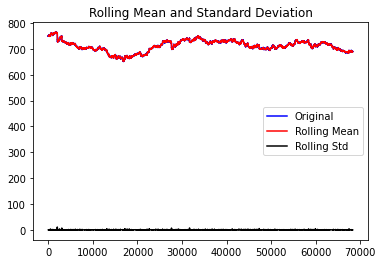

None
Test BP data stationarity:

Test Statistic             -1.388681
p-value                     0.587690
Lags Used                   5.000000
Observations Used       68443.000000
Critical Value (1%)        -3.430446
Critical Value (5%)        -2.861582
Critical Value (10%)       -2.566792
dtype: float64


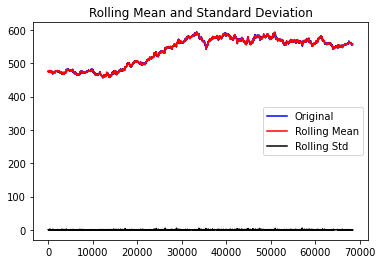

None
Test GSK data stationarity:

Test Statistic             -1.351739
p-value                     0.605182
Lags Used                  23.000000
Observations Used       67395.000000
Critical Value (1%)        -3.430447
Critical Value (5%)        -2.861583
Critical Value (10%)       -2.566793
dtype: float64


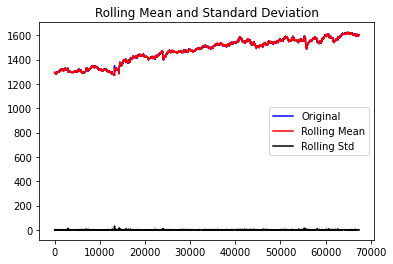

None
Test LLOY data stationarity:

Test Statistic             -1.023640
p-value                     0.744545
Lags Used                  28.000000
Observations Used       67500.000000
Critical Value (1%)        -3.430447
Critical Value (5%)        -2.861583
Critical Value (10%)       -2.566793
dtype: float64


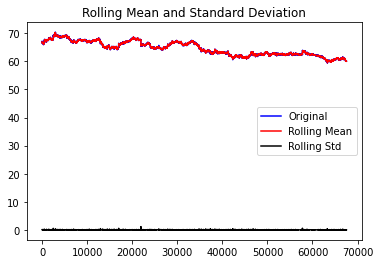

None
Test AZN data stationarity:

Test Statistic             -0.345119
p-value                     0.918867
Lags Used                   3.000000
Observations Used       65991.000000
Critical Value (1%)        -3.430449
Critical Value (5%)        -2.861584
Critical Value (10%)       -2.566793
dtype: float64


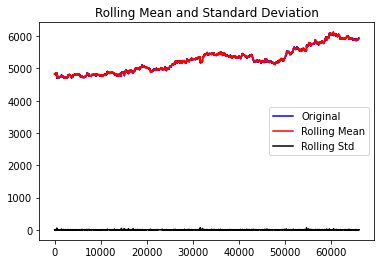

None
Test TSCO data stationarity:

Test Statistic             -1.581997
p-value                     0.492630
Lags Used                  42.000000
Observations Used       57483.000000
Critical Value (1%)        -3.430464
Critical Value (5%)        -2.861590
Critical Value (10%)       -2.566797
dtype: float64


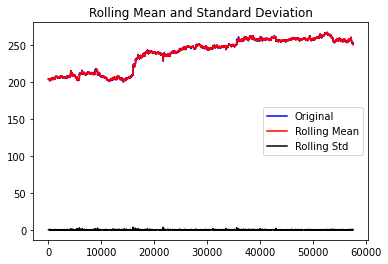

None
Test AAL data stationarity:

Test Statistic             -2.521038
p-value                     0.110439
Lags Used                   2.000000
Observations Used       68164.000000
Critical Value (1%)        -3.430446
Critical Value (5%)        -2.861582
Critical Value (10%)       -2.566793
dtype: float64


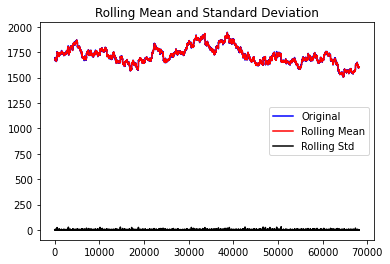

None
Test DGE data stationarity:

Test Statistic             -1.085917
p-value                     0.720655
Lags Used                   7.000000
Observations Used       65842.000000
Critical Value (1%)        -3.430449
Critical Value (5%)        -2.861584
Critical Value (10%)       -2.566793
dtype: float64


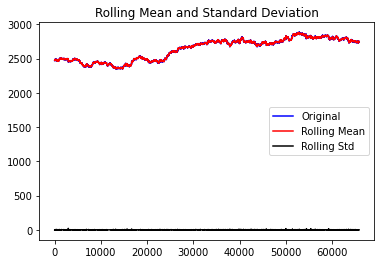

None


In [17]:
print("Test RDSB data stationarity:\n")
print(dftest(dataset_ex_df_RDSB.Close))
print("Test ULVR data stationarity:\n")
print(dftest(dataset_ex_df_ULVR.Close))
print("Test HSBC data stationarity:\n")
print(dftest(dataset_ex_df_HSBC.Close))
print("Test BP data stationarity:\n")
print(dftest(dataset_ex_df_BP.Close))
print("Test GSK data stationarity:\n")
print(dftest(dataset_ex_df_GSK.Close))
print("Test LLOY data stationarity:\n")
print(dftest(dataset_ex_df_LLOY.Close))
print("Test AZN data stationarity:\n")
print(dftest(dataset_ex_df_AZN.Close))
print("Test TSCO data stationarity:\n")
print(dftest(dataset_ex_df_TSCO.Close))
print("Test AAL data stationarity:\n")
print(dftest(dataset_ex_df_AAL.Close))
print("Test DGE data stationarity:\n")
print(dftest(dataset_ex_df_DGE.Close))

**3. Autocorrelation and Partial Correlation**

In [20]:
import statsmodels.tsa.api as smt

def plots(data, lags=None):
    layout = (1, 3)
    raw  = plt.subplot2grid(layout, (0, 0))
    acf  = plt.subplot2grid(layout, (0, 1))
    pacf = plt.subplot2grid(layout, (0, 2))
    
    data.plot(ax=raw, figsize=(12, 6))
    smt.graphics.plot_acf(data, lags=lags, ax=acf)
    smt.graphics.plot_pacf(data, lags=lags, ax=pacf)
    sns.despine()
    plt.tight_layout()

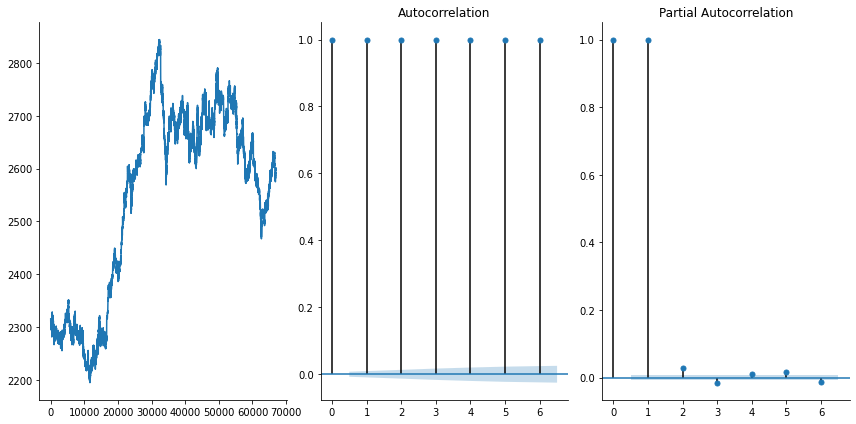

In [19]:
plots(dataset_ex_df_RDSB.Close, lags=6)

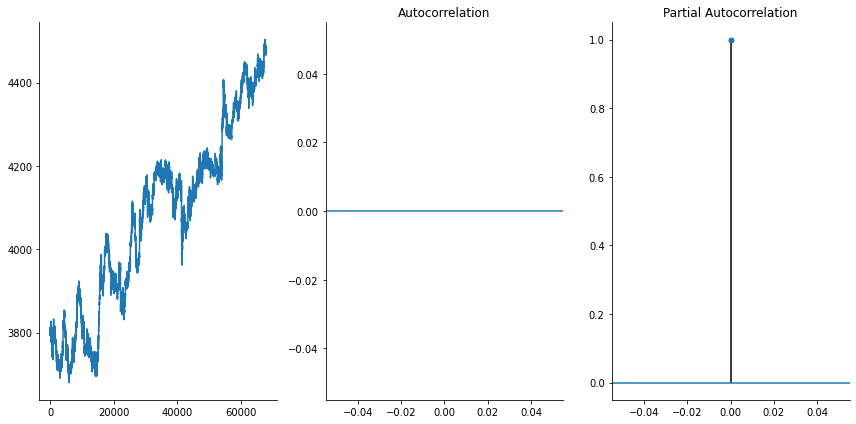

In [21]:
plots(dataset_ex_df_ULVR.Close, lags=6)

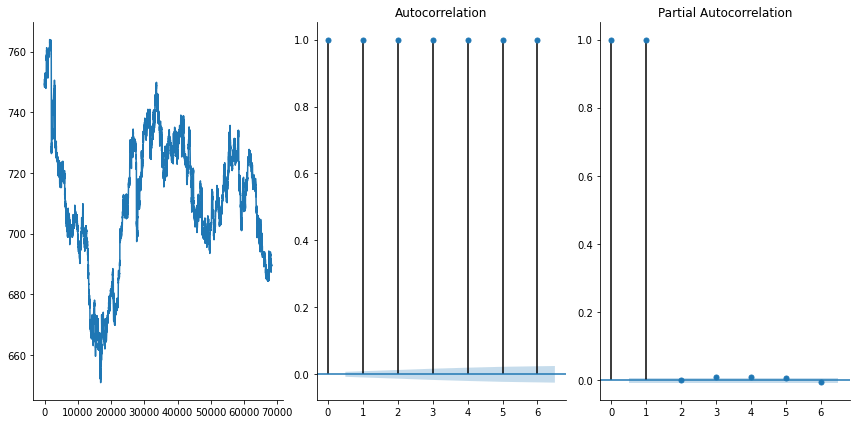

In [22]:
plots(dataset_ex_df_HSBC.Close, lags=6)

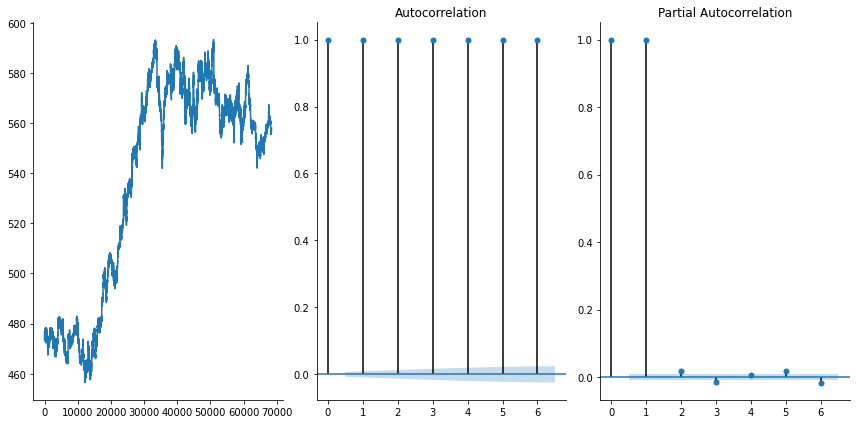

In [23]:
plots(dataset_ex_df_BP.Close, lags=6)

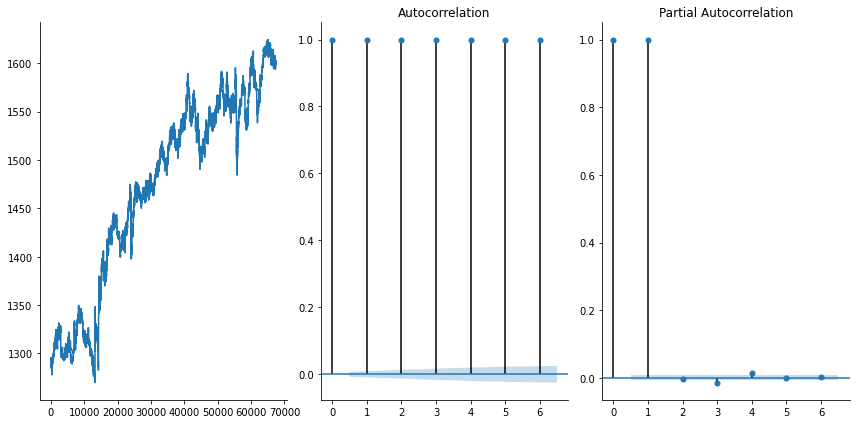

In [24]:
plots(dataset_ex_df_GSK.Close, lags=6)

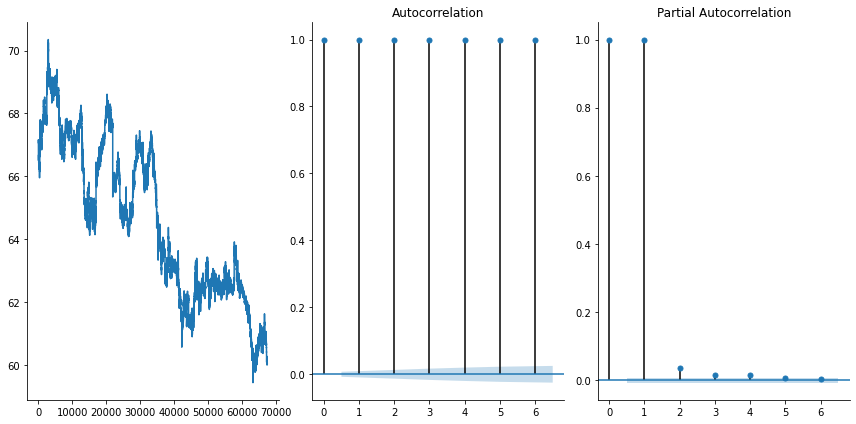

In [25]:
plots(dataset_ex_df_LLOY.Close, lags=6)

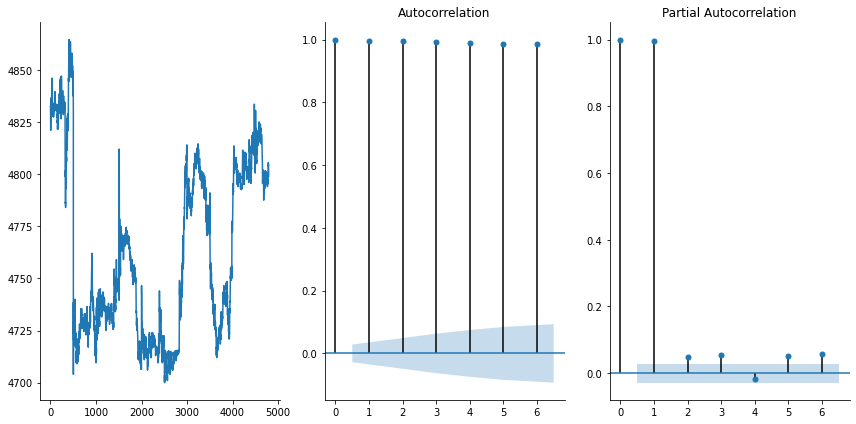

In [ ]:
plots(dataset_ex_df_AZN.Close, lags=6)

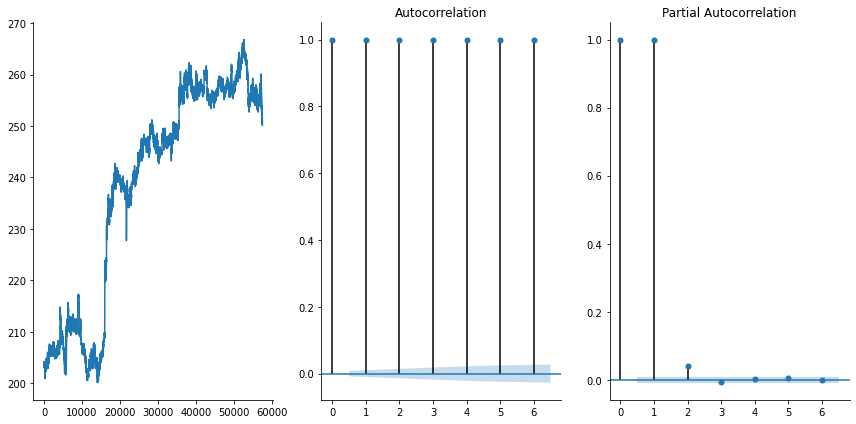

In [26]:
plots(dataset_ex_df_TSCO.Close, lags=6)

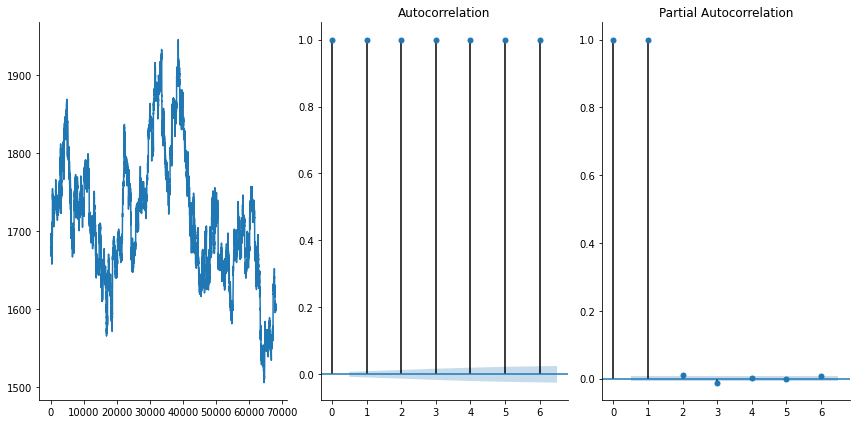

In [27]:
plots(dataset_ex_df_AAL.Close, lags=6)

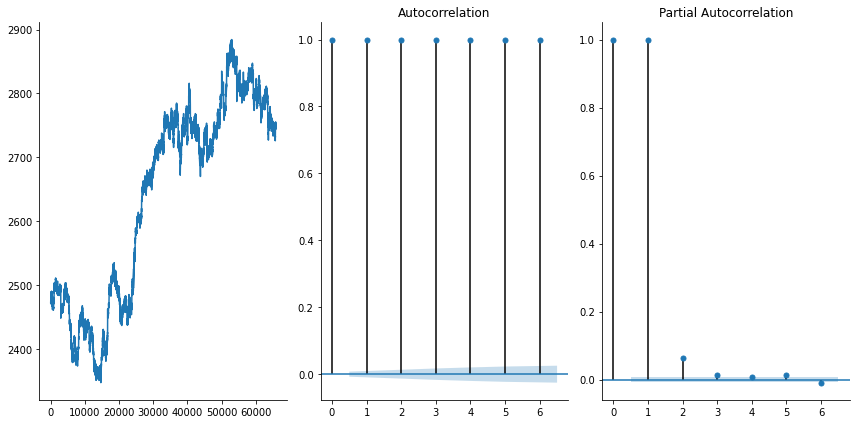

In [28]:
plots(dataset_ex_df_DGE.Close, lags=6)

#Feature Generation

**1. Technical Indicators**

In [ ]:
def get_technical_indicators(dataset): #function to generate feature technical indicators
    
    
    # Create 7 and 21 days Moving Average
    dataset['ma7'] = dataset['Close'].rolling(window = 7).mean()
    dataset['ma21'] = dataset['Close'].rolling(window = 21).mean()
    
    #Create MACD
    dataset['26ema'] = dataset['Close'].ewm(span=26).mean()
    dataset['12ema'] = dataset['Close'].ewm(span=12).mean()
    dataset['MACD'] = (dataset['12ema']-dataset['26ema'])
    
    #Create Bollinger Bands
    dataset['20sd'] = dataset['Close'].rolling(window = 20).std()
    dataset['upper_band'] = (dataset['Close'].rolling(window = 20).mean()) + (dataset['20sd']*2)
    dataset['lower_band'] = (dataset['Close'].rolling(window = 20).mean()) - (dataset['20sd']*2)
    
    
    #Create Exponential moving average
    dataset['ema'] = dataset['Close'].ewm(com=0.5).mean()
    
    #Create Momentum
    dataset['momentum'] = (dataset['Close']/100)-1
    
    
    
    return dataset

In [ ]:
dataset_TI_df_RDSB = get_technical_indicators(dataset_ex_df_RDSB)
print(dataset_TI_df_RDSB.head())
dataset_TI_df_ULVR = get_technical_indicators(dataset_ex_df_ULVR)
print(dataset_TI_df_ULVR.head())
dataset_TI_df_HSBC = get_technical_indicators(dataset_ex_df_HSBC)
print(dataset_TI_df_HSBC.head())
dataset_TI_df_BP = get_technical_indicators(dataset_ex_df_BP)
print(dataset_TI_df_BP.head())
dataset_TI_df_GSK = get_technical_indicators(dataset_ex_df_GSK)
print(dataset_TI_df_GSK.head())
dataset_TI_df_LLOY = get_technical_indicators(dataset_ex_df_LLOY)
print(dataset_TI_df_LLOY.head())
dataset_TI_df_AZN = get_technical_indicators(dataset_ex_df_AZN)
print(dataset_TI_df_AZN.head())
dataset_TI_df_TSCO = get_technical_indicators(dataset_ex_df_TSCO)
print(dataset_TI_df_TSCO.head())
dataset_TI_df_AAL = get_technical_indicators(dataset_ex_df_AAL)
print(dataset_TI_df_AAL.head())
dataset_TI_df_DGE = get_technical_indicators(dataset_ex_df_DGE)
print(dataset_TI_df_DGE.head())

                Dates    Open   Close  ...  lower_band          ema  momentum
0 2018-02-14 08:00:00  2319.0  2315.5  ...         NaN  2315.500000    22.155
1 2018-02-14 08:01:00  2316.5  2314.0  ...         NaN  2314.375000    22.140
2 2018-02-14 08:02:00  2311.5  2306.0  ...         NaN  2308.576923    22.060
3 2018-02-14 08:03:00  2306.5  2306.5  ...         NaN  2307.175000    22.065
4 2018-02-14 08:04:00  2309.0  2309.0  ...         NaN  2308.396694    22.090

[5 rows x 17 columns]
                Dates    Open   Close  ...  lower_band          ema  momentum
0 2018-02-14 08:00:00  3805.0  3797.5  ...         NaN  3797.500000    36.975
1 2018-02-14 08:01:00  3801.0  3800.0  ...         NaN  3799.375000    37.000
2 2018-02-14 08:02:00  3797.0  3793.0  ...         NaN  3794.961538    36.930
3 2018-02-14 08:03:00  3796.0  3802.5  ...         NaN  3800.050000    37.025
4 2018-02-14 08:04:00  3801.0  3799.5  ...         NaN  3799.681818    36.995

[5 rows x 17 columns]
                Da

In [ ]:
def plot_technical_indicators(dataset, last_mins):
    plt.figure(figsize=(16, 10), dpi=100)
    shape_0 = dataset.shape[0]
    xmacd_ = shape_0-last_mins
    
    dataset = dataset.iloc[-last_mins:, :]
    x_ = range(3, dataset.shape[0])
    x_ =list(dataset.index)
    
    # Plot first subplot
    plt.subplot(2, 1, 1)
    plt.plot(dataset['ma7'],label='MA 7', color='g',linestyle='--')
    plt.plot(dataset['Close'],label='Closing Price', color='b')
    plt.plot(dataset['ma21'],label='MA 21', color='r',linestyle='--')
    plt.plot(dataset['upper_band'],label='Upper Band', color='c')
    plt.plot(dataset['lower_band'],label='Lower Band', color='c')
    plt.fill_between(x_, dataset['lower_band'], dataset['upper_band'], alpha=0.35)
    plt.title('Technical indicators - last {} mins.'.format(last_mins))
    plt.ylabel('GBP')
    plt.legend()

    # Plot second subplot
    plt.subplot(2, 1, 2)
    plt.title('MACD')
    plt.plot(dataset['MACD'],label='MACD', linestyle='-.')
    plt.hlines(15, xmacd_, shape_0, colors='g', linestyles='--')
    plt.hlines(-15, xmacd_, shape_0, colors='g', linestyles='--')
    plt.plot(dataset['momentum'],label='Momentum', color='b',linestyle='-')

    plt.legend()
    plt.show()

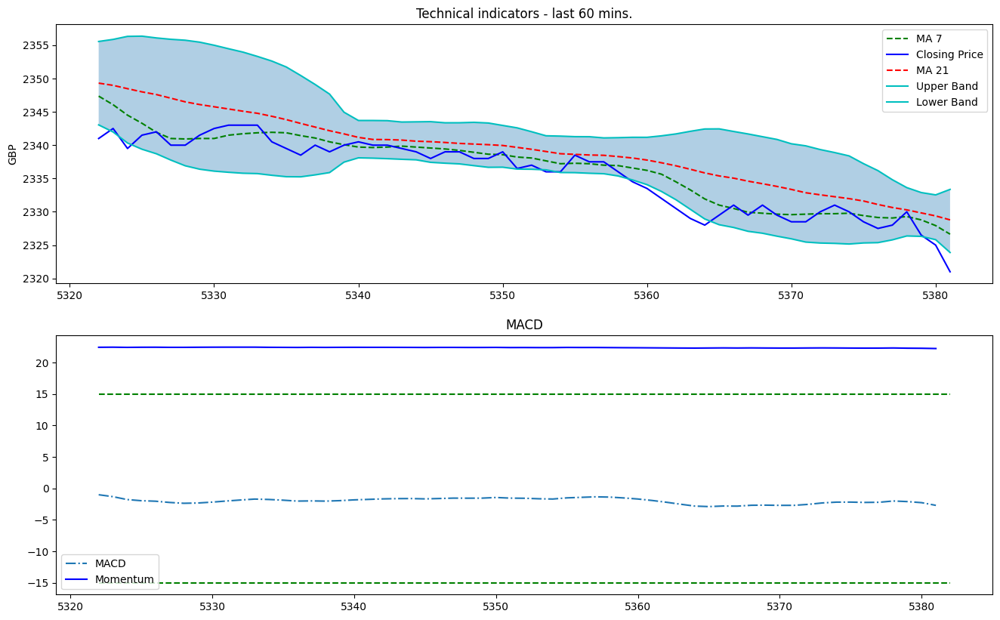

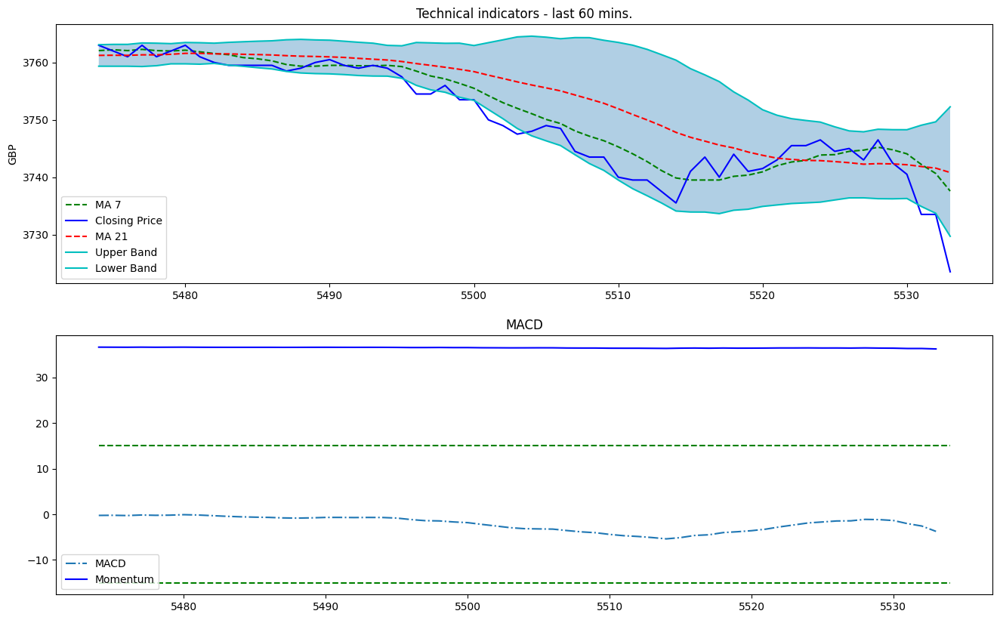

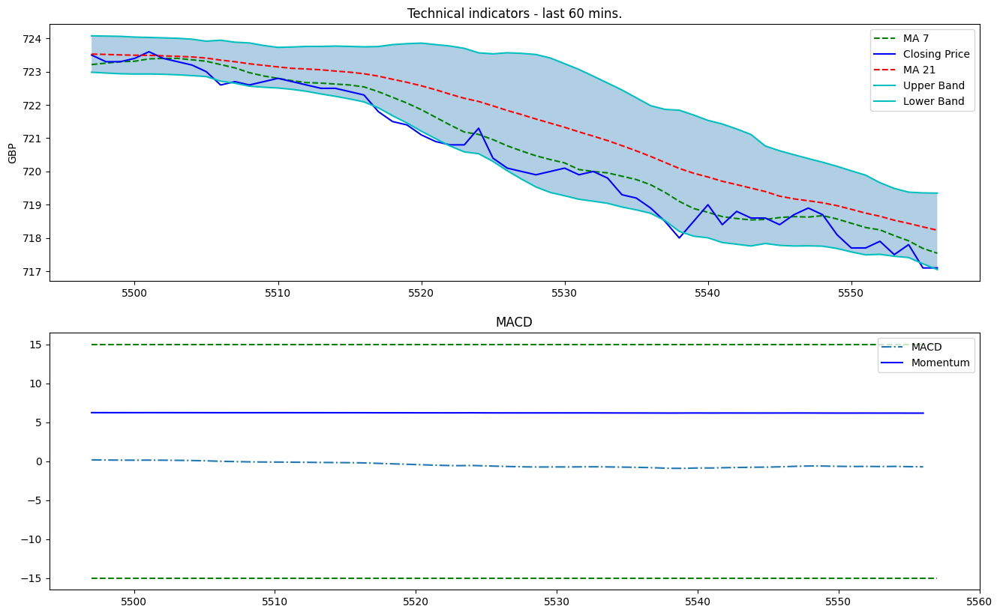

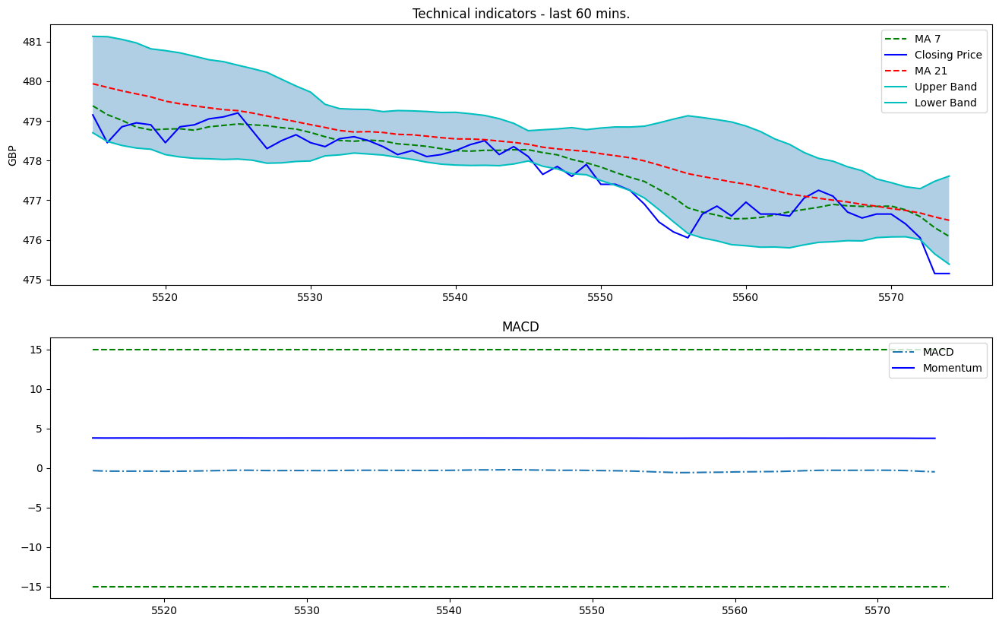

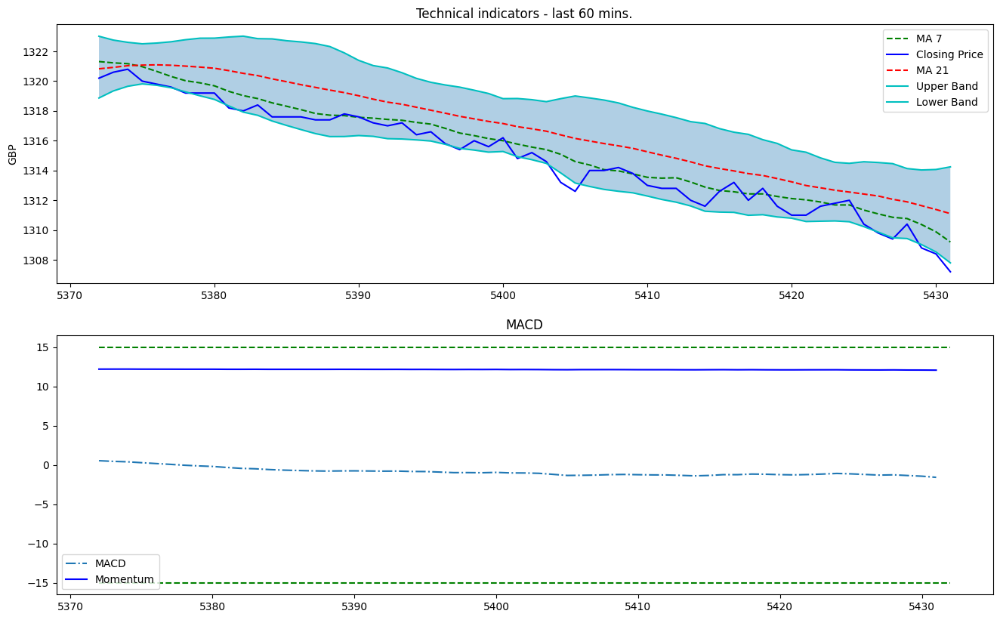

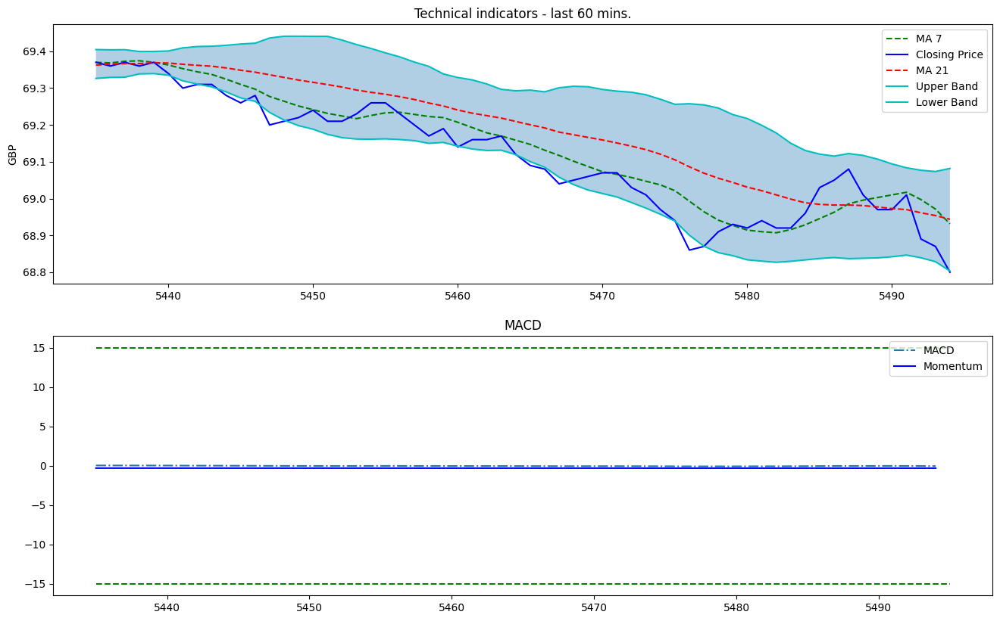

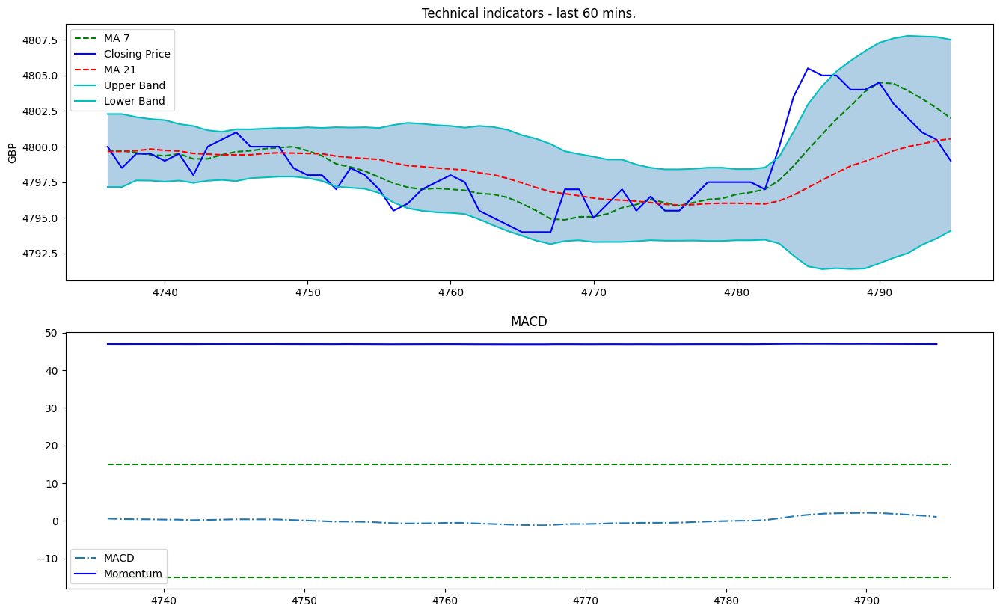

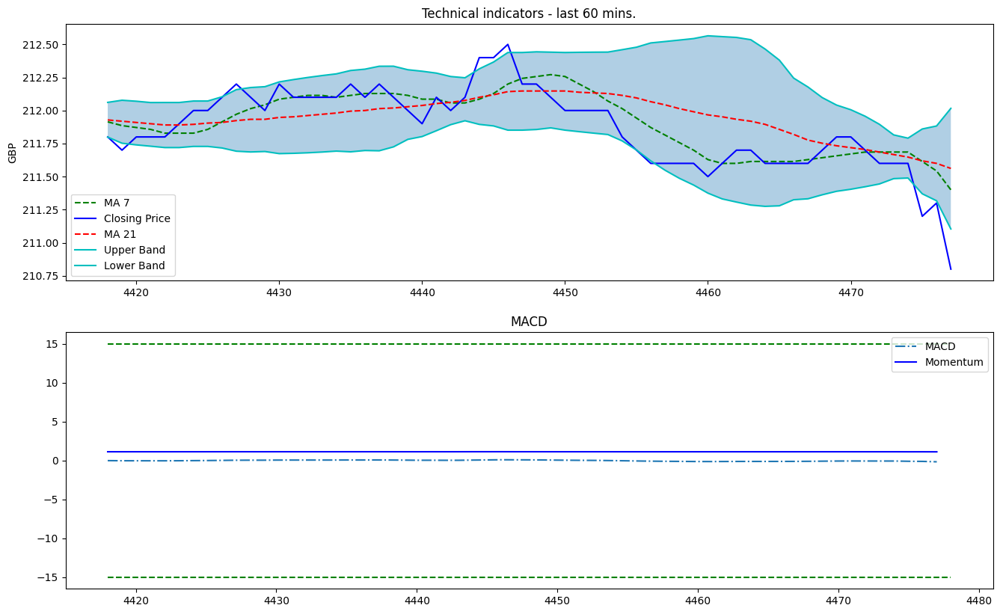

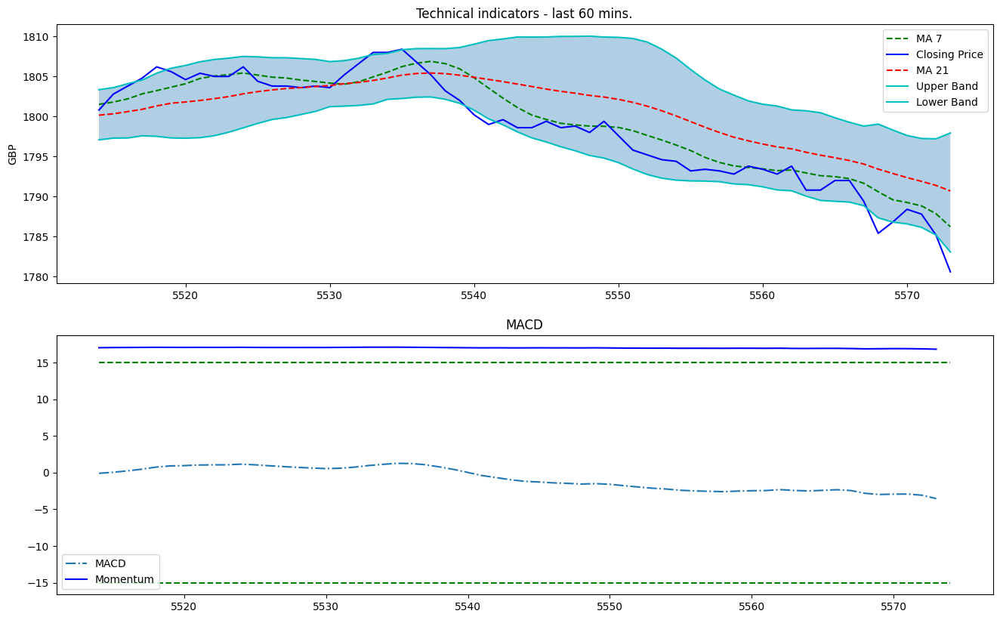

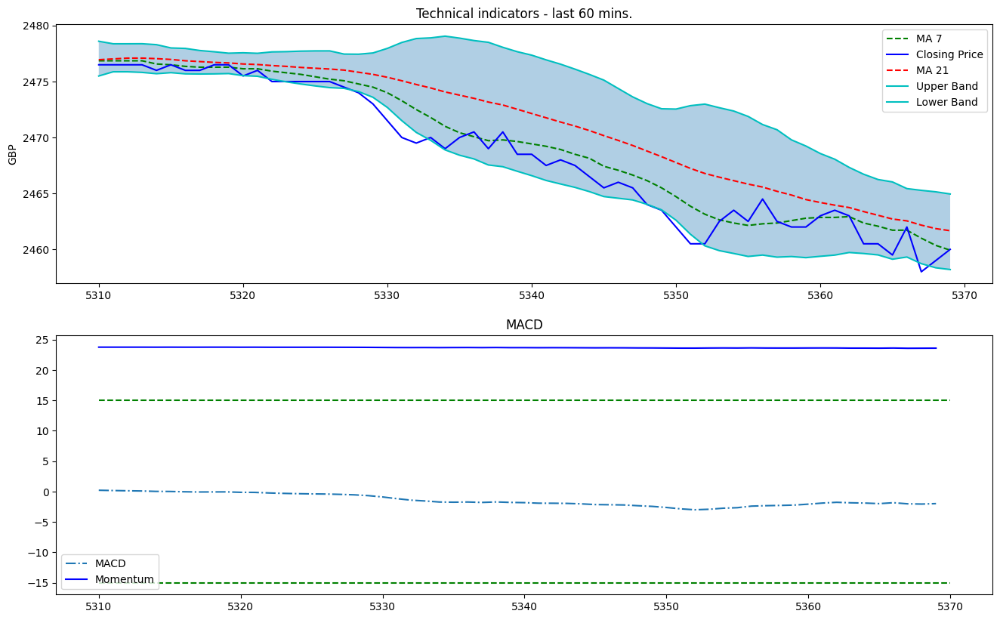

In [ ]:
plot_technical_indicators(dataset_TI_df_RDSB, 60)
plot_technical_indicators(dataset_TI_df_ULVR, 60)
plot_technical_indicators(dataset_TI_df_HSBC, 60)
plot_technical_indicators(dataset_TI_df_BP, 60)
plot_technical_indicators(dataset_TI_df_GSK, 60)
plot_technical_indicators(dataset_TI_df_LLOY, 60)
plot_technical_indicators(dataset_TI_df_AZN, 60)
plot_technical_indicators(dataset_TI_df_TSCO, 60)
plot_technical_indicators(dataset_TI_df_AAL, 60)
plot_technical_indicators(dataset_TI_df_DGE, 60)

**2. Time Series Analysis using Fourier Transform**

In [ ]:
data_FT_RDSB = dataset_ex_df_RDSB[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_RDSB['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

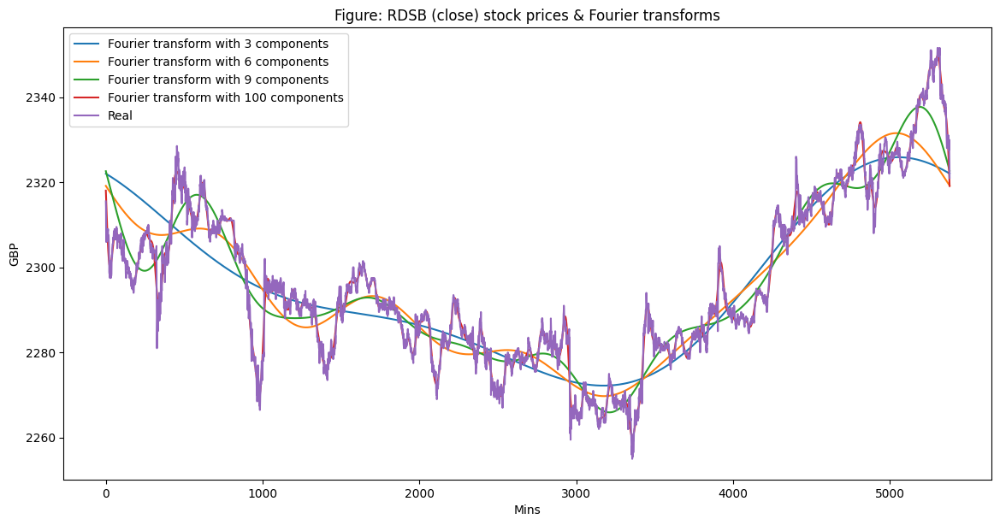

In [ ]:
plt.figure(figsize=(14, 7), dpi=100)
fft_list = np.asarray(fft_df['fft'].tolist())
for num_ in [3, 6, 9, 100]:
    fft_list_m10= np.copy(fft_list); fft_list_m10[num_:-num_]=0
    plt.plot(np.fft.ifft(fft_list_m10), label='Fourier transform with {} components'.format(num_))
plt.plot(data_FT_RDSB['Close'],  label='Real')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: RDSB (close) stock prices & Fourier transforms')
plt.legend()
plt.show()

In [ ]:
def get_fourier(dataset):
    data_FT_RDSB = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_RDSB['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [ ]:
dataset_TI_df_RDSB = get_fourier(dataset_ex_df_RDSB)
dataset_TI_df_RDSB.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,2319.0,2315.5,2319.0,2315.5,64152800.0,27677,NaN,NaN,2315.500000,2315.500000,0.000000,NaN,NaN,NaN,2315.500000,22.155,2315.5
1,2018-02-14 08:01:00,2316.5,2314.0,2316.5,2312.5,39831632.0,17206,NaN,NaN,2314.721154,2314.687500,-0.033654,NaN,NaN,NaN,2314.375000,22.140,2314.0
2,2018-02-14 08:02:00,2311.5,2306.0,2312.0,2305.0,38951624.0,16871,NaN,NaN,2311.587728,2311.296767,-0.290961,NaN,NaN,NaN,2308.576923,22.060,2306.0


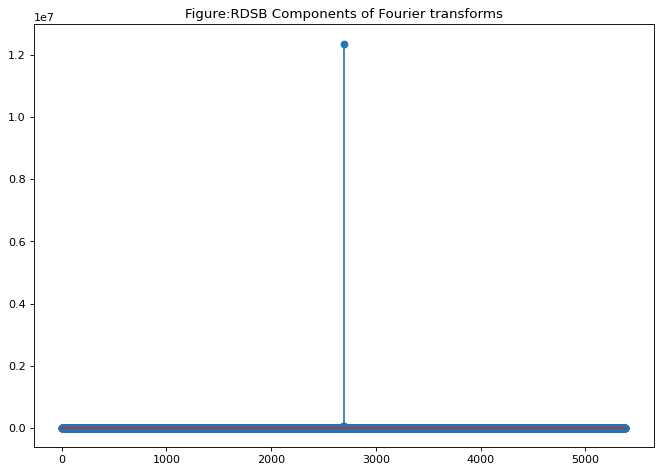

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:RDSB Components of Fourier transforms')
plt.show()

In [ ]:
data_FT_ULVR = dataset_ex_df_ULVR[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_ULVR['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

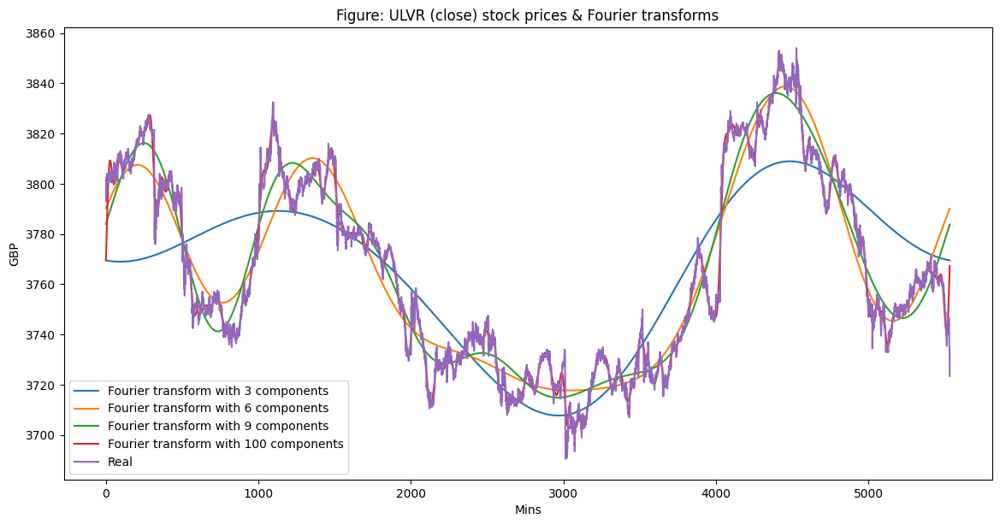

In [ ]:
plt.figure(figsize=(14, 7), dpi=100)
fft_list = np.asarray(fft_df['fft'].tolist())
for num_ in [3, 6, 9, 100]:
    fft_list_m10= np.copy(fft_list); fft_list_m10[num_:-num_]=0
    plt.plot(np.fft.ifft(fft_list_m10), label='Fourier transform with {} components'.format(num_))
plt.plot(data_FT_ULVR['Close'],  label='Real')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: ULVR (close) stock prices & Fourier transforms')
plt.legend()
plt.show()

In [ ]:
def get_fourier(dataset):
    data_FT_ULVR = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_ULVR['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [ ]:
dataset_TI_df_ULVR = get_fourier(dataset_ex_df_ULVR)
dataset_TI_df_ULVR.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,3805.0,3797.5,3806.0,3797.5,37356124.0,9819,NaN,NaN,3797.500000,3797.500000,0.00000,NaN,NaN,NaN,3797.500000,36.975,3797.5
1,2018-02-14 08:01:00,3801.0,3800.0,3801.0,3800.0,2485724.0,654,NaN,NaN,3798.798077,3798.854167,0.05609,NaN,NaN,NaN,3799.375000,37.000,3800.0
2,2018-02-14 08:02:00,3797.0,3793.0,3797.0,3793.0,2189957.0,577,NaN,NaN,3796.714884,3796.569284,-0.14560,NaN,NaN,NaN,3794.961538,36.930,3793.0


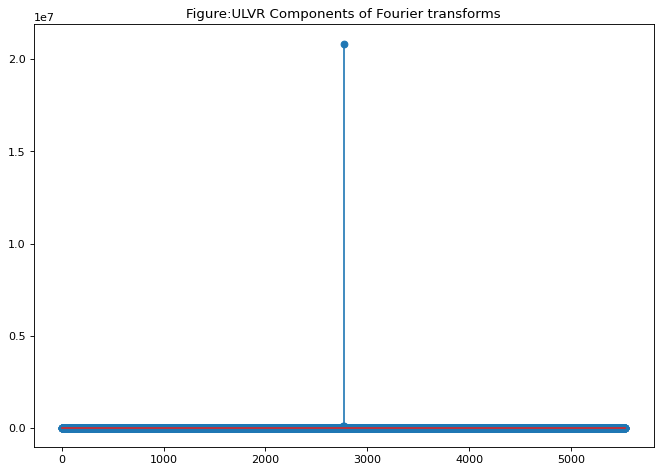

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:ULVR Components of Fourier transforms')
plt.show()

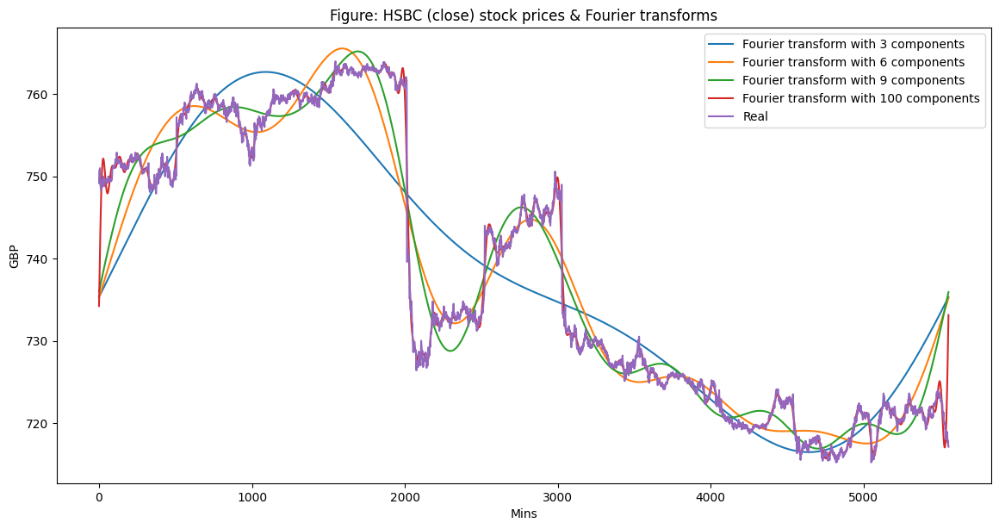

In [ ]:
data_FT_HSBC = dataset_ex_df_HSBC[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_HSBC['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

plt.figure(figsize=(14, 7), dpi=100)
fft_list = np.asarray(fft_df['fft'].tolist())
for num_ in [3, 6, 9, 100]:
    fft_list_m10= np.copy(fft_list); fft_list_m10[num_:-num_]=0
    plt.plot(np.fft.ifft(fft_list_m10), label='Fourier transform with {} components'.format(num_))
plt.plot(data_FT_HSBC['Close'],  label='Real')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: HSBC (close) stock prices & Fourier transforms')
plt.legend()
plt.show()

In [ ]:
def get_fourier(dataset):
    data_FT_HSBC = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_HSBC['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [ ]:
dataset_TI_df_HSBC = get_fourier(dataset_ex_df_HSBC)
dataset_TI_df_HSBC.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,751.0,749.2,751.0,749.2,1.607910e+09,2141500,NaN,NaN,749.200000,749.200000,0.000000,NaN,NaN,NaN,749.200000,6.492,749.2
1,2018-02-14 08:01:00,749.2,749.9,750.4,749.2,3.732991e+08,497829,NaN,NaN,749.563462,749.579167,0.015705,NaN,NaN,NaN,749.725000,6.499,749.9
2,2018-02-14 08:02:00,749.7,749.8,750.2,749.7,1.793002e+08,239086,NaN,NaN,749.648448,749.665358,0.016910,NaN,NaN,NaN,749.776923,6.498,749.8


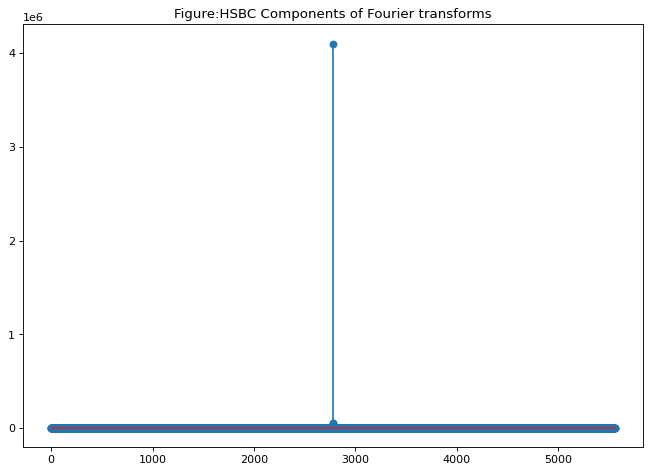

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:HSBC Components of Fourier transforms')
plt.show()

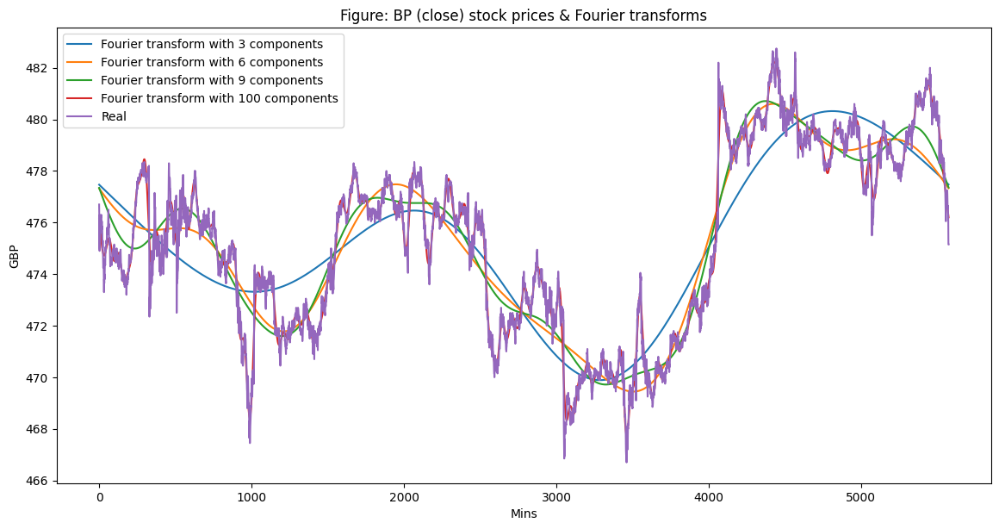

In [ ]:
data_FT_BP = dataset_ex_df_BP[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_BP['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

plt.figure(figsize=(14, 7), dpi=100)
fft_list = np.asarray(fft_df['fft'].tolist())
for num_ in [3, 6, 9, 100]:
    fft_list_m10= np.copy(fft_list); fft_list_m10[num_:-num_]=0
    plt.plot(np.fft.ifft(fft_list_m10), label='Fourier transform with {} components'.format(num_))
plt.plot(data_FT_BP['Close'],  label='Real')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: BP (close) stock prices & Fourier transforms')
plt.legend()
plt.show()

In [ ]:
def get_fourier(dataset):
    data_FT_BP = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_BP['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [ ]:
dataset_TI_df_BP = get_fourier(dataset_ex_df_BP)
dataset_TI_df_BP.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,477.00,476.70,478.00,476.50,159848064.0,335104,NaN,NaN,476.700000,476.700000,0.000000,NaN,NaN,NaN,476.700000,3.7670,476.70
1,2018-02-14 08:01:00,477.05,476.25,477.05,476.25,8042873.0,16879,NaN,NaN,476.466346,476.456250,-0.010096,NaN,NaN,NaN,476.362500,3.7625,476.25
2,2018-02-14 08:02:00,476.05,475.00,476.05,475.00,20259088.0,42595,NaN,NaN,475.939502,475.887875,-0.051627,NaN,NaN,NaN,475.419231,3.7500,475.00


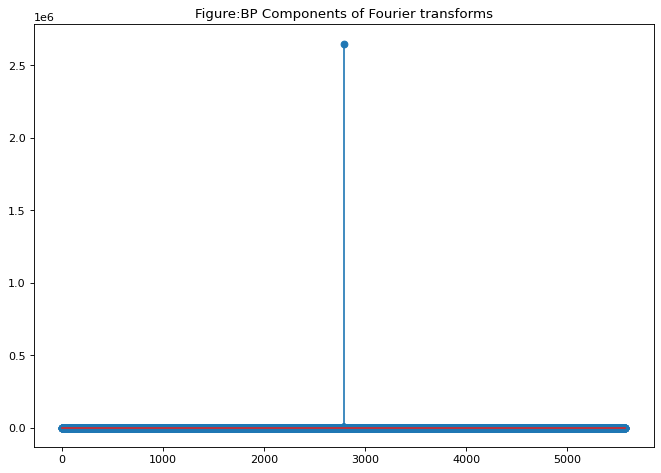

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:BP Components of Fourier transforms')
plt.show()

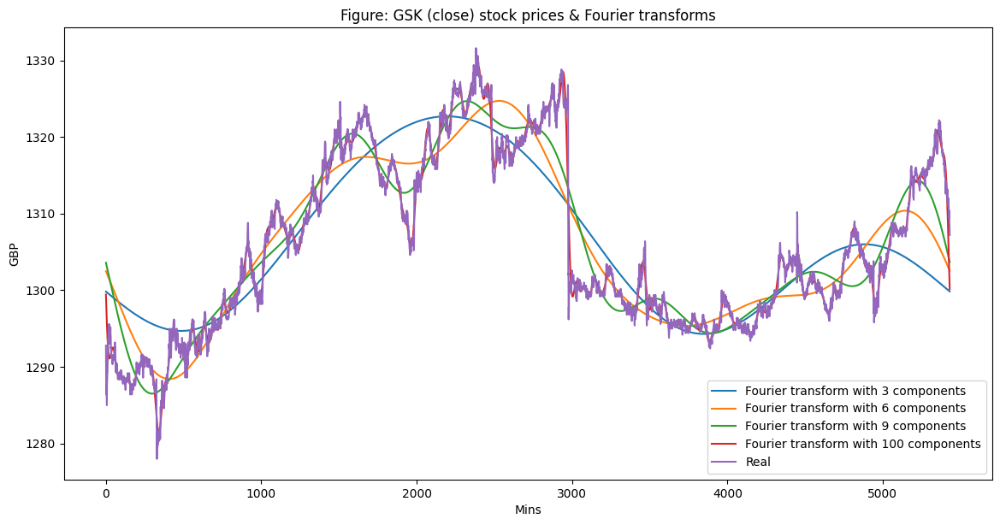

In [ ]:
data_FT_GSK = dataset_ex_df_GSK[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_GSK['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

plt.figure(figsize=(14, 7), dpi=100)
fft_list = np.asarray(fft_df['fft'].tolist())
for num_ in [3, 6, 9, 100]:
    fft_list_m10= np.copy(fft_list); fft_list_m10[num_:-num_]=0
    plt.plot(np.fft.ifft(fft_list_m10), label='Fourier transform with {} components'.format(num_))
plt.plot(data_FT_GSK['Close'],  label='Real')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: GSK (close) stock prices & Fourier transforms')
plt.legend()
plt.show()

In [ ]:
def get_fourier(dataset):
    data_FT_GSK = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_GSK['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [ ]:
dataset_TI_df_GSK = get_fourier(dataset_ex_df_GSK)
dataset_TI_df_GSK.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:01:00,1293.4,1292.8,1294.0,1291.0,138270720.0,106922,NaN,NaN,1292.800000,1292.800000,0.000000,NaN,NaN,NaN,1292.800000,11.928,1292.8
1,2018-02-14 08:00:00,1292.8,1288.8,1293.0,1288.8,11703298.0,9062,NaN,NaN,1290.723077,1290.633333,-0.089744,NaN,NaN,NaN,1289.800000,11.888,1288.8
2,2018-02-14 08:02:00,1288.2,1286.4,1289.6,1286.0,47523808.0,36896,NaN,NaN,1289.169837,1288.981062,-0.188775,NaN,NaN,NaN,1287.446154,11.864,1286.4


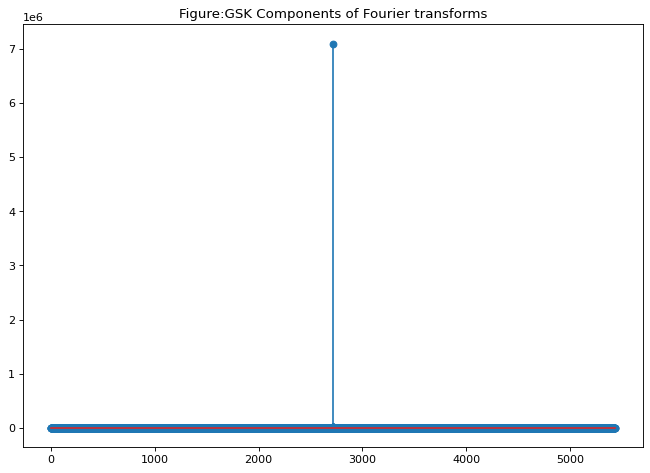

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:GSK Components of Fourier transforms')
plt.show()

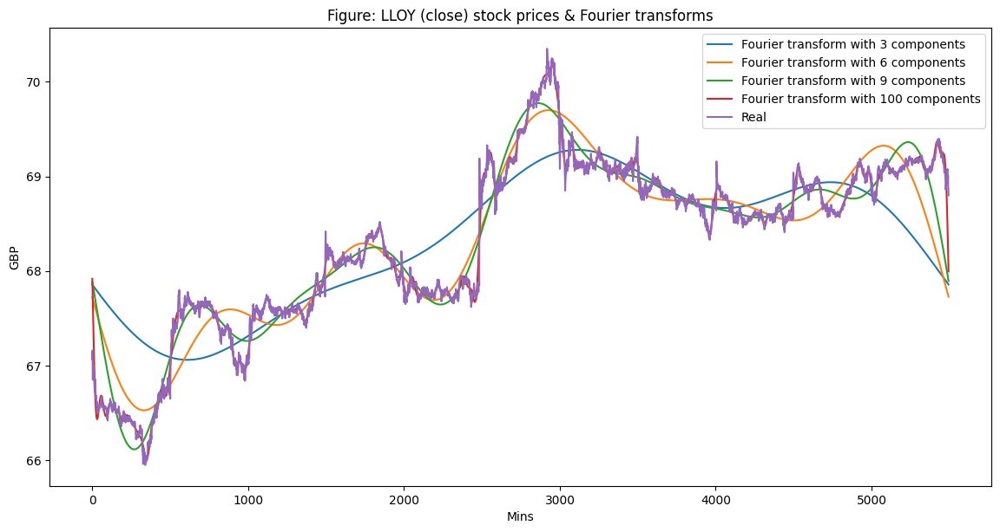

In [ ]:
data_FT_LLOY = dataset_ex_df_LLOY[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_LLOY['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

plt.figure(figsize=(14, 7), dpi=100)
fft_list = np.asarray(fft_df['fft'].tolist())
for num_ in [3, 6, 9, 100]:
    fft_list_m10= np.copy(fft_list); fft_list_m10[num_:-num_]=0
    plt.plot(np.fft.ifft(fft_list_m10), label='Fourier transform with {} components'.format(num_))
plt.plot(data_FT_LLOY['Close'],  label='Real')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: LLOY (close) stock prices & Fourier transforms')
plt.legend()
plt.show()

In [ ]:
def get_fourier(dataset):
    data_FT_LLOY = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_LLOY['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [ ]:
dataset_TI_df_LLOY = get_fourier(dataset_ex_df_LLOY)
dataset_TI_df_LLOY.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,67.00,67.07,67.07,66.98,145137808.0,2166164,NaN,NaN,67.070000,67.070000,0.000000,NaN,NaN,NaN,67.070000,-0.3293,67.07
1,2018-02-14 08:01:00,67.17,67.16,67.18,67.09,3393477.0,50537,NaN,NaN,67.116731,67.118750,0.002019,NaN,NaN,NaN,67.137500,-0.3284,67.16
2,2018-02-14 08:02:00,67.10,66.98,67.10,66.93,8503085.0,126862,NaN,NaN,67.067605,67.064596,-0.003009,NaN,NaN,NaN,67.028462,-0.3302,66.98


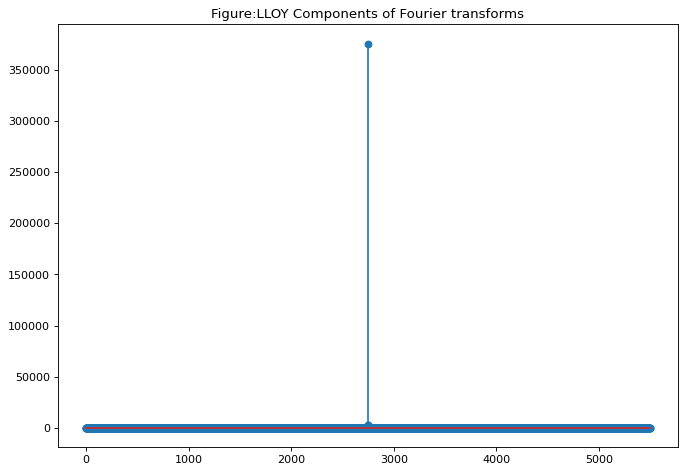

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:LLOY Components of Fourier transforms')
plt.show()

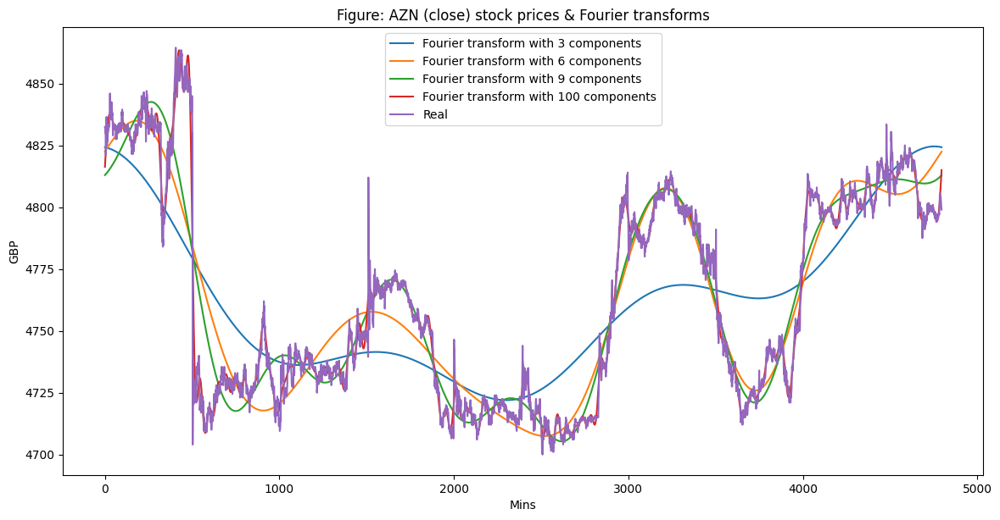

In [ ]:
data_FT_AZN = dataset_ex_df_AZN[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_AZN['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

plt.figure(figsize=(14, 7), dpi=100)
fft_list = np.asarray(fft_df['fft'].tolist())
for num_ in [3, 6, 9, 100]:
    fft_list_m10= np.copy(fft_list); fft_list_m10[num_:-num_]=0
    plt.plot(np.fft.ifft(fft_list_m10), label='Fourier transform with {} components'.format(num_))
plt.plot(data_FT_AZN['Close'],  label='Real')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: AZN (close) stock prices & Fourier transforms')
plt.legend()
plt.show()

In [ ]:
def get_fourier(dataset):
    data_FT_AZN = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_AZN['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [ ]:
dataset_TI_df_AZN = get_fourier(dataset_ex_df_AZN)
dataset_TI_df_AZN.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,4835.5,4832.5,4838.0,4832.5,78754400.0,16286,NaN,NaN,4832.500000,4832.500000,0.000000,NaN,NaN,NaN,4832.500000,47.325,4832.5
1,2018-02-14 08:01:00,4832.5,4832.5,4832.5,4832.5,1560897.5,323,NaN,NaN,4832.500000,4832.500000,0.000000,NaN,NaN,NaN,4832.500000,47.325,4832.5
2,2018-02-14 08:02:00,4834.5,4830.0,4838.0,4830.0,12914301.0,2672,NaN,NaN,4831.601774,4831.524249,-0.077525,NaN,NaN,NaN,4830.769231,47.300,4830.0


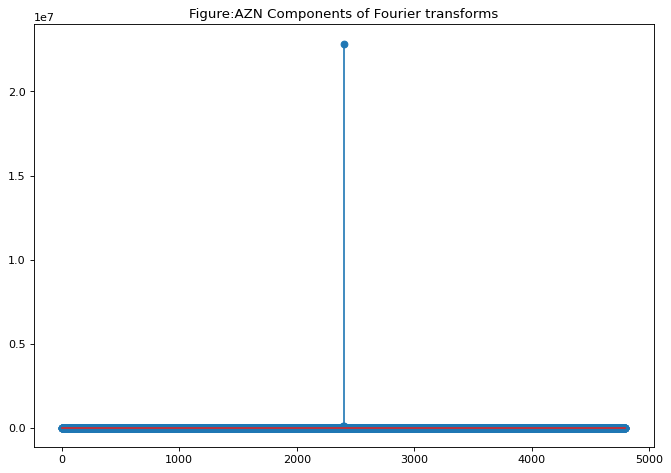

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:AZN Components of Fourier transforms')
plt.show()

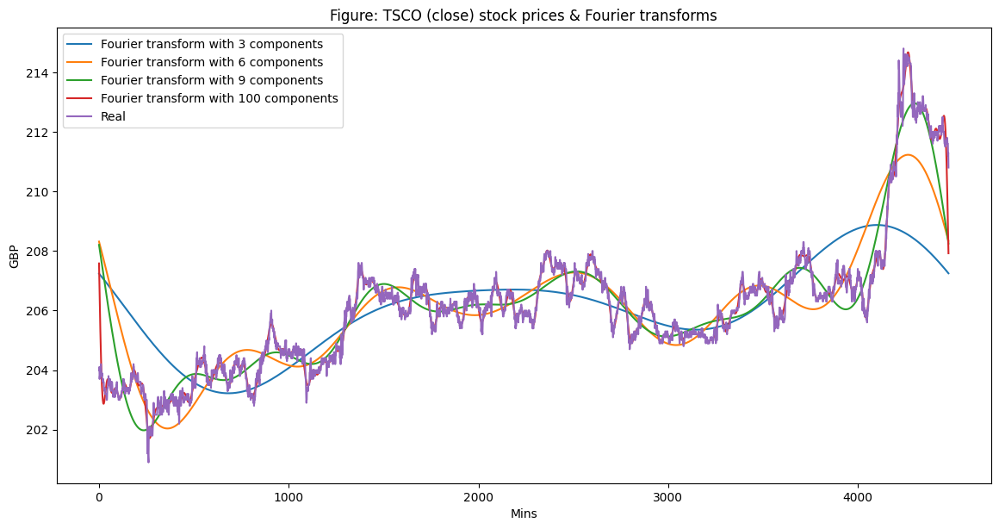

In [ ]:
data_FT_TSCO = dataset_ex_df_TSCO[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_TSCO['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

plt.figure(figsize=(14, 7), dpi=100)
fft_list = np.asarray(fft_df['fft'].tolist())
for num_ in [3, 6, 9, 100]:
    fft_list_m10= np.copy(fft_list); fft_list_m10[num_:-num_]=0
    plt.plot(np.fft.ifft(fft_list_m10), label='Fourier transform with {} components'.format(num_))
plt.plot(data_FT_TSCO['Close'],  label='Real')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: TSCO (close) stock prices & Fourier transforms')
plt.legend()
plt.show()

In [ ]:
def get_fourier(dataset):
    data_FT_TSCO = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_TSCO['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [ ]:
dataset_TI_df_TSCO = get_fourier(dataset_ex_df_TSCO)
dataset_TI_df_TSCO.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,204.0,204.0,204.0,204.0,5829504.0,28576,NaN,NaN,204.000000,204.000000,0.000000,NaN,NaN,NaN,204.000000,1.040,204.0
1,2018-02-14 08:01:00,204.1,204.1,204.1,204.1,913347.5,4475,NaN,NaN,204.051923,204.054167,0.002244,NaN,NaN,NaN,204.075000,1.041,204.1
2,2018-02-14 08:02:00,204.2,204.1,204.2,203.9,6534517.0,32026,NaN,NaN,204.069197,204.072055,0.002859,NaN,NaN,NaN,204.092308,1.041,204.1


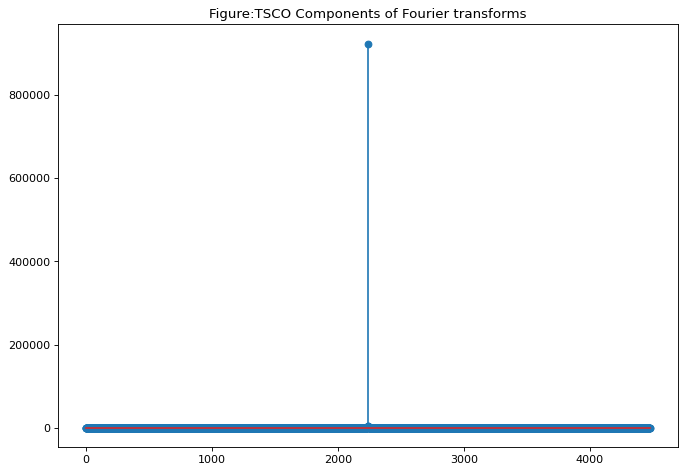

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:TSCO Components of Fourier transforms')
plt.show()

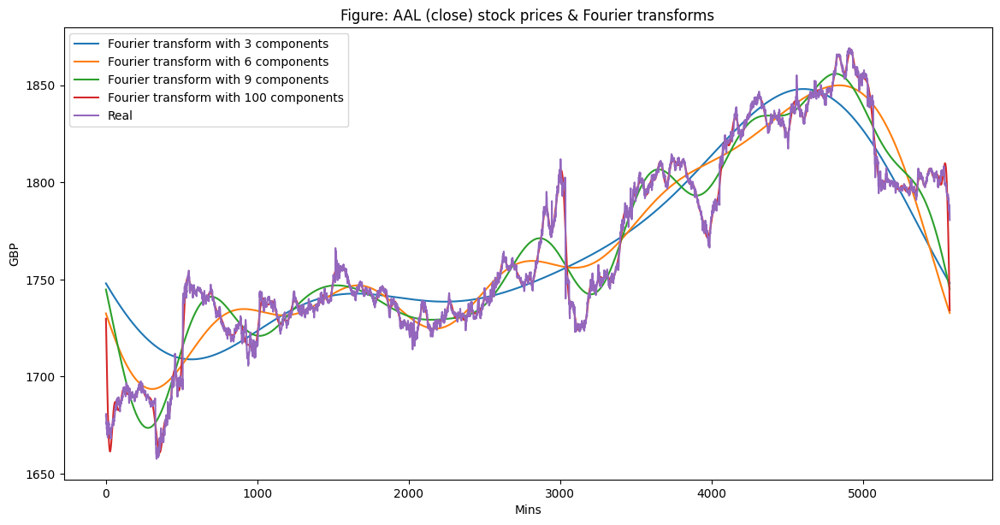

In [ ]:
data_FT_AAL = dataset_ex_df_AAL[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_AAL['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

plt.figure(figsize=(14, 7), dpi=100)
fft_list = np.asarray(fft_df['fft'].tolist())
for num_ in [3, 6, 9, 100]:
    fft_list_m10= np.copy(fft_list); fft_list_m10[num_:-num_]=0
    plt.plot(np.fft.ifft(fft_list_m10), label='Fourier transform with {} components'.format(num_))
plt.plot(data_FT_AAL['Close'],  label='Real')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: AAL (close) stock prices & Fourier transforms')
plt.legend()
plt.show()

In [ ]:
def get_fourier(dataset):
    data_FT_AAL = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_AAL['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [ ]:
dataset_TI_df_AAL = get_fourier(dataset_ex_df_AAL)
dataset_TI_df_AAL.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,1682.0,1679.8,1682.0,1677.6,36935376.0,21978,NaN,NaN,1679.800000,1679.800000,0.000000,NaN,NaN,NaN,1679.800000,15.798,1679.8
1,2018-02-14 08:01:00,1679.8,1680.8,1681.6,1678.0,28434078.0,16930,NaN,NaN,1680.319231,1680.341667,0.022436,NaN,NaN,NaN,1680.550000,15.808,1680.8
2,2018-02-14 08:02:00,1681.2,1679.0,1681.2,1678.0,24295556.0,14466,NaN,NaN,1679.845244,1679.818014,-0.027230,NaN,NaN,NaN,1679.476923,15.790,1679.0


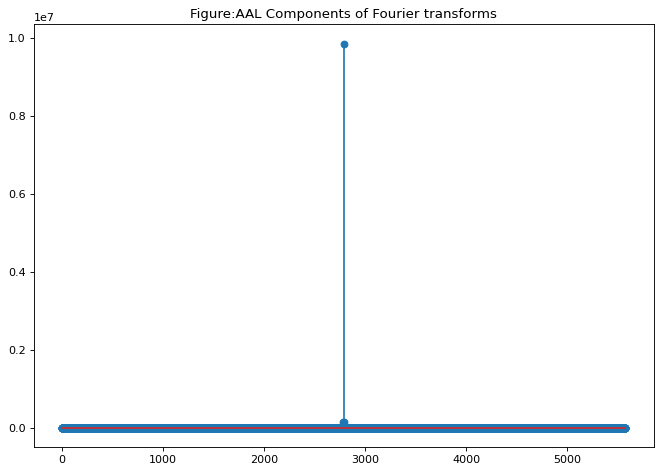

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:AAL Components of Fourier transforms')
plt.show()

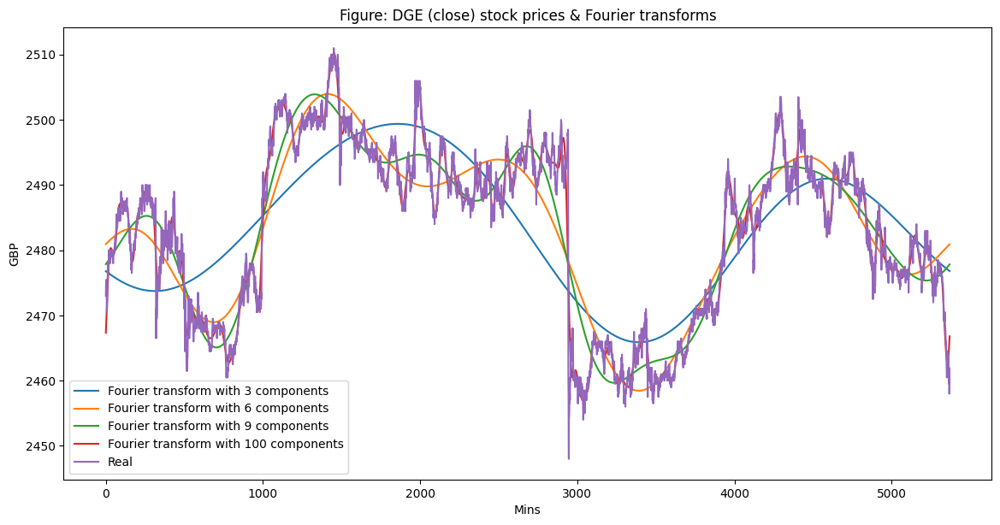

In [ ]:
data_FT_DGE = dataset_ex_df_DGE[['Dates', 'Close']]
close_fft = np.fft.fft(np.asarray(data_FT_DGE['Close'].tolist()))
fft_df = pd.DataFrame({'fft':close_fft})
fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))

plt.figure(figsize=(14, 7), dpi=100)
fft_list = np.asarray(fft_df['fft'].tolist())
for num_ in [3, 6, 9, 100]:
    fft_list_m10= np.copy(fft_list); fft_list_m10[num_:-num_]=0
    plt.plot(np.fft.ifft(fft_list_m10), label='Fourier transform with {} components'.format(num_))
plt.plot(data_FT_DGE['Close'],  label='Real')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: DGE (close) stock prices & Fourier transforms')
plt.legend()
plt.show()

In [ ]:
def get_fourier(dataset):
    data_FT_DGE = dataset[['Dates', 'Close']]
    close_fft = np.fft.fft(np.asarray(data_FT_DGE['Close'].tolist()))
    close_fft = np.fft.ifft(close_fft)
    close_fft
    fft_df = pd.DataFrame({'fft':close_fft})
    fft_df['absolute'] = fft_df['fft'].apply(lambda x: np.abs(x))
    fft_df['angle'] = fft_df['fft'].apply(lambda x: np.angle(x))
    fft_list = np.asarray(fft_df['fft'].tolist())
    fft_list_m10= np.copy(fft_list); fft_list_m10[100:-100]=0
    dataset['Fourier'] = pd.DataFrame(fft_list_m10).apply(lambda x: np.abs(x))
    #dataset['absolute'] = dataset['Fourier'].apply(lambda x: np.abs(x))
    return dataset

In [ ]:
dataset_TI_df_DGE = get_fourier(dataset_ex_df_DGE)
dataset_TI_df_DGE.head(3)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier
0,2018-02-14 08:00:00,2473.0,2473.0,2474.0,2472.0,92973784.0,37595,NaN,NaN,2473.000000,2473.000000,0.000000,NaN,NaN,NaN,2473.000000,23.730,2473.0
1,2018-02-14 08:01:00,2474.0,2474.5,2474.5,2474.0,2642458.5,1068,NaN,NaN,2473.778846,2473.812500,0.033654,NaN,NaN,NaN,2474.125000,23.745,2474.5
2,2018-02-14 08:02:00,2476.0,2475.0,2476.0,2475.0,19469766.0,7866,NaN,NaN,2474.217595,2474.275982,0.058387,NaN,NaN,NaN,2474.730769,23.750,2475.0


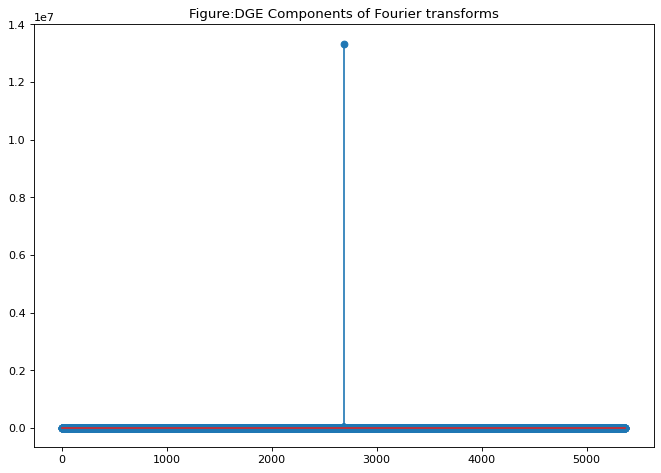

In [ ]:
from collections import deque
items = deque(np.asarray(fft_df['absolute'].tolist()))
items.rotate(int(np.floor(len(fft_df)/2)))
plt.figure(figsize=(10, 7), dpi=80)
plt.stem(items)
plt.title('Figure:DGE Components of Fourier transforms')
plt.show()

**4. ARIMA model as a feature**

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_RDSB = data_FT_RDSB['Close']
model = ARIMA(series_RDSB, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                 5381
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -8390.099
Method:                       css-mle   S.D. of innovations              1.151
Date:                Thu, 13 Aug 2020   AIC                          16794.199
Time:                        10:22:31   BIC                          16840.333
Sample:                             1   HQIC                         16810.308
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0012      0.015      0.082      0.935      -0.028       0.030
ar.L1.D.Close    -0.0059      0.014     -0.429      0.668      -0.033       0.021
ar.L2.D.Close    -0.0289      0.014     

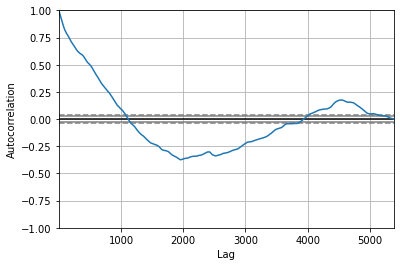

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_RDSB)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_RDSB.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_RDSB['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 0.969
Test MAE: 0.658
Test RMSE: 0.984
Test accuracy: 0.998


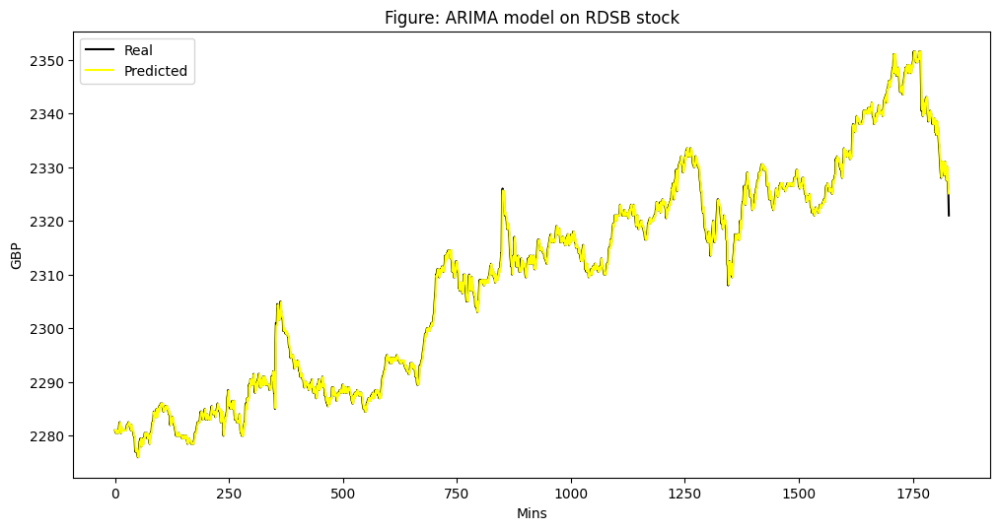

In [ ]:
# Plot the predicted (from ARIMA) and real prices
plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: ARIMA model on RDSB stock')
plt.legend()
plt.show()

In [ ]:
dataset_ex_df_RDSB.head(3)
dataset_ex_df_RDSB.info()
print('Total RDSB dataset has {} samples, and {} features.'.format(dataset_ex_df_RDSB.shape[0], \
                                                              dataset_ex_df_RDSB.shape[1]))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5382 entries, 0 to 5381
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       5382 non-null   datetime64[ns]
 1   Open        5382 non-null   float64       
 2   Close       5382 non-null   float64       
 3   High        5382 non-null   float64       
 4   Low         5382 non-null   float64       
 5   Value       5382 non-null   float64       
 6   Volume      5382 non-null   int64         
 7   ma7         5376 non-null   float64       
 8   ma21        5362 non-null   float64       
 9   26ema       5382 non-null   float64       
 10  12ema       5382 non-null   float64       
 11  MACD        5382 non-null   float64       
 12  20sd        5363 non-null   float64       
 13  upper_band  5363 non-null   float64       
 14  lower_band  5363 non-null   float64       
 15  ema         5382 non-null   float64       
 16  momentum    5382 non-nul

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_ULVR = data_FT_ULVR['Close']
model = ARIMA(series_ULVR, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                 5533
Model:                 ARIMA(5, 1, 0)   Log Likelihood              -11301.204
Method:                       css-mle   S.D. of innovations              1.866
Date:                Thu, 13 Aug 2020   AIC                          22616.407
Time:                        10:38:53   BIC                          22662.737
Sample:                             1   HQIC                         22632.562
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0134      0.025     -0.540      0.589      -0.062       0.035
ar.L1.D.Close    -0.0582      0.013     -4.316      0.000      -0.085      -0.032
ar.L2.D.Close     0.0546      0.014     

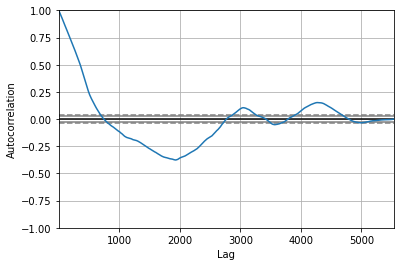

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_ULVR)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_ULVR.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_ULVR['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 3.251
Test MAE: 1.240
Test RMSE: 1.803
Test accuracy: 0.997


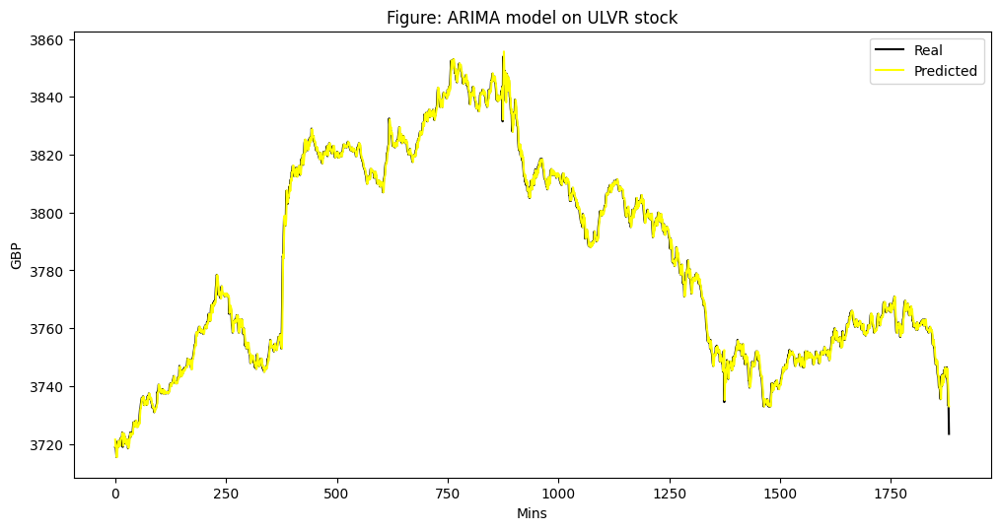

In [ ]:
# Plot the predicted (from ARIMA) and real prices
plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: ARIMA model on ULVR stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_ULVR.head(3))
print(dataset_ex_df_ULVR.info())
print('\n Total ULVR dataset has {} samples, and {} features.'.format(dataset_ex_df_ULVR.shape[0], \
                                                              dataset_ex_df_ULVR.shape[1]))

                Dates    Open   Close  ...  momentum  Fourier        ARIMA
0 2018-02-14 08:00:00  3805.0  3797.5  ...    36.975   3797.5  3721.546548
1 2018-02-14 08:01:00  3801.0  3800.0  ...    37.000   3800.0  3718.949469
2 2018-02-14 08:02:00  3797.0  3793.0  ...    36.930   3793.0  3719.381485

[3 rows x 19 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5534 entries, 0 to 5533
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       5534 non-null   datetime64[ns]
 1   Open        5534 non-null   float64       
 2   Close       5534 non-null   float64       
 3   High        5534 non-null   float64       
 4   Low         5534 non-null   float64       
 5   Value       5534 non-null   float64       
 6   Volume      5534 non-null   int64         
 7   ma7         5528 non-null   float64       
 8   ma21        5514 non-null   float64       
 9   26ema       5534 non-null   float64  

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_HSBC = data_FT_HSBC['Close']
model = ARIMA(series_HSBC, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                 5556
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -3453.367
Method:                       css-mle   S.D. of innovations              0.451
Date:                Thu, 13 Aug 2020   AIC                           6920.734
Time:                        10:49:12   BIC                           6967.093
Sample:                             1   HQIC                          6936.896
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0058      0.006     -0.931      0.352      -0.018       0.006
ar.L1.D.Close     0.0322      0.013      2.401      0.016       0.006       0.059
ar.L2.D.Close    -0.0125      0.013     

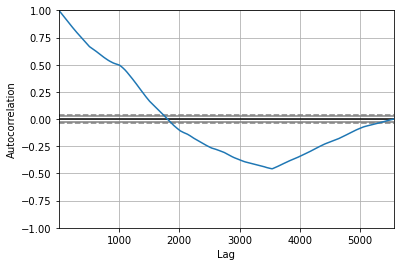

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_HSBC)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_HSBC.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_HSBC['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 0.069
Test MAE: 0.176
Test RMSE: 0.262
Test accuracy: 0.991


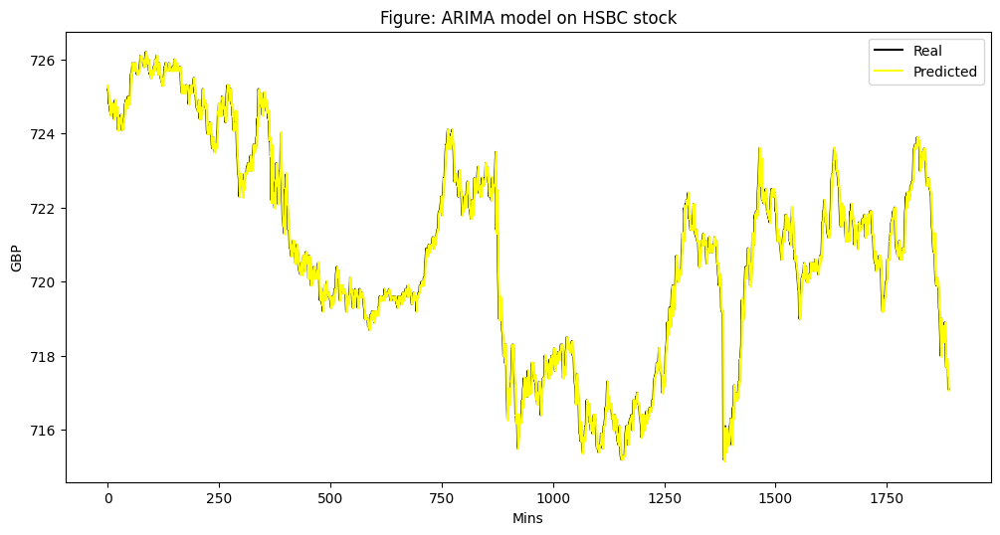

In [ ]:
# Plot the predicted (from ARIMA) and real prices
plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: ARIMA model on HSBC stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_HSBC.head(3))
print(dataset_ex_df_HSBC.info())
print('\n Total HSBC dataset has {} samples, and {} features.'.format(dataset_ex_df_HSBC.shape[0], \
                                                              dataset_ex_df_HSBC.shape[1]))

                Dates   Open  Close  ...  momentum  Fourier       ARIMA
0 2018-02-14 08:00:00  751.0  749.2  ...     6.492    749.2  725.294564
1 2018-02-14 08:01:00  749.2  749.9  ...     6.499    749.9  725.190551
2 2018-02-14 08:02:00  749.7  749.8  ...     6.498    749.8  725.188952

[3 rows x 19 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5557 entries, 0 to 5556
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       5557 non-null   datetime64[ns]
 1   Open        5557 non-null   float64       
 2   Close       5557 non-null   float64       
 3   High        5557 non-null   float64       
 4   Low         5557 non-null   float64       
 5   Value       5557 non-null   float64       
 6   Volume      5557 non-null   int64         
 7   ma7         5551 non-null   float64       
 8   ma21        5537 non-null   float64       
 9   26ema       5557 non-null   float64       
 10  1

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_BP = data_FT_BP['Close']
model = ARIMA(series_BP, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                 5574
Model:                 ARIMA(5, 1, 0)   Log Likelihood                -148.990
Method:                       css-mle   S.D. of innovations              0.249
Date:                Thu, 13 Aug 2020   AIC                            311.980
Time:                        10:59:14   BIC                            358.361
Sample:                             1   HQIC                           328.146
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0003      0.003     -0.083      0.934      -0.007       0.006
ar.L1.D.Close     0.0038      0.013      0.284      0.777      -0.022       0.030
ar.L2.D.Close    -0.0177      0.013     

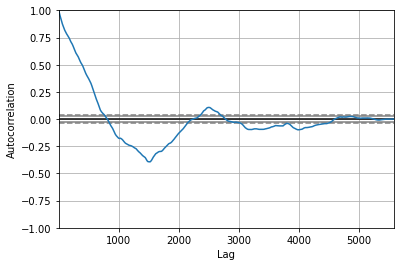

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_BP)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_BP.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_BP['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 0.052
Test MAE: 0.141
Test RMSE: 0.229
Test accuracy: 0.995


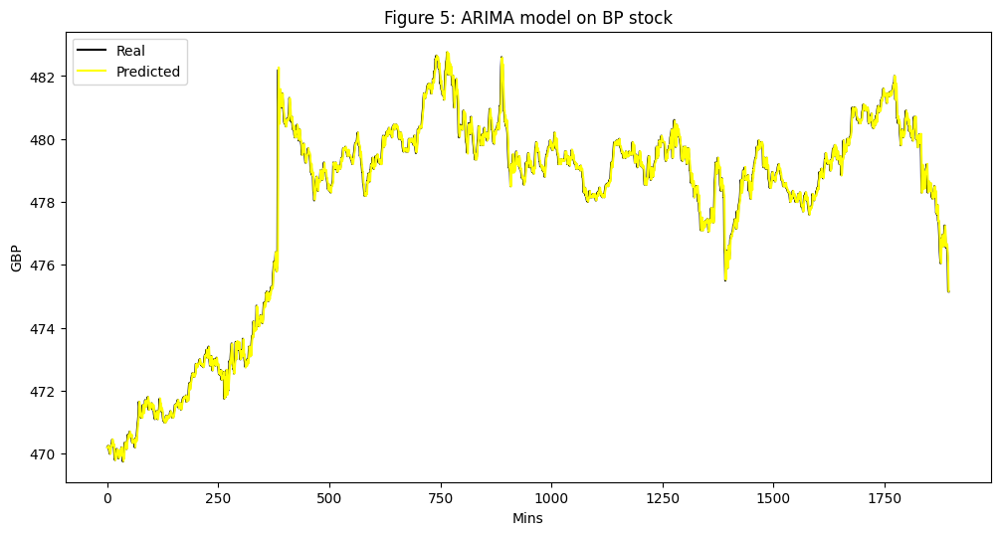

In [ ]:
# Plot the predicted (from ARIMA) and real prices

plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure 5: ARIMA model on BP stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_BP.head(3))
print(dataset_ex_df_BP.info())
print('\n Total BP dataset has {} samples, and {} features.'.format(dataset_ex_df_BP.shape[0], \
                                                              dataset_ex_df_BP.shape[1]))

                Dates    Open   Close  ...  momentum  Fourier       ARIMA
0 2018-02-14 08:00:00  477.00  476.70  ...    3.7670   476.70  470.195786
1 2018-02-14 08:01:00  477.05  476.25  ...    3.7625   476.25  470.191943
2 2018-02-14 08:02:00  476.05  475.00  ...    3.7500   475.00  470.210510

[3 rows x 19 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5575 entries, 0 to 5574
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       5575 non-null   datetime64[ns]
 1   Open        5575 non-null   float64       
 2   Close       5575 non-null   float64       
 3   High        5575 non-null   float64       
 4   Low         5575 non-null   float64       
 5   Value       5575 non-null   float64       
 6   Volume      5575 non-null   int64         
 7   ma7         5569 non-null   float64       
 8   ma21        5555 non-null   float64       
 9   26ema       5575 non-null   float64      

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_GSK = data_FT_GSK['Close']
model = ARIMA(series_GSK, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                 5431
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -5367.081
Method:                       css-mle   S.D. of innovations              0.650
Date:                Thu, 13 Aug 2020   AIC                          10748.162
Time:                        11:13:14   BIC                          10794.361
Sample:                             1   HQIC                         10764.287
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0027      0.008      0.331      0.741      -0.013       0.019
ar.L1.D.Close    -0.0332      0.014     -2.438      0.015      -0.060      -0.007
ar.L2.D.Close     0.0638      0.014     

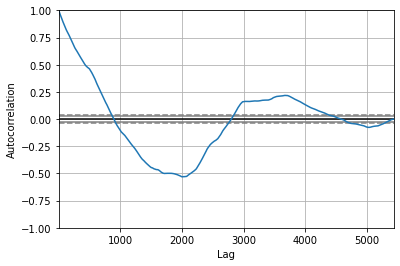

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_GSK)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame

X = series_GSK.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_GSK['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 0.283
Test MAE: 0.332
Test RMSE: 0.532
Test accuracy: 0.994


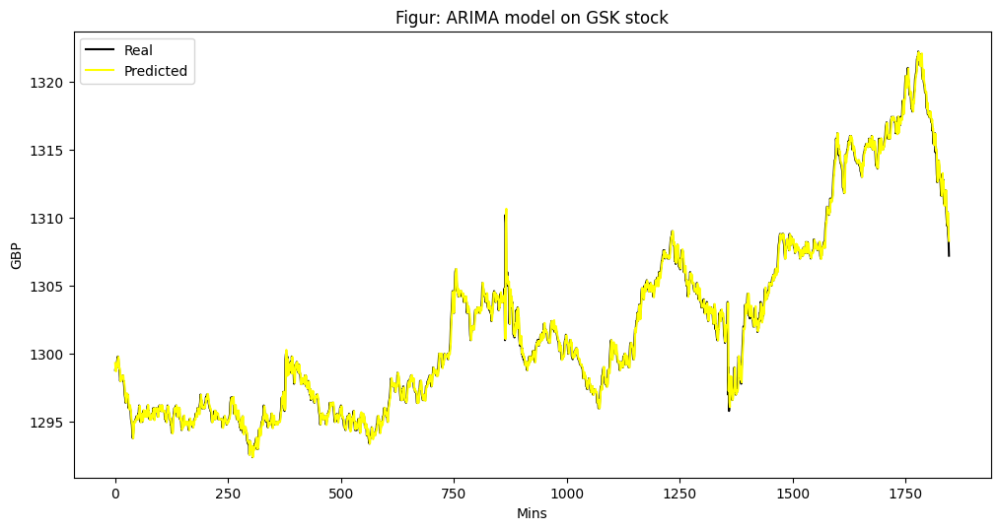

In [ ]:
# Plot the predicted (from ARIMA) and real prices

plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figur: ARIMA model on GSK stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_GSK.head(3))
print(dataset_ex_df_GSK.info())
print('\n Total GSK dataset has {} samples, and {} features.'.format(dataset_ex_df_GSK.shape[0], \
                                                              dataset_ex_df_GSK.shape[1]))

                Dates    Open   Close  ...  momentum  Fourier        ARIMA
0 2018-02-14 08:01:00  1293.4  1292.8  ...    11.928   1292.8  1299.319966
1 2018-02-14 08:00:00  1292.8  1288.8  ...    11.888   1288.8  1298.790351
2 2018-02-14 08:02:00  1288.2  1286.4  ...    11.864   1286.4  1298.706242

[3 rows x 19 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5432 entries, 0 to 5431
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       5432 non-null   datetime64[ns]
 1   Open        5432 non-null   float64       
 2   Close       5432 non-null   float64       
 3   High        5432 non-null   float64       
 4   Low         5432 non-null   float64       
 5   Value       5432 non-null   float64       
 6   Volume      5432 non-null   int64         
 7   ma7         5426 non-null   float64       
 8   ma21        5412 non-null   float64       
 9   26ema       5432 non-null   float64  

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_LLOY = data_FT_LLOY['Close']
model = ARIMA(series_LLOY, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                 5494
Model:                 ARIMA(5, 1, 0)   Log Likelihood               10212.528
Method:                       css-mle   S.D. of innovations              0.038
Date:                Thu, 13 Aug 2020   AIC                         -20411.055
Time:                        11:24:16   BIC                         -20364.775
Sample:                             1   HQIC                        -20394.912
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0003      0.000      0.684      0.494      -0.001       0.001
ar.L1.D.Close    -0.0757      0.013     -5.607      0.000      -0.102      -0.049
ar.L2.D.Close    -0.0133      0.014     

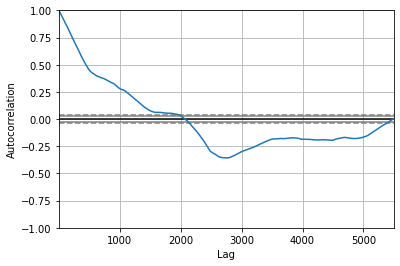

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_LLOY)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_LLOY.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_LLOY['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 0.001
Test MAE: 0.018
Test RMSE: 0.028
Test accuracy: 0.985


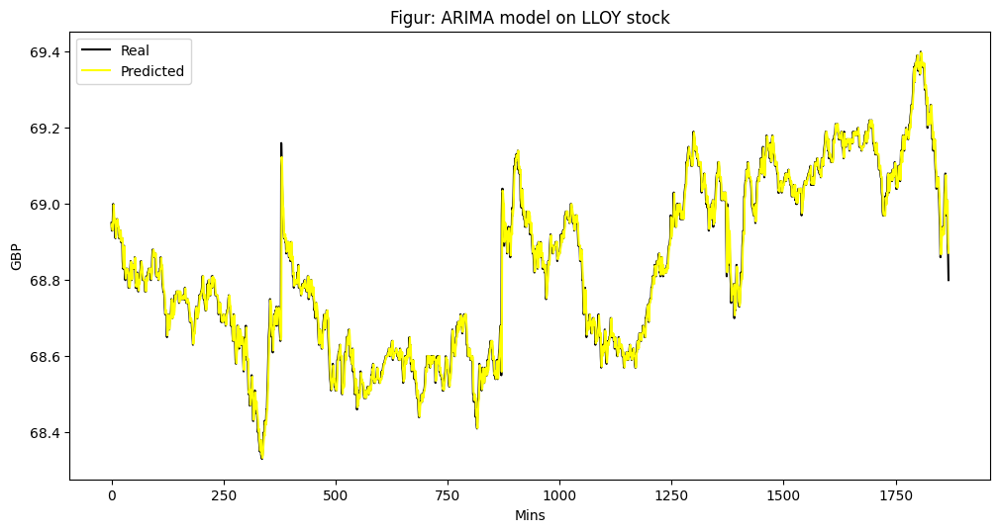

In [ ]:
# Plot the predicted (from ARIMA) and real prices

plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figur: ARIMA model on LLOY stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_LLOY.head(3))
print(dataset_ex_df_LLOY.info())
print('\n Total LLOY dataset has {} samples, and {} features.'.format(dataset_ex_df_LLOY.shape[0], \
                                                              dataset_ex_df_LLOY.shape[1]))

                Dates   Open  Close  ...  momentum  Fourier      ARIMA
0 2018-02-14 08:00:00  67.00  67.07  ...   -0.3293    67.07  68.941338
1 2018-02-14 08:01:00  67.17  67.16  ...   -0.3284    67.16  68.947954
2 2018-02-14 08:02:00  67.10  66.98  ...   -0.3302    66.98  68.932713

[3 rows x 19 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5495 entries, 0 to 5494
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       5495 non-null   datetime64[ns]
 1   Open        5495 non-null   float64       
 2   Close       5495 non-null   float64       
 3   High        5495 non-null   float64       
 4   Low         5495 non-null   float64       
 5   Value       5495 non-null   float64       
 6   Volume      5495 non-null   int64         
 7   ma7         5489 non-null   float64       
 8   ma21        5475 non-null   float64       
 9   26ema       5495 non-null   float64       
 10  12ema

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_AZN = data_FT_AZN['Close']
model = ARIMA(series_AZN, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                 4795
Model:                 ARIMA(5, 1, 0)   Log Likelihood              -12194.338
Method:                       css-mle   S.D. of innovations              3.078
Date:                Thu, 13 Aug 2020   AIC                          24402.675
Time:                        11:44:36   BIC                          24448.003
Sample:                             1   HQIC                         24418.595
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0067      0.037     -0.184      0.854      -0.078       0.065
ar.L1.D.Close    -0.0583      0.014     -4.043      0.000      -0.087      -0.030
ar.L2.D.Close    -0.0576      0.014     

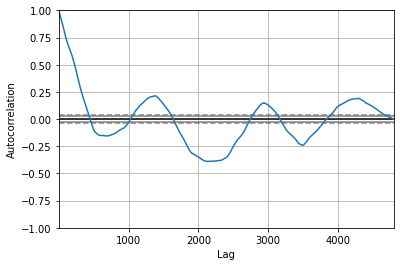

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_AZN)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_AZN.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_AZN['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 4.146
Test MAE: 1.387
Test RMSE: 2.036
Test accuracy: 0.996


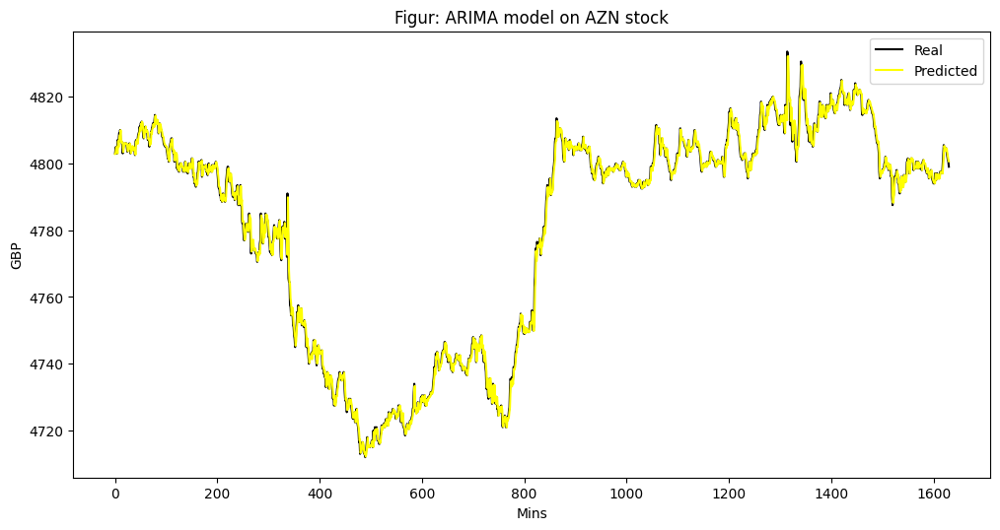

In [ ]:
# Plot the predicted (from ARIMA) and real prices

plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figur: ARIMA model on AZN stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_AZN.head(3))
print(dataset_ex_df_AZN.info())
print('\n Total AZN dataset has {} samples, and {} features.'.format(dataset_ex_df_AZN.shape[0], \
                                                              dataset_ex_df_AZN.shape[1]))

                Dates    Open   Close  ...  momentum  Fourier        ARIMA
0 2018-02-14 08:00:00  4835.5  4832.5  ...    47.325   4832.5  4802.847700
1 2018-02-14 08:01:00  4832.5  4832.5  ...    47.325   4832.5  4803.057467
2 2018-02-14 08:02:00  4834.5  4830.0  ...    47.300   4830.0  4804.386656

[3 rows x 19 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4796 entries, 0 to 4795
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       4796 non-null   datetime64[ns]
 1   Open        4796 non-null   float64       
 2   Close       4796 non-null   float64       
 3   High        4796 non-null   float64       
 4   Low         4796 non-null   float64       
 5   Value       4796 non-null   float64       
 6   Volume      4796 non-null   int64         
 7   ma7         4790 non-null   float64       
 8   ma21        4776 non-null   float64       
 9   26ema       4796 non-null   float64  

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_TSCO = data_FT_TSCO['Close']
model = ARIMA(series_TSCO, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                 4477
Model:                 ARIMA(5, 1, 0)   Log Likelihood                2643.814
Method:                       css-mle   S.D. of innovations              0.134
Date:                Thu, 13 Aug 2020   AIC                          -5273.628
Time:                        11:54:03   BIC                          -5228.781
Sample:                             1   HQIC                         -5257.822
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0015      0.002      0.863      0.388      -0.002       0.005
ar.L1.D.Close    -0.0896      0.015     -5.984      0.000      -0.119      -0.060
ar.L2.D.Close     0.0319      0.015     

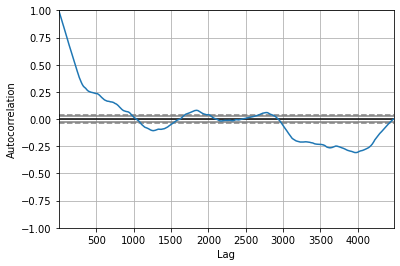

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_TSCO)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_TSCO.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_TSCO['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 0.021
Test MAE: 0.092
Test RMSE: 0.146
Test accuracy: 0.997


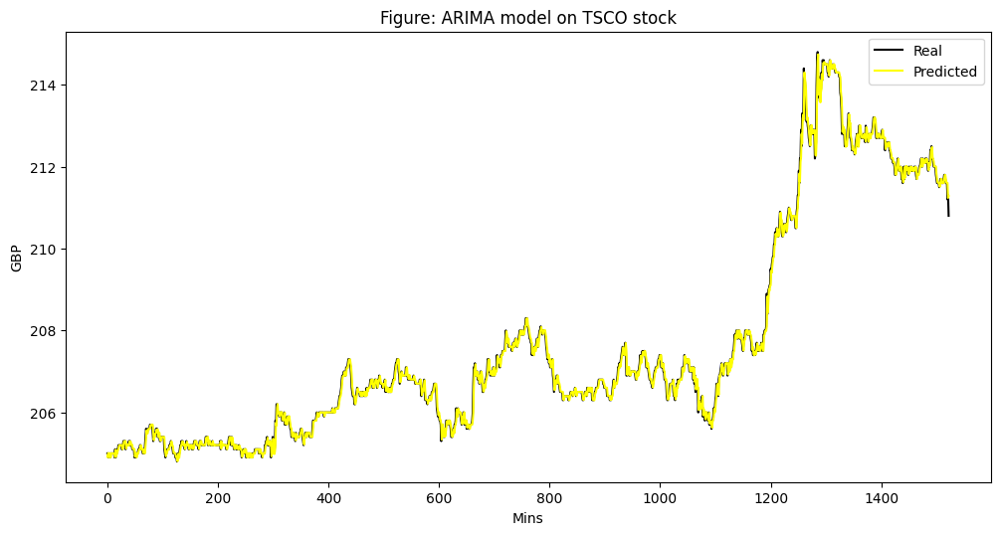

In [ ]:
# Plot the predicted (from ARIMA) and real prices

plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: ARIMA model on TSCO stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_TSCO.head(3))
print(dataset_ex_df_TSCO.info())
print('\n Total TSCO dataset has {} samples, and {} features.'.format(dataset_ex_df_TSCO.shape[0], \
                                                              dataset_ex_df_TSCO.shape[1]))

                Dates   Open  Close  ...  momentum  Fourier       ARIMA
0 2018-02-14 08:00:00  204.0  204.0  ...     1.040    204.0  204.915684
1 2018-02-14 08:01:00  204.1  204.1  ...     1.041    204.1  204.994430
2 2018-02-14 08:02:00  204.2  204.1  ...     1.041    204.1  205.006021

[3 rows x 19 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4478 entries, 0 to 4477
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       4478 non-null   datetime64[ns]
 1   Open        4478 non-null   float64       
 2   Close       4478 non-null   float64       
 3   High        4478 non-null   float64       
 4   Low         4478 non-null   float64       
 5   Value       4478 non-null   float64       
 6   Volume      4478 non-null   int64         
 7   ma7         4472 non-null   float64       
 8   ma21        4458 non-null   float64       
 9   26ema       4478 non-null   float64       
 10  1

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_AAL = data_FT_AAL['Close']
model = ARIMA(series_AAL, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                 5573
Model:                 ARIMA(5, 1, 0)   Log Likelihood              -11251.805
Method:                       css-mle   S.D. of innovations              1.822
Date:                Thu, 13 Aug 2020   AIC                          22517.611
Time:                        12:13:41   BIC                          22563.990
Sample:                             1   HQIC                         22533.777
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const             0.0182      0.023      0.803      0.422      -0.026       0.063
ar.L1.D.Close    -0.0643      0.013     -4.802      0.000      -0.091      -0.038
ar.L2.D.Close     0.0355      0.013     

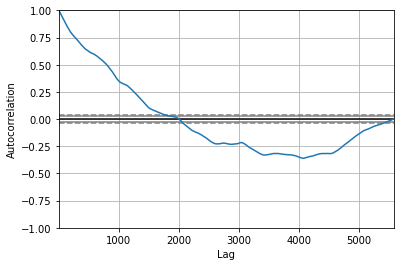

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_AAL)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_AAL.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_AAL['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 2.349
Test MAE: 1.007
Test RMSE: 1.533
Test accuracy: 0.996


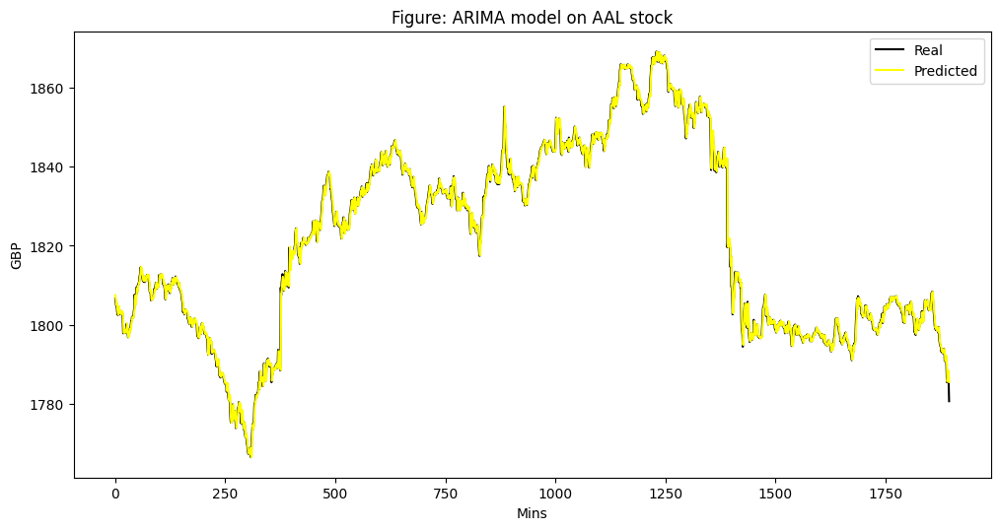

In [ ]:
# Plot the predicted (from ARIMA) and real prices

plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: ARIMA model on AAL stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_AAL.head(3))
print(dataset_ex_df_AAL.info())
print('\n Total AAL dataset has {} samples, and {} features.'.format(dataset_ex_df_AAL.shape[0], \
                                                              dataset_ex_df_AAL.shape[1]))

                Dates    Open   Close  ...  momentum  Fourier        ARIMA
0 2018-02-14 08:00:00  1682.0  1679.8  ...    15.798   1679.8  1807.473879
1 2018-02-14 08:01:00  1679.8  1680.8  ...    15.808   1680.8  1806.620607
2 2018-02-14 08:02:00  1681.2  1679.0  ...    15.790   1679.0  1805.692852

[3 rows x 19 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5574 entries, 0 to 5573
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       5574 non-null   datetime64[ns]
 1   Open        5574 non-null   float64       
 2   Close       5574 non-null   float64       
 3   High        5574 non-null   float64       
 4   Low         5574 non-null   float64       
 5   Value       5574 non-null   float64       
 6   Volume      5574 non-null   int64         
 7   ma7         5568 non-null   float64       
 8   ma21        5554 non-null   float64       
 9   26ema       5574 non-null   float64  

In [ ]:
from statsmodels.tsa.arima_model import ARIMA
from pandas import DataFrame
from pandas import datetime

series_DGE = data_FT_DGE['Close']
model = ARIMA(series_DGE, order=(5, 1, 0))
model_fit = model.fit(disp=0)
print(model_fit.summary())

                             ARIMA Model Results                              
Dep. Variable:                D.Close   No. Observations:                 5369
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -8031.148
Method:                       css-mle   S.D. of innovations              1.080
Date:                Thu, 13 Aug 2020   AIC                          16076.295
Time:                        12:21:49   BIC                          16122.414
Sample:                             1   HQIC                         16092.401
                                                                              
                    coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------
const            -0.0024      0.014     -0.169      0.866      -0.031       0.026
ar.L1.D.Close    -0.0246      0.014     -1.802      0.072      -0.051       0.002
ar.L2.D.Close     0.0339      0.014     

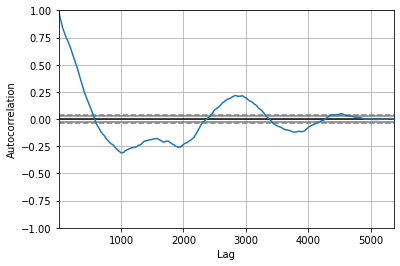

<Figure size 800x560 with 0 Axes>

In [ ]:
from pandas.plotting import autocorrelation_plot
autocorrelation_plot(series_DGE)
plt.figure(figsize=(10, 7), dpi=80)
plt.show()

In [ ]:
from pandas import datetime
from pandas import DataFrame


X = series_DGE.values
size = int(len(X) * 0.66)
train, test = X[0:size], X[size:len(X)]
history = [x for x in train]
predictions = list()
for t in range(len(test)):
    model = ARIMA(history, order=(5,1,0))
    model_fit = model.fit(disp=0)
    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(yhat)
    obs = test[t]
    history.append(obs)

dataset_TI_df_DGE['ARIMA'] = pd.DataFrame(predictions)

In [ ]:
from math import sqrt
mse = mean_squared_error(test, predictions)
mae = mean_absolute_error(test, predictions)
rmse = sqrt(mean_squared_error(test, predictions))
accuracy = r2_score(test, predictions)
print('Test MSE: %.3f' % mse)
print('Test MAE: %.3f' % mae)
print('Test RMSE: %.3f' % rmse)
print('Test accuracy: %.3f' % accuracy)

Test MSE: 0.809
Test MAE: 0.630
Test RMSE: 0.899
Test accuracy: 0.992


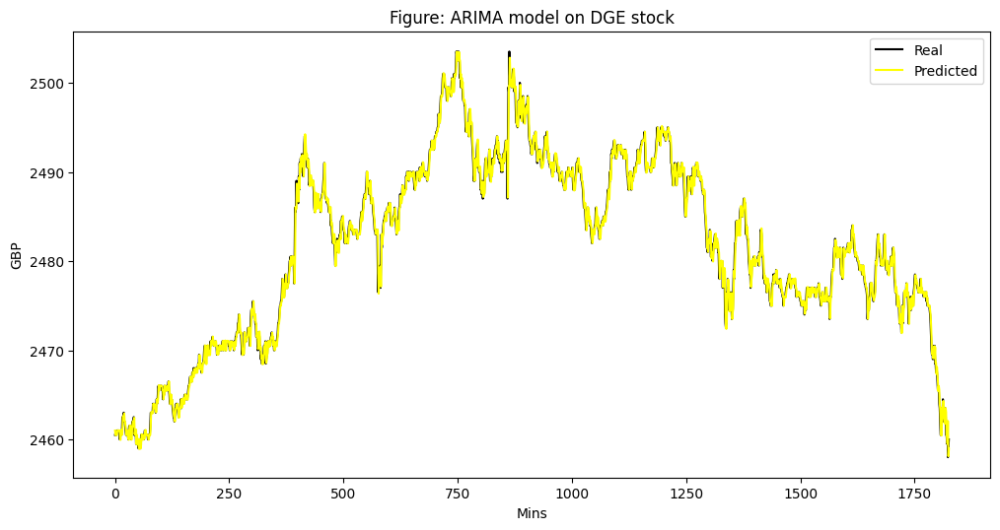

In [ ]:
# Plot the predicted (from ARIMA) and real prices

plt.figure(figsize=(12, 6), dpi=100)
plt.plot(test, color='black', label='Real')
plt.plot(predictions, color='yellow', label='Predicted')
plt.xlabel('Mins')
plt.ylabel('GBP')
plt.title('Figure: ARIMA model on DGE stock')
plt.legend()
plt.show()

In [ ]:
print(dataset_ex_df_DGE.head(3))
print(dataset_ex_df_DGE.info())
print('\n Total DGE dataset has {} samples, and {} features.'.format(dataset_ex_df_DGE.shape[0], \
                                                              dataset_ex_df_DGE.shape[1]))

                Dates    Open   Close  ...  momentum  Fourier        ARIMA
0 2018-02-14 08:00:00  2473.0  2473.0  ...    23.730   2473.0  2460.993090
1 2018-02-14 08:01:00  2474.0  2474.5  ...    23.745   2474.5  2460.495066
2 2018-02-14 08:02:00  2476.0  2475.0  ...    23.750   2475.0  2460.487199

[3 rows x 19 columns]
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5370 entries, 0 to 5369
Data columns (total 19 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       5370 non-null   datetime64[ns]
 1   Open        5370 non-null   float64       
 2   Close       5370 non-null   float64       
 3   High        5370 non-null   float64       
 4   Low         5370 non-null   float64       
 5   Value       5370 non-null   float64       
 6   Volume      5370 non-null   int64         
 7   ma7         5364 non-null   float64       
 8   ma21        5350 non-null   float64       
 9   26ema       5370 non-null   float64  

**4. Correlated Assets**

In [ ]:
from google.colab import files
uploaded11 = files.upload()

Saving CA_FEB.xlsx to CA_FEB.xlsx


In [ ]:
import io
dataset_CA = pd.read_excel(io.BytesIO(uploaded11['CA_FEB.xlsx']))
dataset_CA.head(3)

,Dates,RDSB,AAL,ABF,AHT,ANTO,AV,AZN,BA,BARC,BATS,BDEV,BKG,BLND,BLT,BNZL,BP,BRBY,BTA,CCH,CCL,CAN,CPG,CRDA,CRH,DCC,DGE,DLG,EVR,EXPN,EZJ,FERG,FRES,GLEN,GSK,GVC,HL,HLMA,HSBC,IAG,...,OCDO,PPB,PRU,PSN,PSON,RB,RBS,RDSA,RIO,REL,RMG,RMV,RR,RRS,RSA,RTO,SDR,SBRY,SGE,SGRO,SHP,SKG,SKY,SLA,SMIN,SMT,SMDS,SSE,SN,STAN,STJ,SVT,TSCO,TUI,TW,ULVR,UU,VOD,WPP,WTB
0,2018-02-14 08:00:00,2315.5,1679.8,2611.0,2016.0,894.4,501.0,4832.5,571.8,194.86,4437.5,557.4,3802,643.6,1534.6,2016.0,476.70,1520.5,228.95,2296,4896.0,126.8,1514.5,4353,2479.0,6860,2473.0,387.9,366.4,1521.0,1644.5,5170,1282.5,378.3,1292.8,879.0,1656.5,1199.0,749.2,606.2,...,475.1,8100.0,1816.5,2442.0,659.6,6417,276.8,2295.5,3983.5,1468.0,538.6,4276,831.4,6130,605.2,283.5,3391.0,248.2,686.8,558.0,3182.5,2486,1096.5,403.6,1548.0,446.4,473.6,1189.0,1252.5,816.2,1133.5,1731.5,204.0,1589.0,186.3,3797.5,665.8,201.45,1339.5,3815
1,2018-02-14 08:01:00,2314.0,1680.8,2612.0,2014.0,894.2,500.4,4832.5,571.4,195.14,4462.0,557.6,3806,642.8,1533.2,2021.0,476.25,1522.5,228.45,2307,4889.0,126.8,1517.5,4351,2478.0,6850,2474.5,388.3,365.9,1523.0,1643.0,5176,1282.5,378.3,1288.8,882.0,1655.5,1199.0,749.9,606.6,...,474.6,8115.0,1827.0,2450.0,659.6,6423,277.2,2293.5,3978.0,1470.5,538.8,4282,831.6,6128,605.2,283.3,3386.0,247.6,684.8,558.0,3185.5,2482,1095.5,401.8,1532.0,445.8,473.3,1190.5,1253.0,814.6,1136.5,1726.0,204.1,1580.0,186.5,3800.5,665.8,201.55,1345.5,3818
2,2018-02-14 08:02:00,2306.0,1679.0,2611.0,2012.0,896.8,499.2,4830.0,572.0,195.00,4449.5,557.6,3798,642.6,1533.0,2021.0,475.00,1524.0,227.05,2299,4881.0,126.8,1517.0,4359,2481.0,6835,2475.0,387.7,366.5,1521.0,1642.0,5168,1279.5,378.4,1286.4,880.0,1654.0,1195.0,749.8,608.0,...,473.0,8105.0,1820.0,2447.0,661.4,6418,277.5,2286.5,3976.0,1468.5,538.6,4295,832.8,6130,605.2,283.6,3390.0,247.5,684.0,558.0,3188.5,2488,1093.5,401.7,1532.5,446.2,473.5,1188.0,1253.0,814.1,1135.0,1724.5,204.1,1582.0,186.4,3800.0,664.6,201.10,1343.0,3815


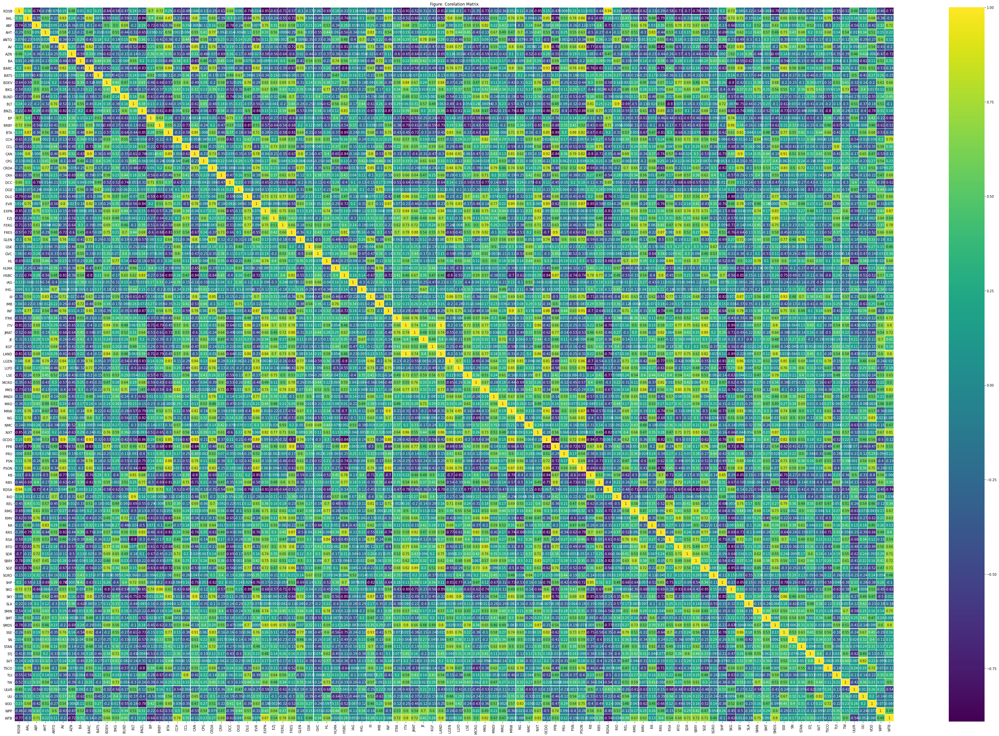

In [ ]:
import seaborn as sns
cor1=dataset_CA.corr(method='pearson')
plt.figure(figsize=(60, 40))
plt.title("Figure: Corelation Matrix")
cm=plt.cm.viridis
corr = sns.heatmap(cor1,cmap=cm,linewidths=0.1,linecolor='white',annot=True)
plt.show()

In [ ]:
cor_target_RDSB = abs(cor1["RDSB"])
cor_target_ULVR = abs(cor1["ULVR"])
cor_target_HSBC = abs(cor1["HSBC"])
cor_target_BP = abs(cor1["BP"])
cor_target_GSK = abs(cor1["GSK"])
cor_target_LLOY = abs(cor1["LLYO"])
cor_target_AZN = abs(cor1["AZN"])
cor_target_TSCO = abs(cor1["TSCO"])
cor_target_AAL = abs(cor1["AAL"])
cor_target_DGE = abs(cor1["DGE"])

relevant_features_RDSB = cor_target_RDSB[cor_target_RDSB>0.70]
relevant_features_ULVR = cor_target_ULVR[cor_target_ULVR>0.70]
relevant_features_HSBC = cor_target_HSBC[cor_target_HSBC>0.70]
relevant_features_BP = cor_target_BP[cor_target_BP>0.70]
relevant_features_GSK = cor_target_GSK[cor_target_GSK>0.70]
relevant_features_LLOY = cor_target_LLOY[cor_target_LLOY>0.70]
relevant_features_AZN = cor_target_AZN[cor_target_AZN>0.70]
relevant_features_TSCO = cor_target_TSCO[cor_target_TSCO>0.70]
relevant_features_AAL = cor_target_AAL[cor_target_AAL>0.70]
relevant_features_DGE = cor_target_DGE[cor_target_DGE>0.70]

irrelevant_features_RDSB = cor_target_RDSB[cor_target_RDSB<0.70]
irrelevant_features_ULVR = cor_target_ULVR[cor_target_ULVR<0.70]
irrelevant_features_HSBC = cor_target_HSBC[cor_target_HSBC<0.70]
irrelevant_features_BP = cor_target_BP[cor_target_BP<0.70]
irrelevant_features_GSK = cor_target_GSK[cor_target_GSK<0.70]
irrelevant_features_LLOY = cor_target_LLOY[cor_target_LLOY<0.70]
irrelevant_features_AZN = cor_target_AZN[cor_target_AZN<0.70]
irrelevant_features_TSCO = cor_target_TSCO[cor_target_TSCO<0.70]
irrelevant_features_AAL = cor_target_AAL[cor_target_AAL<0.70]
irrelevant_features_DGE = cor_target_DGE[cor_target_DGE<0.70]

print("Relevant Features_RDSB:\n")
print(relevant_features_RDSB.head(5))
print("Relevant Features_ULVR:\n")
print(relevant_features_ULVR.head(5))
print("Relevant Features_HSBC:\n")
print(relevant_features_HSBC.head(5))
print("Relevant Features_BP:\n")
print(relevant_features_BP.head(5))
print("Relevant Features_GSK:\n")
print(relevant_features_GSK.head(5))
print("Relevant Features_LLOY:\n")
print(relevant_features_LLOY.head(5))
print("Relevant Features_AZN:\n")
print(relevant_features_AZN.head(5))
print("Relevant Features_TSCO:\n")
print(relevant_features_TSCO.head(5))
print("Relevant Features_AAL:\n")
print(relevant_features_AAL.head(5))
print("Relevant Features_DGE:\n")
print(relevant_features_DGE.head(5))

print("Irrelevant Features_RDSB:\n")
print(irrelevant_features_RDSB.head(5))
print("Irrelevant Features_ULVR:\n")
print(irrelevant_features_ULVR.head(5))
print("Irrelevant Features_HSBC:\n")
print(irrelevant_features_HSBC.head(5))
print("Irrelevant Features_BP:\n")
print(irrelevant_features_BP.head(5))
print("Irrelevant Features_GSK:\n")
print(irrelevant_features_GSK.head(5))
print("Irrelevant Features_LLOY:\n")
print(irrelevant_features_LLOY.head(5))
print("Irrelevant Features_AZN:\n")
print(irrelevant_features_AZN.head(5))
print("Irrelevant Features_TSCO:\n")
print(irrelevant_features_TSCO.head(5))
print("Irrelevant Features_AAL:\n")
print(irrelevant_features_AAL.head(5))
print("Irrelevant Features_DGE:\n")
print(irrelevant_features_DGE.head(5))

Relevant Features_RDSB:

RDSB    1.000000
ABF     0.743872
BRBY    0.716512
DLG     0.794769
EXPN    0.851499
Name: RDSB, dtype: float64
Relevant Features_ULVR:

ULVR    1.0
Name: ULVR, dtype: float64
Relevant Features_HSBC:

AAL     0.736523
AV      0.807160
BARC    0.802807
BNZL    0.825045
BTA     0.888413
Name: HSBC, dtype: float64
Relevant Features_BP:

ABF     0.717536
BP      1.000000
DCC     0.711338
ITV     0.706846
LAND    0.706846
Name: BP, dtype: float64
Relevant Features_GSK:

GSK    1.0
Name: GSK, dtype: float64
Relevant Features_LLOY:

AV      0.774856
BARC    0.769522
CAN     0.806105
CRDA    0.756298
EVR     0.827903
Name: LLYO, dtype: float64
Relevant Features_AZN:

AZN    1.000000
WTB    0.718521
Name: AZN, dtype: float64
Relevant Features_TSCO:

AAL     0.751975
BNZL    0.796512
LGEN    0.780918
NG      0.782211
PSON    0.758185
Name: TSCO, dtype: float64
Relevant Features_AAL:

AAL     1.000000
AV      0.828299
BARC    0.824882
BNZL    0.842171
BTA     0.872491
Nam

In [ ]:
print(relevant_features_RDSB.index.to_list())
print(relevant_features_ULVR.index.to_list())
print(relevant_features_HSBC.index.to_list())
print(relevant_features_BP.index.to_list())
print(relevant_features_GSK.index.to_list())
print(relevant_features_LLOY.index.to_list())
print(relevant_features_AZN.index.to_list())
print(relevant_features_TSCO.index.to_list())
print(relevant_features_AAL.index.to_list())
print(relevant_features_DGE.index.to_list())

['RDSB', 'ABF', 'BRBY', 'DLG', 'EXPN', 'FERG', 'ITV', 'LAND', 'LSE', 'MKS', 'NXT', 'RDSA', 'RTO', 'SBRY', 'SKG', 'SMDS', 'WTB']
['ULVR']
['AAL', 'AV', 'BARC', 'BNZL', 'BTA', 'CAN', 'EVR', 'FRES', 'HSBC', 'INF', 'LGEN', 'MRW', 'OCDO', 'PPB', 'PSN', 'PSON', 'RB', 'RBS', 'RRS', 'SKY', 'SSE']
['ABF', 'BP', 'DCC', 'ITV', 'LAND', 'SKG']
['GSK']
['AV', 'BARC', 'CAN', 'CRDA', 'EVR', 'GLEN', 'III', 'INF', 'LGEN', 'LLYO', 'MRW', 'OCDO', 'PSON', 'RB', 'SHP', 'SKY', 'SSE']
['AZN', 'WTB']
['AAL', 'BNZL', 'LGEN', 'NG', 'PSON', 'RRS', 'TSCO', 'VOD']
['AAL', 'AV', 'BARC', 'BNZL', 'BTA', 'CAN', 'EVR', 'FRES', 'GLEN', 'HSBC', 'INF', 'LGEN', 'MRW', 'NG', 'OCDO', 'PPB', 'PSN', 'PSON', 'RRS', 'SGE', 'SKG', 'SKY', 'TSCO']
['DGE', 'IMB']


In [ ]:
print(irrelevant_features_RDSB.index.to_list())
print(irrelevant_features_ULVR.index.to_list())
print(irrelevant_features_HSBC.index.to_list())
print(irrelevant_features_BP.index.to_list())
print(irrelevant_features_GSK.index.to_list())
print(irrelevant_features_LLOY.index.to_list())
print(irrelevant_features_AZN.index.to_list())
print(irrelevant_features_TSCO.index.to_list())
print(irrelevant_features_AAL.index.to_list())
print(irrelevant_features_DGE.index.to_list())

['AAL', 'AHT', 'ANTO', 'AV', 'AZN', 'BA', 'BARC', 'BATS', 'BDEV', 'BKG', 'BLND', 'BLT', 'BNZL', 'BP', 'BTA', 'CCH', 'CCL', 'CAN', 'CPG', 'CRDA', 'CRH', 'DCC', 'DGE', 'EVR', 'EZJ', 'FRES', 'GLEN', 'GSK', 'GVC', 'HL', 'HLMA', 'HSBC', 'IAG', 'IHG-', 'III', 'IMB', 'INF', 'ITRK', 'JMAT', 'JE', 'KGF', 'LGEN', 'LLYO', 'MCRO', 'MNDI', 'MRO', 'MRW', 'NG', 'NMC', 'OCDO', 'PPB', 'PRU', 'PSN', 'PSON', 'RB', 'RBS', 'RIO', 'REL', 'RMG', 'RMV', 'RR', 'RRS', 'RSA', 'SDR', 'SGE', 'SGRO', 'SHP', 'SKY', 'SLA', 'SMIN', 'SMT', 'SSE', 'SN', 'STAN', 'STJ', 'SVT', 'TSCO', 'TUI', 'TW', 'ULVR', 'UU', 'VOD', 'WPP']
['RDSB', 'AAL', 'ABF', 'AHT', 'ANTO', 'AV', 'AZN', 'BA', 'BARC', 'BATS', 'BDEV', 'BKG', 'BLND', 'BLT', 'BNZL', 'BP', 'BRBY', 'BTA', 'CCH', 'CCL', 'CAN', 'CPG', 'CRDA', 'CRH', 'DCC', 'DGE', 'DLG', 'EVR', 'EXPN', 'EZJ', 'FERG', 'FRES', 'GLEN', 'GSK', 'GVC', 'HL', 'HLMA', 'HSBC', 'IAG', 'IHG-', 'III', 'IMB', 'INF', 'ITRK', 'ITV', 'JMAT', 'JE', 'KGF', 'LAND', 'LGEN', 'LLYO', 'LSE', 'MCRO', 'MKS', 'MNDI', 

In [ ]:
dataset_ex_df_RDSB['ABF'] = dataset_CA['ABF']
dataset_ex_df_RDSB['BRBY'] = dataset_CA['BRBY']
dataset_ex_df_RDSB['DLG'] = dataset_CA['DLG']
dataset_ex_df_RDSB['EXPN'] = dataset_CA['EXPN']
dataset_ex_df_RDSB['FERG'] = dataset_CA['FERG']
dataset_ex_df_RDSB['ITV'] = dataset_CA['ITV']
dataset_ex_df_RDSB['LAND'] = dataset_CA['LAND']
dataset_ex_df_RDSB['LSE'] = dataset_CA['LSE']
dataset_ex_df_RDSB['MKS'] = dataset_CA['MKS']
dataset_ex_df_RDSB['NXT'] = dataset_CA['NXT']
dataset_ex_df_RDSB['RDSA'] = dataset_CA['RDSA']
dataset_ex_df_RDSB['RTO'] = dataset_CA['RTO']
dataset_ex_df_RDSB['SBRY'] = dataset_CA['SBRY']
dataset_ex_df_RDSB['SKG'] = dataset_CA['SKG']
dataset_ex_df_RDSB['SMDS'] = dataset_CA['SMDS']
dataset_ex_df_RDSB['WTB'] = dataset_CA['WTB']
print(dataset_ex_df_RDSB.head(2))
print('Shape of datset after adding all features')
print(dataset_ex_df_RDSB.shape)

                Dates    Open   Close    High  ...   SBRY   SKG   SMDS   WTB
0 2018-02-14 08:00:00  2319.0  2315.5  2319.0  ...  248.2  2486  473.6  3815
1 2018-02-14 08:01:00  2316.5  2314.0  2316.5  ...  247.6  2482  473.3  3818

[2 rows x 35 columns]
Shape of datset after adding all features
(5382, 35)


In [ ]:
print(dataset_ex_df_ULVR.head(2))
print('Shape of datset after adding all features')
print(dataset_ex_df_ULVR.shape)

                Dates    Open   Close  ...  momentum  Fourier        ARIMA
0 2018-02-14 08:00:00  3805.0  3797.5  ...    36.975   3797.5  3721.546548
1 2018-02-14 08:01:00  3801.0  3800.0  ...    37.000   3800.0  3718.949469

[2 rows x 19 columns]
Shape of datset after adding all features
(5534, 19)


In [ ]:
dataset_ex_df_HSBC['AAL'] = dataset_CA['AAL']
dataset_ex_df_HSBC['AV'] = dataset_CA['AV']
dataset_ex_df_HSBC['BARC'] = dataset_CA['BARC']
dataset_ex_df_HSBC['BNZL'] = dataset_CA['BNZL']
dataset_ex_df_HSBC['BTA'] = dataset_CA['BTA']
dataset_ex_df_HSBC['CAN'] = dataset_CA['CAN']
dataset_ex_df_HSBC['EVR'] = dataset_CA['EVR']
dataset_ex_df_HSBC['FRES'] = dataset_CA['FRES']
dataset_ex_df_HSBC['INF'] = dataset_CA['INF']
dataset_ex_df_HSBC['LGEN'] = dataset_CA['LGEN']
dataset_ex_df_HSBC['MRW'] = dataset_CA['MRW']
dataset_ex_df_HSBC['OCDO'] = dataset_CA['OCDO']
dataset_ex_df_HSBC['PPB'] = dataset_CA['PPB']
dataset_ex_df_HSBC['PSN'] = dataset_CA['PSN']
dataset_ex_df_HSBC['PSON'] = dataset_CA['PSON']
dataset_ex_df_HSBC['RB'] = dataset_CA['RB']
dataset_ex_df_HSBC['RBS'] = dataset_CA['RBS']
dataset_ex_df_HSBC['RRS'] = dataset_CA['RRS']
dataset_ex_df_HSBC['SSE'] = dataset_CA['SKY']
print(dataset_ex_df_HSBC.head(2))
print('Shape of datset after adding all features')
print(dataset_ex_df_HSBC.shape)

                Dates   Open  Close   High  ...      RB    RBS     RRS     SSE
0 2018-02-14 08:00:00  751.0  749.2  751.0  ...  6417.0  276.8  6130.0  1096.5
1 2018-02-14 08:01:00  749.2  749.9  750.4  ...  6423.0  277.2  6128.0  1095.5

[2 rows x 38 columns]
Shape of datset after adding all features
(5557, 38)


In [ ]:
dataset_ex_df_BP['ABF'] = dataset_CA['ABF']
dataset_ex_df_BP['DCC'] = dataset_CA['DCC']
dataset_ex_df_BP['ITV'] = dataset_CA['ITV']
dataset_ex_df_BP['LAND'] = dataset_CA['LAND']
dataset_ex_df_BP['SKG'] = dataset_CA['SKG']
print(dataset_ex_df_BP.head(2))
print('Shape of datset after adding all features')
print(dataset_ex_df_BP.shape)

                Dates    Open   Close    High  ...     DCC     ITV    LAND     SKG
0 2018-02-14 08:00:00  477.00  476.70  478.00  ...  6860.0  162.10  162.10  2486.0
1 2018-02-14 08:01:00  477.05  476.25  477.05  ...  6850.0  162.15  162.15  2482.0

[2 rows x 24 columns]
Shape of datset after adding all features
(5575, 24)


In [ ]:
print(dataset_ex_df_GSK.head(2))
print('Shape of datset after adding all features')
print(dataset_ex_df_GSK.shape)

                Dates    Open   Close  ...  momentum  Fourier        ARIMA
0 2018-02-14 08:01:00  1293.4  1292.8  ...    11.928   1292.8  1299.319966
1 2018-02-14 08:00:00  1292.8  1288.8  ...    11.888   1288.8  1298.790351

[2 rows x 19 columns]
Shape of datset after adding all features
(5432, 19)


In [ ]:
dataset_ex_df_LLOY['AV'] = dataset_CA['AV']
dataset_ex_df_LLOY['BARC'] = dataset_CA['BARC']
dataset_ex_df_LLOY['CAN'] = dataset_CA['CAN']
dataset_ex_df_LLOY['CRDA'] = dataset_CA['CRDA']
dataset_ex_df_LLOY['EVR'] = dataset_CA['EVR']
dataset_ex_df_LLOY['GLEN'] = dataset_CA['GLEN']
dataset_ex_df_LLOY['III'] = dataset_CA['III']
dataset_ex_df_LLOY['INF'] = dataset_CA['INF']
dataset_ex_df_LLOY['LGEN'] = dataset_CA['LGEN']
dataset_ex_df_LLOY['MRW'] = dataset_CA['MRW']
dataset_ex_df_LLOY['OCDO'] = dataset_CA['OCDO']
dataset_ex_df_LLOY['PSON'] = dataset_CA['PSON']
dataset_ex_df_LLOY['RB'] = dataset_CA['RB']
dataset_ex_df_LLOY['SHP'] = dataset_CA['SHP']
dataset_ex_df_LLOY['SKY'] = dataset_CA['SKY']
dataset_ex_df_LLOY['SSE'] = dataset_CA['SSE']
print(dataset_ex_df_LLOY.head(2))
print('Shape of datset after adding all features')
print(dataset_ex_df_LLOY.shape)

                Dates   Open  Close   High  ...      RB     SHP     SKY     SSE
0 2018-02-14 08:00:00  67.00  67.07  67.07  ...  6417.0  3182.5  1096.5  1189.0
1 2018-02-14 08:01:00  67.17  67.16  67.18  ...  6423.0  3185.5  1095.5  1190.5

[2 rows x 35 columns]
Shape of datset after adding all features
(5495, 35)


In [ ]:
dataset_ex_df_AZN['WTB'] = dataset_CA['WTB']
print(dataset_ex_df_AZN.head(2))
print('Shape of datset after adding all features')
print(dataset_ex_df_AZN.shape)

                Dates    Open   Close  ...  Fourier        ARIMA   WTB
0 2018-02-14 08:00:00  4835.5  4832.5  ...   4832.5  4802.847700  3815
1 2018-02-14 08:01:00  4832.5  4832.5  ...   4832.5  4803.057467  3818

[2 rows x 20 columns]
Shape of datset after adding all features
(4796, 20)


In [ ]:
dataset_ex_df_TSCO['AAL'] = dataset_CA['AAL']
dataset_ex_df_TSCO['BNZL'] = dataset_CA['BNZL']
dataset_ex_df_TSCO['LGEN'] = dataset_CA['NG']
dataset_ex_df_TSCO['PSON'] = dataset_CA['RRS']
dataset_ex_df_TSCO['VOD'] = dataset_CA['VOD']
print(dataset_ex_df_TSCO.head(2))
print('Shape of datset after adding all features')
print(dataset_ex_df_TSCO.shape)

                Dates   Open  Close   High  ...    BNZL   LGEN  PSON     VOD
0 2018-02-14 08:00:00  204.0  204.0  204.0  ...  2016.0  738.5  6130  201.45
1 2018-02-14 08:01:00  204.1  204.1  204.1  ...  2021.0  737.5  6128  201.55

[2 rows x 24 columns]
Shape of datset after adding all features
(4478, 24)


In [ ]:
dataset_ex_df_AAL['AV'] = dataset_CA['AV']
dataset_ex_df_AAL['BARC'] = dataset_CA['BARC']
dataset_ex_df_AAL['BNZL'] = dataset_CA['BNZL']
dataset_ex_df_AAL['BTA'] = dataset_CA['BTA']
dataset_ex_df_AAL['CAN'] = dataset_CA['CAN']
dataset_ex_df_AAL['EVR'] = dataset_CA['EVR']
dataset_ex_df_AAL['FRES'] = dataset_CA['FRES']
dataset_ex_df_AAL['GLEN'] = dataset_CA['GLEN']
dataset_ex_df_AAL['HSBC'] = dataset_CA['HSBC']
dataset_ex_df_AAL['INF'] = dataset_CA['INF']
dataset_ex_df_AAL['LGEN'] = dataset_CA['LGEN']
dataset_ex_df_AAL['MRW'] = dataset_CA['MRW']
dataset_ex_df_AAL['NG'] = dataset_CA['NG']
dataset_ex_df_AAL['OCDO'] = dataset_CA['OCDO']
dataset_ex_df_AAL['PPB'] = dataset_CA['PPB']
dataset_ex_df_AAL['PSN'] = dataset_CA['PSN']
dataset_ex_df_AAL['PSON'] = dataset_CA['PSON']
dataset_ex_df_AAL['RRS'] = dataset_CA['RRS']
dataset_ex_df_AAL['SGE'] = dataset_CA['SGE']
dataset_ex_df_AAL['SKG'] = dataset_CA['SKG']
dataset_ex_df_AAL['SKY'] = dataset_CA['SKY']
dataset_ex_df_AAL['TSCO'] = dataset_CA['TSCO']
print(dataset_ex_df_AAL.head(2))
print('Shape of datset after adding all features')
print(dataset_ex_df_AAL.shape)

                Dates    Open   Close    High  ...    SGE     SKG     SKY   TSCO
0 2018-02-14 08:00:00  1682.0  1679.8  1682.0  ...  686.8  2486.0  1096.5  204.0
1 2018-02-14 08:01:00  1679.8  1680.8  1681.6  ...  684.8  2482.0  1095.5  204.1

[2 rows x 41 columns]
Shape of datset after adding all features
(5574, 41)


In [ ]:
dataset_ex_df_DGE['IMB'] = dataset_CA['IMB']
print(dataset_ex_df_DGE.head(2))
print('Shape of datset after adding all features')
print(dataset_ex_df_DGE.shape)

                Dates    Open   Close  ...  Fourier        ARIMA     IMB
0 2018-02-14 08:00:00  2473.0  2473.0  ...   2473.0  2460.993090  2615.0
1 2018-02-14 08:01:00  2474.0  2474.5  ...   2474.5  2460.495066  2612.0

[2 rows x 20 columns]
Shape of datset after adding all features
(5370, 20)


#Feature Selection

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:19]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

*Importance of Technical Indicators*

In [ ]:
# Get training and test data
(X_train_TI, y_train_TI), (X_test_TI, y_test_TI) = get_feature_importance_data(dataset_TI_df_RDSB)

In [ ]:
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)

In [ ]:
xgbModel = regressor.fit(X_train_TI,y_train_TI, \
                         eval_set = [(X_train_TI, y_train_TI), (X_test_TI, y_test_TI)], \
                         verbose=False)

In [ ]:
eval_result = regressor.evals_result()

In [ ]:
training_rounds = range(len(eval_result['validation_0']['rmse']))

In [ ]:
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('RDSB Training Vs Validation Error')
plt.legend()
plt.show()

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_TI.columns)
plt.title('Figure 6: Feature importance of the Technical Indicators.')
plt.show()

*Importance of all features*

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:35]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_RDSB)

In [ ]:
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)

In [ ]:
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)

[12:51:00] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [ ]:
eval_result = regressor.evals_result()

In [ ]:
training_rounds = range(len(eval_result['validation_0']['rmse']))

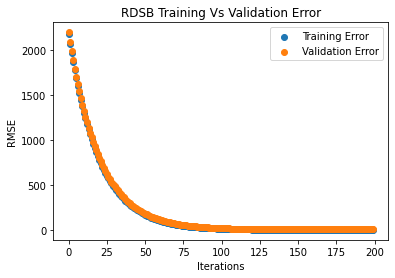

In [ ]:
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('RDSB Training Vs Validation Error')
plt.legend()
plt.show()

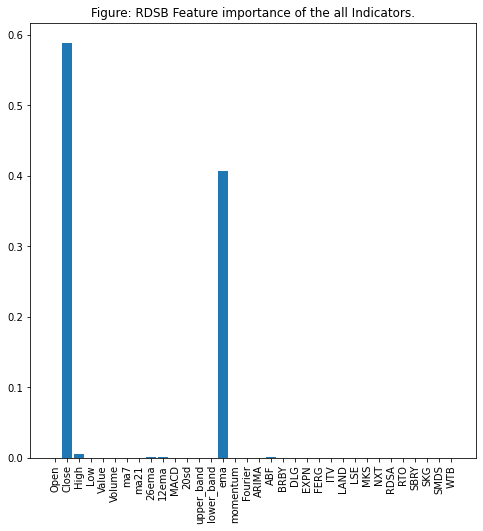

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: RDSB Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:19]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[12:51:33] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


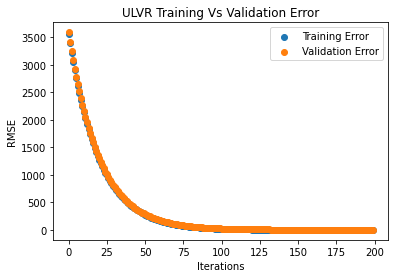

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_ULVR)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('ULVR Training Vs Validation Error')
plt.legend()
plt.show()

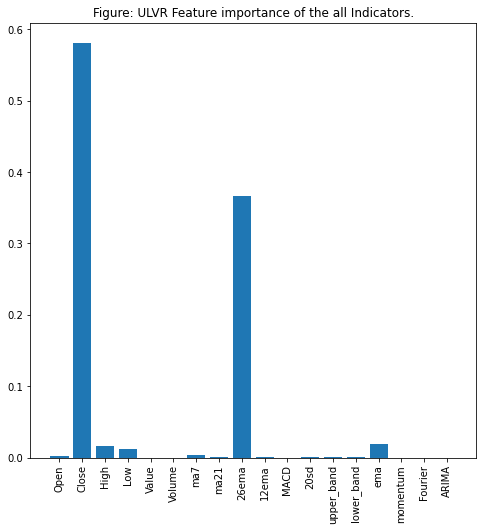

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: ULVR Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:38]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[12:52:03] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


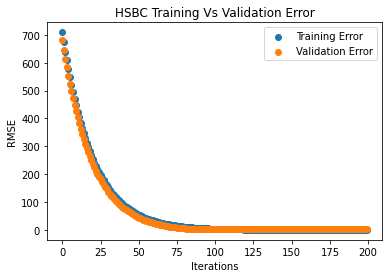

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_HSBC)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('HSBC Training Vs Validation Error')
plt.legend()
plt.show()

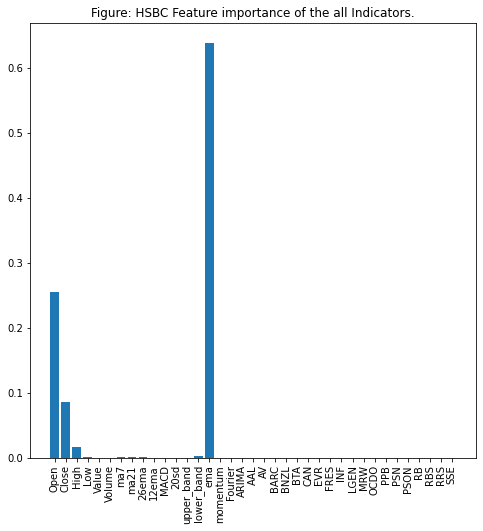

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: HSBC Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:24]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[12:52:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


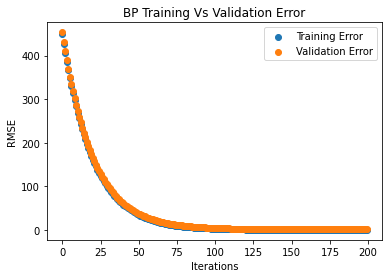

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_BP)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('BP Training Vs Validation Error')
plt.legend()
plt.show()

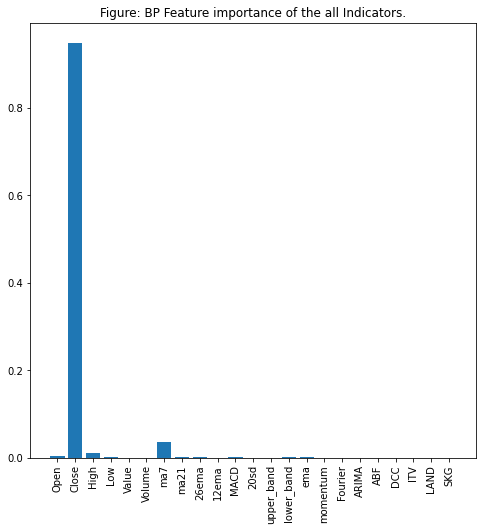

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: BP Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:19]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[12:53:06] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


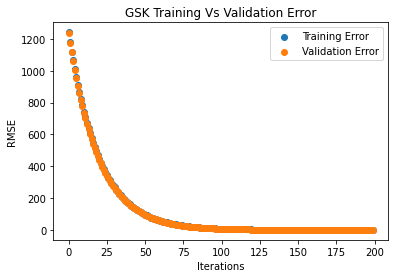

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_GSK)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('GSK Training Vs Validation Error')
plt.legend()
plt.show()

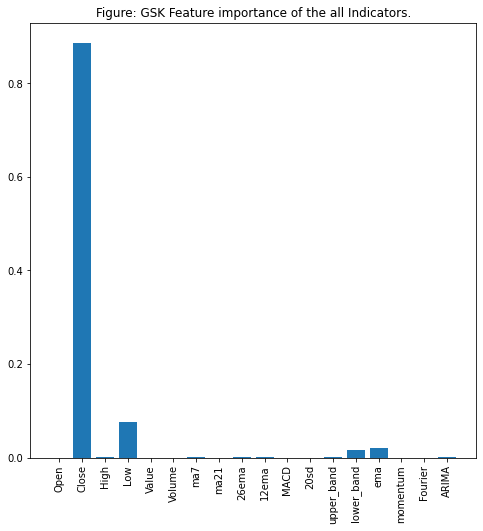

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: GSK Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:35]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[12:53:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


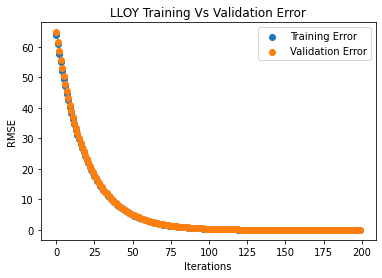

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_LLOY)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('LLOY Training Vs Validation Error')
plt.legend()
plt.show()

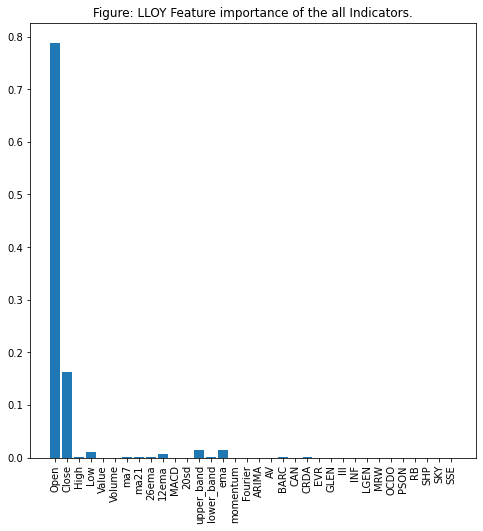

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: LLOY Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:20]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[12:55:07] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


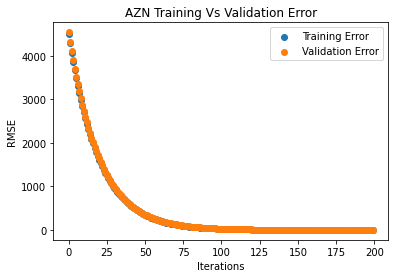

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_AZN)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('AZN Training Vs Validation Error')
plt.legend()
plt.show()

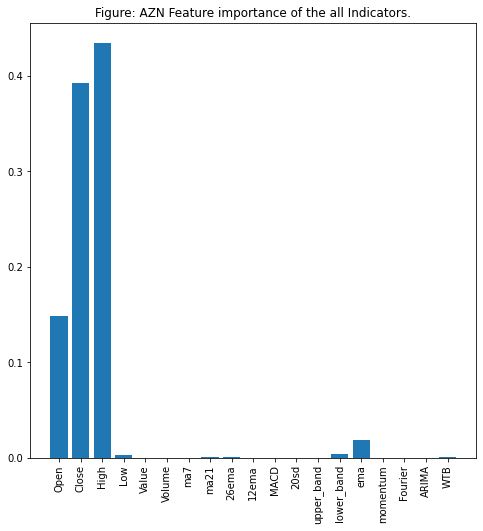

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: AZN Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:24]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[12:55:40] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


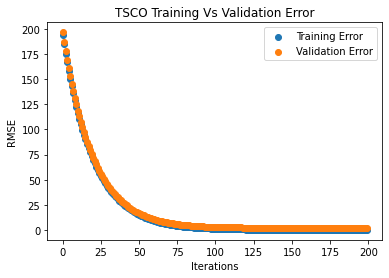

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_TSCO)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('TSCO Training Vs Validation Error')
plt.legend()
plt.show()

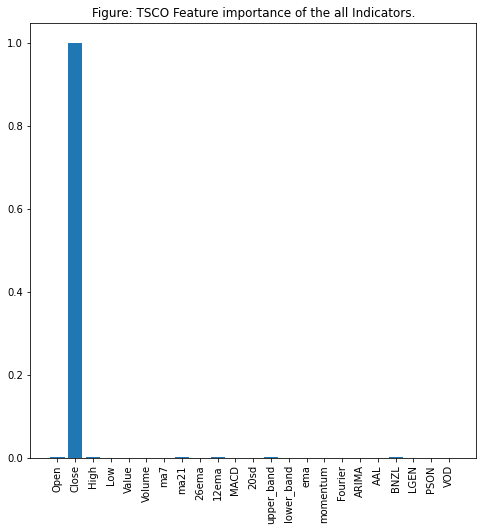

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: TSCO Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:41]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[12:56:23] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


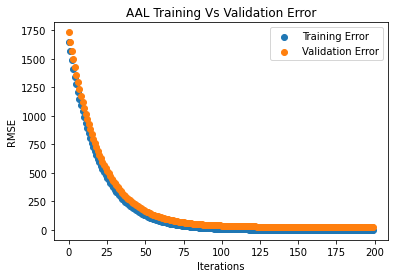

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_AAL)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('AAL Training Vs Validation Error')
plt.legend()
plt.show()

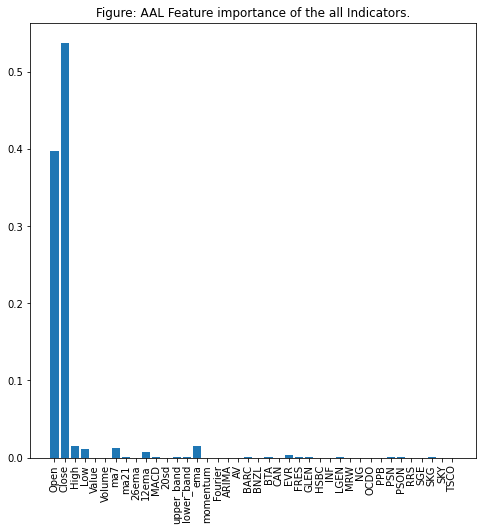

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: AAL Feature importance of the all Indicators.')
plt.show()

In [ ]:
def get_feature_importance_data(data_income):
    data = data_income.copy()
    y = data['Close']
    X = data.iloc[:,1:20]
    
    train_samples = int(X.shape[0] * 0.65)
 
    X_train = X.iloc[:train_samples]
    X_test = X.iloc[train_samples:]

    y_train = y.iloc[:train_samples]
    y_test = y.iloc[train_samples:]
    
    return (X_train, y_train), (X_test, y_test)

[12:56:58] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


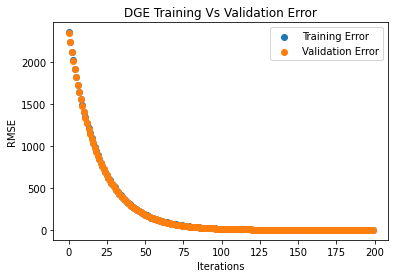

In [ ]:
# Get training and test data
(X_train_FI, y_train_FI), (X_test_FI, y_test_FI) = get_feature_importance_data(dataset_ex_df_DGE)
regressor = xgb.XGBRegressor(gamma=0.0,n_estimators=200,base_score=0.7,colsample_bytree=1,learning_rate=0.05)
xgbModel = regressor.fit(X_train_FI,y_train_FI, \
                         eval_set = [(X_train_FI, y_train_FI), (X_test_FI, y_test_FI)], \
                         verbose=False)
eval_result = regressor.evals_result()


training_rounds = range(len(eval_result['validation_0']['rmse']))
plt.scatter(x=training_rounds,y=eval_result['validation_0']['rmse'],label='Training Error')
plt.scatter(x=training_rounds,y=eval_result['validation_1']['rmse'],label='Validation Error')
plt.xlabel('Iterations')
plt.ylabel('RMSE')
plt.title('DGE Training Vs Validation Error')
plt.legend()
plt.show()

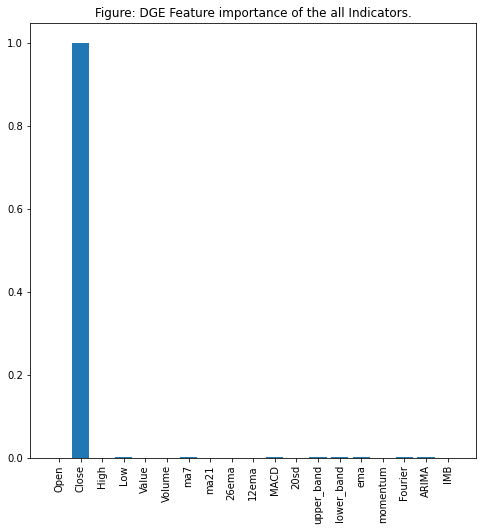

In [ ]:
fig = plt.figure(figsize=(8,8))
plt.xticks(rotation='vertical')
plt.bar([i for i in range(len(xgbModel.feature_importances_))], xgbModel.feature_importances_.tolist(), tick_label=X_test_FI.columns)
plt.title('Figure: DGE Feature importance of the all Indicators.')
plt.show()

#Pre-Processing

**Scenario 1 - Most significant features for Top 10 FTSEUK**

In [ ]:
dataset_S1_RDSB = dataset_ex_df_RDSB[['Dates','Close','High','26ema','12ema','ema','ABF']]
print(dataset_S1_RDSB.fillna(0, inplace=True))
print(dataset_S1_RDSB.head(2))                              

None
                Dates   Close    High        26ema      12ema       ema     ABF
0 2018-02-14 08:00:00  2315.5  2319.0  2315.500000  2315.5000  2315.500  2611.0
1 2018-02-14 08:01:00  2314.0  2316.5  2314.721154  2314.6875  2314.375  2612.0


In [ ]:
dataset_S1_ULVR = dataset_ex_df_ULVR[['Dates','Open','Close','High','Low','ma7','ma21','26ema','12ema', '20sd','upper_band','ema']]
print(dataset_S1_ULVR.fillna(0, inplace=True))
print(dataset_S1_ULVR.head(2))


None
                Dates    Open   Close  ...  20sd  upper_band       ema
0 2018-02-14 08:00:00  3805.0  3797.5  ...   0.0         0.0  3797.500
1 2018-02-14 08:01:00  3801.0  3800.0  ...   0.0         0.0  3799.375

[2 rows x 12 columns]


In [ ]:
dataset_S1_HSBC = dataset_ex_df_HSBC[['Dates','Open','Close','High','Low','ma7','ma21','26ema','lower_band','ema']]
print(dataset_S1_HSBC.fillna(0, inplace=True))
print(dataset_S1_HSBC.head(2))

None
                Dates   Open  Close  ...       26ema  lower_band      ema
0 2018-02-14 08:00:00  751.0  749.2  ...  749.200000         0.0  749.200
1 2018-02-14 08:01:00  749.2  749.9  ...  749.563462         0.0  749.725

[2 rows x 10 columns]


In [ ]:
dataset_S1_BP = dataset_ex_df_BP[['Dates','Open','Close','High','Low','ma7','ma21','26ema','MACD','lower_band','ema']]
print(dataset_S1_BP.fillna(0, inplace=True))
print(dataset_S1_BP.head(2))

None
                Dates    Open   Close  ...      MACD  lower_band       ema
0 2018-02-14 08:00:00  477.00  476.70  ...  0.000000         0.0  476.7000
1 2018-02-14 08:01:00  477.05  476.25  ... -0.010096         0.0  476.3625

[2 rows x 11 columns]


In [ ]:
dataset_S1_GSK = dataset_ex_df_GSK[['Dates','Close','High','Low','ma7','26ema','12ema', 'upper_band','lower_band','ema','ARIMA']]
print(dataset_S1_GSK.fillna(0, inplace=True))
print(dataset_S1_GSK.head(2))

None
                Dates   Close    High  ...  lower_band     ema        ARIMA
0 2018-02-14 08:01:00  1292.8  1294.0  ...         0.0  1292.8  1299.319966
1 2018-02-14 08:00:00  1288.8  1293.0  ...         0.0  1289.8  1298.790351

[2 rows x 11 columns]


In [ ]:
dataset_S1_LLOY = dataset_ex_df_LLOY[['Dates','Open','Close','High','Low','ma7','ma21','26ema','12ema', 'upper_band','lower_band','ema','BARC','CRDA']]
print(dataset_S1_LLOY.fillna(0, inplace=True))
print(dataset_S1_LLOY.head(2))

None
                Dates   Open  Close   High  ...  lower_band      ema    BARC    CRDA
0 2018-02-14 08:00:00  67.00  67.07  67.07  ...         0.0  67.0700  194.86  4353.0
1 2018-02-14 08:01:00  67.17  67.16  67.18  ...         0.0  67.1375  195.14  4351.0

[2 rows x 14 columns]


In [ ]:
dataset_S1_AZN = dataset_ex_df_AZN[['Dates','Open','Close','High','Low','26ema','lower_band','ema','WTB']]
print(dataset_S1_AZN.fillna(0, inplace=True))
print(dataset_S1_AZN.head(2))

None
                Dates    Open   Close    High  ...   26ema  lower_band     ema   WTB
0 2018-02-14 08:00:00  4835.5  4832.5  4838.0  ...  4832.5         0.0  4832.5  3815
1 2018-02-14 08:01:00  4832.5  4832.5  4832.5  ...  4832.5         0.0  4832.5  3818

[2 rows x 9 columns]


In [ ]:
dataset_S1_TSCO = dataset_ex_df_TSCO[['Dates','Open','Close','High','ma21','12ema', 'upper_band','BNZL']]
print(dataset_S1_TSCO.fillna(0, inplace=True))
print(dataset_S1_TSCO.head(2))

None
                Dates   Open  Close  ...       12ema  upper_band    BNZL
0 2018-02-14 08:00:00  204.0  204.0  ...  204.000000         0.0  2016.0
1 2018-02-14 08:01:00  204.1  204.1  ...  204.054167         0.0  2021.0

[2 rows x 8 columns]


In [ ]:
dataset_S1_AAL = dataset_ex_df_AAL[['Dates','Open','Close','High','Low','ma7','ma21','26ema','12ema', '20sd','upper_band','lower_band','ema','BARC','BTA','EVR','FRES','GLEN','PSN','PSON','SKG']]
print(dataset_S1_AAL.fillna(0, inplace=True))
print(dataset_S1_AAL.head(2))

None
                Dates    Open   Close    High  ...   GLEN     PSN   PSON     SKG
0 2018-02-14 08:00:00  1682.0  1679.8  1682.0  ...  378.3  2442.0  659.6  2486.0
1 2018-02-14 08:01:00  1679.8  1680.8  1681.6  ...  378.3  2450.0  659.6  2482.0

[2 rows x 21 columns]


In [ ]:
dataset_S1_DGE = dataset_ex_df_DGE[['Dates','Close','Low','ma7','MACD','upper_band','lower_band','ema','Fourier','ARIMA']]
print(dataset_S1_DGE.fillna(0, inplace=True))
print(dataset_S1_DGE.head(2))

None
                Dates   Close     Low  ...       ema  Fourier        ARIMA
0 2018-02-14 08:00:00  2473.0  2472.0  ...  2473.000   2473.0  2460.993090
1 2018-02-14 08:01:00  2474.5  2474.0  ...  2474.125   2474.5  2460.495066

[2 rows x 10 columns]


**Scenario 2- All features**

In [ ]:
dataset_S2_RDSB = dataset_ex_df_RDSB
dataset_S2_RDSB.fillna(0, inplace=True)
dataset_S2_RDSB.head(2)

,Dates,Open,Close,High,Low,Value,Volume,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,Fourier,ARIMA,ABF,BRBY,DLG,EXPN,FERG,ITV,LAND,LSE,MKS,NXT,RDSA,RTO,SBRY,SKG,SMDS,WTB
0,2018-02-14 08:00:00,2319.0,2315.5,2319.0,2315.5,64152800.0,27677,0.0,0.0,2315.500000,2315.5000,0.000000,0.0,0.0,0.0,2315.500,22.155,2315.5,2280.999660,2611.0,1520.5,387.9,1521.0,5170,162.10,162.10,3959.0,289.5,4810,2295.5,283.5,248.2,2486,473.6,3815
1,2018-02-14 08:01:00,2316.5,2314.0,2316.5,2312.5,39831632.0,17206,0.0,0.0,2314.721154,2314.6875,-0.033654,0.0,0.0,0.0,2314.375,22.140,2314.0,2280.965854,2612.0,1522.5,388.3,1523.0,5176,162.15,162.15,3959.0,289.6,4804,2293.5,283.3,247.6,2482,473.3,3818


#Optimal-Modeling Filter

**2. Optimal ML model for market marking - buy/sell/no action using DRL**

1.   Trigger2 -> TA2-> Request2 -> Layer2 -> Train PG, Q, DDQN
2.   Select ML model with optimal performance metrics for lowest execution time
3.   Test optimal ML model 


https://github.com/edwardhdlu/q-trader

In [ ]:
df1_RDSB.head(3)

,Dates,Close,ema,ema_mean
0,2018-02-14 08:00:00,2315.5,2315.500000,2316.200000
1,2018-02-14 08:01:00,2314.0,2314.375000,2314.856731
2,2018-02-14 08:02:00,2306.0,2308.576923,2309.892284


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [ ]:
DDQ_RDSB = df1_RDSB[:-1346]
DDQ_RDSB.head(3)

,Dates,Close,ema,ema_mean
0,2018-02-14 08:00:00,2315.5,2315.500000,2316.200000
1,2018-02-14 08:01:00,2314.0,2314.375000,2314.856731
2,2018-02-14 08:02:00,2306.0,2308.576923,2309.892284


In [ ]:
DDQ_RDSB.to_csv('/content/drive/My Drive/Colab Notebooks/DQN/DDQ_RDSB.csv',index=False)

In [ ]:
!python3 "/content/drive/My Drive/Colab Notebooks/DQN/train.py" RDSB.csv 10 100 

2020-08-13 18:43:28.858625: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2020-08-13 18:43:30.524938: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2020-08-13 18:43:30.527864: E tensorflow/stream_executor/cuda/cuda_driver.cc:314] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected
2020-08-13 18:43:30.527903: I tensorflow/stream_executor/cuda/cuda_diagnostics.cc:156] kernel driver does not appear to be running on this host (c0ca251ef0ae): /proc/driver/nvidia/version does not exist
2020-08-13 18:43:30.534110: I tensorflow/core/platform/profile_utils/cpu_utils.cc:104] CPU Frequency: 2300000000 Hz
2020-08-13 18:43:30.534347: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x12c0a00 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
2020-08-13 18:43:30.534383: I tensorflow/com

In [ ]:
DDQ_RDSB_test = df1_RDSB[-1346:]
DDQ_RDSB_test.head(3)

,Dates,Close,ema,ema_mean
4036,2018-02-26 10:13:00,2287.5,2287.666564,2287.775129
4037,2018-02-26 10:14:00,2287.5,2287.555521,2287.736906
4038,2018-02-26 10:15:00,2286.5,2286.851840,2287.136606


In [ ]:
DDQ_RDSB_test.to_csv('/content/drive/My Drive/Colab Notebooks/DQN/DDQ_RDSB_test.csv',index=False)

In [ ]:
!python3 "/content/drive/My Drive/Colab Notebooks/DQN/evaluate.py" DDQ_RDSB_test.csv

2020-08-13 17:33:59.940779: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
Usage: python evaluate.py [stock] [model]


**1.Optimal ML model for Predicting Stock Price Movement Direction**


1.   Trigger1 -> TA1-> Request1 -> Layer1 -> Train XGBoost, LSTM, KNN, SVR, LR
2.   Select ML model with optimal performance metrics for lowest execution time
3.   Test optimal ML model



*Scenario-1*

In [ ]:
df1_RDSB = dataset_S1_RDSB.drop(['Dates'], axis=1)
df1_ULVR = dataset_S1_ULVR.drop(['Dates'], axis=1)
df1_HSBC = dataset_S1_HSBC.drop(['Dates'], axis=1)
df1_BP = dataset_S1_BP.drop(['Dates'], axis=1)
df1_GSK = dataset_S1_GSK.drop(['Dates'], axis=1)
df1_LLOY = dataset_S1_LLOY.drop(['Dates'], axis=1)
df1_AZN = dataset_S1_AZN.drop(['Dates'], axis=1)
df1_TSCO = dataset_S1_TSCO.drop(['Dates'], axis=1)
df1_AAL = dataset_S1_AAL.drop(['Dates'], axis=1)
df1_DGE = dataset_S1_DGE.drop(['Dates'], axis=1)

#LSTM 

**RDSB**

In [ ]:
df1_RDSB = df1_RDSB.drop(['ABF'],axis=1)
df1_RDSB.head(3)

,Close,High,26ema,12ema,ema
0,2315.5,2319.0,2315.500000,2315.500000,2315.500000
1,2314.0,2316.5,2314.721154,2314.687500,2314.375000
2,2306.0,2312.0,2311.587728,2311.296767,2308.576923


In [ ]:
# FUNCTION TO CREATE 1D DATA INTO TIME SERIES DATASET
def new_dataset(dataset, step_size):
	data_X, data_Y = [], []
	for i in range(len(dataset)-step_size-1):
		a = dataset[i:(i+step_size), 0]
		data_X.append(a)
		data_Y.append(dataset[i + step_size, 0])
	return np.array(data_X), np.array(data_Y)

In [ ]:
# FOR REPRODUCIBILITY
np.random.seed(7)

In [ ]:
# IMPORTING DATASET 
df1_RDSB = df1_RDSB.reindex(index = df1_RDSB.index[::-1])
df1_RDSB.head(3)

,Close,High,26ema,12ema,ema
0,2315.5,2319.0,2315.500000,2315.500000,2315.500000
1,2314.0,2316.5,2314.721154,2314.687500,2314.375000
2,2306.0,2312.0,2311.587728,2311.296767,2308.576923


In [ ]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_RDSB) + 1, 1)

In [ ]:
# TAKING DIFFERENT INDICATORS FOR PREDICTION
ORDSB_avg = df1_RDSB.mean(axis = 1)
RDSB_avg = df1_RDSB[['High', 'Close']].mean(axis = 1)
close_val = df1_RDSB[['Close']]

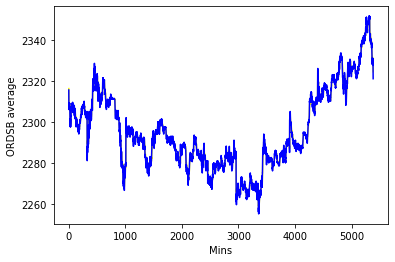

In [ ]:
# PLOTTING All INDICATORS IN PLOT
plt.plot(ORDSB_avg, 'yellow', label = 'ORDSB avg')
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('ORDSB average')
plt.show()

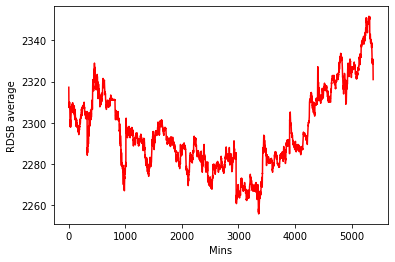

In [ ]:
plt.plot(RDSB_avg, 'red', label = 'RDSB avg')
plt.xlabel('Mins')
plt.ylabel('RDSB average')
plt.show()

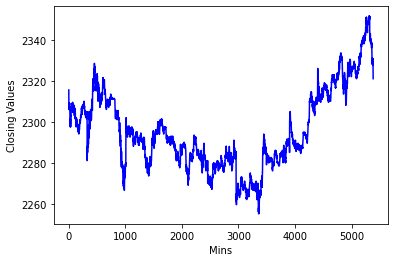

In [ ]:
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('Closing Values')
plt.show()

In [ ]:
# PREPARATION OF TIME SERIES DATASE
ORDSB_avg = np.reshape(ORDSB_avg.values, (len(ORDSB_avg),1)) 
scaler = MinMaxScaler(feature_range=(0, 1))
ORDSB_avg = scaler.fit_transform(ORDSB_avg)

In [ ]:
# TRAIN-TEST SPLIT
train_ORDSB = int(len(ORDSB_avg) * 0.75)
test_ORDSB = len(ORDSB_avg) - train_ORDSB
train_ORDSB, test_ORDSB = ORDSB_avg[0:train_ORDSB,:], ORDSB_avg[train_ORDSB:len(ORDSB_avg),:]

In [ ]:
# TIME-SERIES DATASET (FOR TIME T, VALUES FOR TIME T+1)
trainX, trainY = new_dataset(train_ORDSB, 1)
testX, testY = new_dataset(test_ORDSB, 1)

In [ ]:
# RESHAPING TRAIN AND TEST DATA
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
step_size = 1

In [ ]:
# LSTM MODEL
model = Sequential()
model.add(LSTM(32, input_shape=(1, step_size), return_sequences = True))
model.add(LSTM(16))
model.add(Dense(1))
model.add(Activation('linear'))

In [ ]:
# MODEL COMPILING AND TRAINING
start = time.time()
model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mae']) 
print ('compilation time : ', time.time() - start)
model.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2)

compilation time :  0.01643228530883789
Epoch 1/50
4034/4034 - 7s - loss: 0.0022 - mae: 0.0186
Epoch 2/50
4034/4034 - 7s - loss: 8.2513e-05 - mae: 0.0065
Epoch 3/50
4034/4034 - 7s - loss: 8.5244e-05 - mae: 0.0066
Epoch 4/50
4034/4034 - 7s - loss: 8.5075e-05 - mae: 0.0066
Epoch 5/50
4034/4034 - 7s - loss: 8.1725e-05 - mae: 0.0064
Epoch 6/50
4034/4034 - 7s - loss: 8.2979e-05 - mae: 0.0065
Epoch 7/50
4034/4034 - 7s - loss: 7.9926e-05 - mae: 0.0064
Epoch 8/50
4034/4034 - 7s - loss: 8.1351e-05 - mae: 0.0064
Epoch 9/50
4034/4034 - 7s - loss: 7.9548e-05 - mae: 0.0064
Epoch 10/50
4034/4034 - 7s - loss: 7.8960e-05 - mae: 0.0062
Epoch 11/50
4034/4034 - 7s - loss: 7.7991e-05 - mae: 0.0063
Epoch 12/50
4034/4034 - 7s - loss: 7.7645e-05 - mae: 0.0062
Epoch 13/50
4034/4034 - 7s - loss: 7.7769e-05 - mae: 0.0063
Epoch 14/50
4034/4034 - 7s - loss: 7.4981e-05 - mae: 0.0062
Epoch 15/50
4034/4034 - 7s - loss: 7.6973e-05 - mae: 0.0062
Epoch 16/50
4034/4034 - 7s - loss: 7.4936e-05 - mae: 0.0061
Epoch 17/50
4

In [ ]:
mae = model.evaluate(testX, testY, batch_size=16)
print('Mean Absolute Error for Y:', mae)

84/84 [==============================] - 0s 1ms/step - loss: 1.6847e-04 - mae: 0.0087
Mean Absolute Error for Y: [0.00016847296501509845, 0.008661557920277119]


In [ ]:
# PREDICTION
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

In [ ]:
# DE-NORMALIZING FOR PLOTTING
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

In [ ]:
# TRAINING mse,rmse,mae, r2_score
trainScore1 = mean_squared_error(trainY[0], trainPredict[:,0])
print('Train mse : %.2f' % (trainScore1))
trainScore2 = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train rmse : %.2f' % (trainScore2))
trainScore3 = mean_absolute_error(trainY[0], trainPredict[:,0])
print('Train mae : %.2f' % (trainScore3))
trainScore4 = r2_score(trainY[0], trainPredict[:,0])
print('Train r2_score : %.2f' % (trainScore4))


Train mse : 0.78
Train rmse : 0.88
Train mae : 0.70
Train r2_score : 1.00


In [ ]:
# TEST RMSE
testScore1 = mean_squared_error(testY[0], testPredict[:,0])
print('Test MSE: %.2f' % (testScore1))
testScore2 = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test RMSE: %.2f' % (testScore2))
testScore3 = mean_absolute_error(testY[0], testPredict[:,0])
print('Test mae: %.2f' % (testScore3))
testScore4 = r2_score(testY[0], testPredict[:,0])
print('Test r2_score: %.2f' % (testScore4))

Test MSE: 1.47
Test RMSE: 1.21
Test mae: 0.81
Test r2_score: 0.99


In [ ]:
# CREATING SIMILAR DATASET TO PLOT REAL PREDICTIONS
trainPredictPlot = np.empty_like(ORDSB_avg)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[step_size:len(trainPredict)+step_size, :] = trainPredict

In [ ]:
# CREATING SIMILAR DATASSET TO PLOT TEST PREDICTIONS
testPredictPlot = np.empty_like(ORDSB_avg)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(step_size*2)+1:len(ORDSB_avg)-1, :] = testPredict

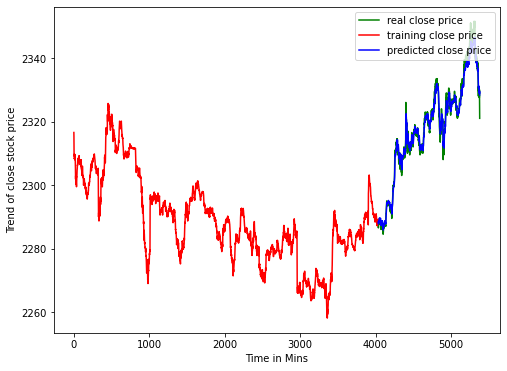

In [ ]:
plt.figure(figsize=(8,6))
real_close = df1_RDSB.Close[-1346: ]
real_close
plt.plot(real_close, 'g', label = 'real close price')
plt.plot(trainPredictPlot, 'r', label = 'training close price')
plt.plot(testPredictPlot, 'b', label = 'predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of close stock price')
plt.show()

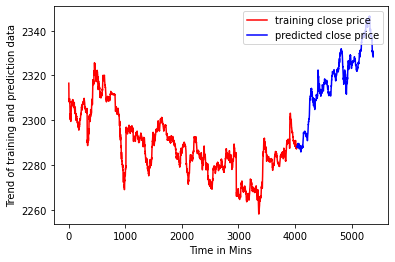

In [ ]:
# PLOT OF MAIN ORDSB VALUES, TRAIN PREDICTIONS AND TEST PREDICTIONS
plt.plot(trainPredictPlot, 'r', label = 'training close price')
plt.plot(testPredictPlot, 'b', label = 'predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of training and prediction data')
plt.show()

In [ ]:
# PREDICT FUTURE VALUES
last_val = testPredict[-1]
last_val_scaled = last_val/last_val
next_val = model.predict(np.reshape(last_val_scaled, (1,1,1)))
print("Last Min Value:", np.asscalar(last_val))
print("Next Min Value:", np.asscalar(last_val*next_val))
# print np.append(last_val, next_val)

Last Min Value: 2328.33251953125
Next Min Value: 2219.0966796875


**ULVR**

In [ ]:
df1_ULVR = df1_ULVR.drop(['20sd','ma7','ma21','upper_band'],axis=1)
df1_ULVR.head(3)

,Open,Close,High,Low,26ema,12ema,ema
0,3805.0,3797.5,3806.0,3797.5,3797.500000,3797.500000,3797.500000
1,3801.0,3800.0,3801.0,3800.0,3798.798077,3798.854167,3799.375000
2,3797.0,3793.0,3797.0,3793.0,3796.714884,3796.569284,3794.961538


In [ ]:
# FUNCTION TO CREATE 1D DATA INTO TIME SERIES DATASET
def new_dataset(dataset, step_size):
	data_X, data_Y = [], []
	for i in range(len(dataset)-step_size-1):
		a = dataset[i:(i+step_size), 0]
		data_X.append(a)
		data_Y.append(dataset[i + step_size, 0])
	return np.array(data_X), np.array(data_Y)

In [ ]:
# FOR REPRODUCIBILITY
np.random.seed(7)

In [ ]:
# IMPORTING DATASET 
df1_ULVR = df1_ULVR.reindex(index = df1_ULVR.index[::-1])
df1_ULVR.head(3)

,Open,Close,High,Low,26ema,12ema,ema
0,3805.0,3797.5,3806.0,3797.5,3797.500000,3797.500000,3797.500000
1,3801.0,3800.0,3801.0,3800.0,3798.798077,3798.854167,3799.375000
2,3797.0,3793.0,3797.0,3793.0,3796.714884,3796.569284,3794.961538


In [ ]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_ULVR) + 1, 1)

In [ ]:
# TAKING DIFFERENT INDICATORS FOR PREDICTION
OULVR_avg = df1_ULVR.mean(axis = 1)
ULVR_avg = df1_ULVR[['High', 'Close']].mean(axis = 1)
close_val = df1_ULVR[['Close']]

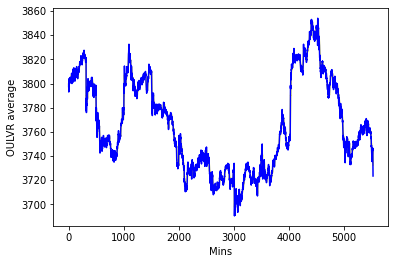

In [ ]:
# PLOTTING All INDICATORS IN PLOT
plt.plot(OULVR_avg, 'yellow', label = 'OULVR avg')
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('OULVR average')
plt.show()

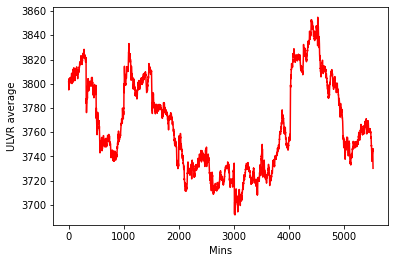

In [ ]:
plt.plot(ULVR_avg, 'red', label = 'ULVR avg')
plt.xlabel('Mins')
plt.ylabel('ULVR average')
plt.show()

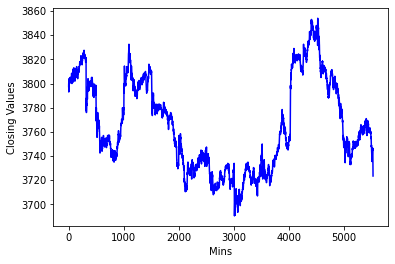

In [ ]:
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('Closing Values')
plt.show()

In [ ]:
# PREPARATION OF TIME SERIES DATASE
OULVR_avg = np.reshape(OULVR_avg.values, (len(OULVR_avg),1)) 
scaler = MinMaxScaler(feature_range=(0, 1))
OULVR_avg = scaler.fit_transform(OULVR_avg)

In [ ]:
OULVR_avg.shape

(5534, 1)

In [ ]:
# TRAIN-TEST SPLIT
train_OULVR = int(len(OULVR_avg) * 0.75)
test_OULVR = len(OULVR_avg) - train_OULVR
train_OULVR, test_OULVR = OULVR_avg[0:train_OULVR,:], OULVR_avg[train_OULVR:len(OULVR_avg),:]

In [ ]:
# TIME-SERIES DATASET (FOR TIME T, VALUES FOR TIME T+1)
trainX, trainY = new_dataset(train_OULVR, 1)
testX, testY = new_dataset(test_OULVR, 1)

In [ ]:
# RESHAPING TRAIN AND TEST DATA
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
step_size = 1

In [ ]:
# LSTM MODEL
model = Sequential()
model.add(LSTM(32, input_shape=(1, step_size), return_sequences = True))
model.add(LSTM(16))
model.add(Dense(1))
model.add(Activation('linear'))

In [ ]:
# MODEL COMPILING AND TRAINING
start = time.time()
model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mae']) 
print ('compilation time : ', time.time() - start)
model.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2)

compilation time :  0.016570329666137695
Epoch 1/50
4148/4148 - 7s - loss: 0.0041 - mae: 0.0235
Epoch 2/50
4148/4148 - 7s - loss: 9.4674e-05 - mae: 0.0071
Epoch 3/50
4148/4148 - 7s - loss: 9.9558e-05 - mae: 0.0072
Epoch 4/50
4148/4148 - 7s - loss: 8.9950e-05 - mae: 0.0070
Epoch 5/50
4148/4148 - 7s - loss: 9.6276e-05 - mae: 0.0072
Epoch 6/50
4148/4148 - 7s - loss: 9.3112e-05 - mae: 0.0070
Epoch 7/50
4148/4148 - 7s - loss: 9.1017e-05 - mae: 0.0069
Epoch 8/50
4148/4148 - 7s - loss: 9.2253e-05 - mae: 0.0070
Epoch 9/50
4148/4148 - 7s - loss: 8.7859e-05 - mae: 0.0067
Epoch 10/50
4148/4148 - 7s - loss: 8.5504e-05 - mae: 0.0067
Epoch 11/50
4148/4148 - 7s - loss: 8.3669e-05 - mae: 0.0066
Epoch 12/50
4148/4148 - 7s - loss: 8.5505e-05 - mae: 0.0067
Epoch 13/50
4148/4148 - 7s - loss: 9.3323e-05 - mae: 0.0070
Epoch 14/50
4148/4148 - 7s - loss: 8.4837e-05 - mae: 0.0066
Epoch 15/50
4148/4148 - 7s - loss: 8.9183e-05 - mae: 0.0067
Epoch 16/50
4148/4148 - 7s - loss: 8.1242e-05 - mae: 0.0065
Epoch 17/50


In [ ]:
mae = model.evaluate(testX, testY, batch_size=16)
print('Mean Absolute Error for Y:', mae)

87/87 [==============================] - 0s 1ms/step - loss: 6.7165e-05 - mae: 0.0058
Mean Absolute Error for Y: [6.716499774483964e-05, 0.005784336011856794]


In [ ]:
# PREDICTION
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

In [ ]:
# DE-NORMALIZING FOR PLOTTING
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

In [ ]:
# TRAINING mse,rmse,mae, r2_score
trainScore1 = mean_squared_error(trainY[0], trainPredict[:,0])
print('Train mse : %.2f' % (trainScore1))
trainScore2 = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train rmse : %.2f' % (trainScore2))
trainScore3 = mean_absolute_error(trainY[0], trainPredict[:,0])
print('Train mae : %.2f' % (trainScore3))
trainScore4 = r2_score(trainY[0], trainPredict[:,0])
print('Train r2_score : %.2f' % (trainScore4))


Train mse : 1.23
Train rmse : 1.11
Train mae : 0.74
Train r2_score : 1.00


In [ ]:
# TEST RMSE
testScore1 = mean_squared_error(testY[0], testPredict[:,0])
print('Test MSE: %.2f' % (testScore1))
testScore2 = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test RMSE: %.2f' % (testScore2))
testScore3 = mean_absolute_error(testY[0], testPredict[:,0])
print('Test mae: %.2f' % (testScore3))
testScore4 = r2_score(testY[0], testPredict[:,0])
print('Test r2_score: %.2f' % (testScore4))

Test MSE: 1.64
Test RMSE: 1.28
Test mae: 0.90
Test r2_score: 1.00


In [ ]:
# CREATING SIMILAR DATASET TO PLOT REAL PREDICTIONS
trainPredictPlot = np.empty_like(OULVR_avg)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[step_size:len(trainPredict)+step_size, :] = trainPredict

In [ ]:
# CREATING SIMILAR DATASSET TO PLOT TEST PREDICTIONS
testPredictPlot = np.empty_like(OULVR_avg)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(step_size*2)+1:len(OULVR_avg)-1, :] = testPredict

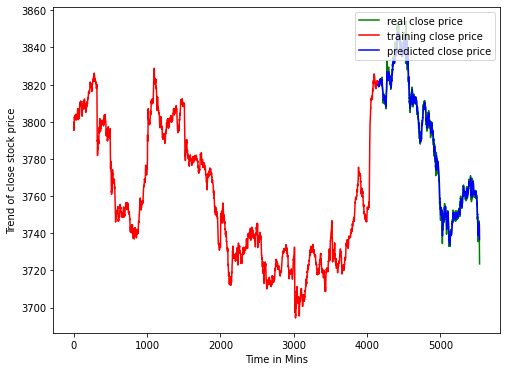

In [ ]:
plt.figure(figsize=(8,6))
real_close = df1_ULVR.Close[-1346: ]
real_close
plt.plot(real_close, 'g', label = 'real close price')
plt.plot(trainPredictPlot, 'r', label = 'training close price')
plt.plot(testPredictPlot, 'b', label = 'predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of close stock price')
plt.show()

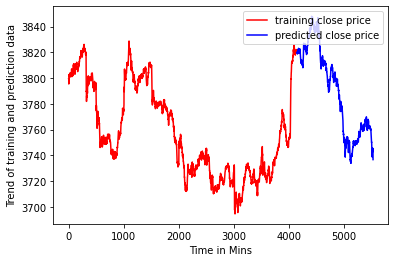

In [ ]:
# PLOT OF MAIN ORDSB VALUES, TRAIN PREDICTIONS AND TEST PREDICTIONS
plt.plot(trainPredictPlot, 'r', label = 'training close price')
plt.plot(testPredictPlot, 'b', label = 'predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of training and prediction data')
plt.show()

In [ ]:
# PREDICT FUTURE VALUES
last_val = testPredict[-1]
last_val_scaled = last_val/last_val
next_val = model.predict(np.reshape(last_val_scaled, (1,1,1)))
print("Last Min Value:", np.asscalar(last_val))
print("Next Min Value:", np.asscalar(last_val*next_val))
# print np.append(last_val, next_val)

Last Min Value: 3736.63623046875
Next Min Value: 3671.523681640625


**HSBC**

In [ ]:
df1_HSBC = df1_HSBC.drop(['ma7','ma21','lower_band'], axis=1)
df1_HSBC.head(3)

,Open,Close,High,Low,26ema,ema
0,751.0,749.2,751.0,749.2,749.200000,749.200000
1,749.2,749.9,750.4,749.2,749.563462,749.725000
2,749.7,749.8,750.2,749.7,749.648448,749.776923


In [ ]:
# FUNCTION TO CREATE 1D DATA INTO TIME SERIES DATASET
def new_dataset(dataset, step_size):
	data_X, data_Y = [], []
	for i in range(len(dataset)-step_size-1):
		a = dataset[i:(i+step_size), 0]
		data_X.append(a)
		data_Y.append(dataset[i + step_size, 0])
	return np.array(data_X), np.array(data_Y)

In [ ]:
# FOR REPRODUCIBILITY
np.random.seed(7)

In [ ]:
# IMPORTING DATASET 
df1_HSBC = df1_HSBC.reindex(index = df1_HSBC.index[::-1])
df1_HSBC.head(3)

,Open,Close,High,Low,26ema,ema
0,751.0,749.2,751.0,749.2,749.200000,749.200000
1,749.2,749.9,750.4,749.2,749.563462,749.725000
2,749.7,749.8,750.2,749.7,749.648448,749.776923


In [ ]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_HSBC) + 1, 1)

In [ ]:
# TAKING DIFFERENT INDICATORS FOR PREDICTION
OHSBC_avg = df1_HSBC.mean(axis = 1)
HSBC_avg = df1_HSBC[['High', 'Close']].mean(axis = 1)
close_val = df1_HSBC[['Close']]

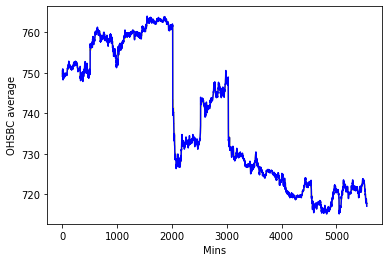

In [ ]:
# PLOTTING All INDICATORS IN PLOT
plt.plot(OHSBC_avg, 'yellow', label = 'OHSBC avg')
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('OHSBC average')
plt.show()

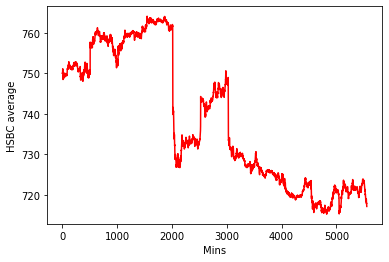

In [ ]:
plt.plot(HSBC_avg, 'red', label = 'HSBC avg')
plt.xlabel('Mins')
plt.ylabel('HSBC average')
plt.show()

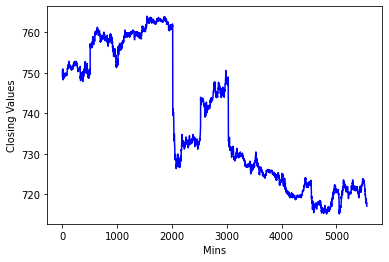

In [ ]:
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('Closing Values')
plt.show()

In [ ]:
# PREPARATION OF TIME SERIES DATASE
OHSBC_avg = np.reshape(OHSBC_avg.values, (len(OHSBC_avg),1)) 
scaler = MinMaxScaler(feature_range=(0, 1))
OHSBC_avg = scaler.fit_transform(OHSBC_avg)

In [ ]:
# TRAIN-TEST SPLIT
train_OHSBC = int(len(OHSBC_avg) * 0.75)
test_OHSBC = len(OHSBC_avg) - train_OHSBC
train_OHSBC, test_OHSBC = OHSBC_avg[0:train_OHSBC,:], OHSBC_avg[train_OHSBC:len(OHSBC_avg),:]

In [ ]:
# TIME-SERIES DATASET (FOR TIME T, VALUES FOR TIME T+1)
trainX, trainY = new_dataset(train_OHSBC, 1)
testX, testY = new_dataset(test_OHSBC, 1)

In [ ]:
testY

array([0.08611258, 0.08429573, 0.08502456, ..., 0.05256895, 0.05304955,
       0.04290494])

In [ ]:
# RESHAPING TRAIN AND TEST DATA
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
step_size = 1

In [ ]:
# LSTM MODEL
model = Sequential()
model.add(LSTM(32, input_shape=(1, step_size), return_sequences = True))
model.add(LSTM(16))
model.add(Dense(1))
model.add(Activation('linear'))

In [ ]:
# MODEL COMPILING AND TRAINING
start = time.time()
model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mae']) 
print ('compilation time : ', time.time() - start)
model.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2)

compilation time :  0.015291452407836914
Epoch 1/50
4165/4165 - 7s - loss: 0.0076 - mae: 0.0304
Epoch 2/50
4165/4165 - 7s - loss: 1.0883e-04 - mae: 0.0053
Epoch 3/50
4165/4165 - 7s - loss: 1.1099e-04 - mae: 0.0053
Epoch 4/50
4165/4165 - 7s - loss: 1.1824e-04 - mae: 0.0058
Epoch 5/50
4165/4165 - 7s - loss: 1.1624e-04 - mae: 0.0054
Epoch 6/50
4165/4165 - 7s - loss: 1.1171e-04 - mae: 0.0057
Epoch 7/50
4165/4165 - 7s - loss: 1.0245e-04 - mae: 0.0050
Epoch 8/50
4165/4165 - 7s - loss: 1.1436e-04 - mae: 0.0053
Epoch 9/50
4165/4165 - 7s - loss: 1.2982e-04 - mae: 0.0052
Epoch 10/50
4165/4165 - 7s - loss: 1.1314e-04 - mae: 0.0054
Epoch 11/50
4165/4165 - 8s - loss: 1.1042e-04 - mae: 0.0049
Epoch 12/50
4165/4165 - 7s - loss: 1.0363e-04 - mae: 0.0050
Epoch 13/50
4165/4165 - 7s - loss: 1.0413e-04 - mae: 0.0050
Epoch 14/50
4165/4165 - 7s - loss: 9.5148e-05 - mae: 0.0046
Epoch 15/50
4165/4165 - 7s - loss: 1.1198e-04 - mae: 0.0052
Epoch 16/50
4165/4165 - 7s - loss: 9.7694e-05 - mae: 0.0046
Epoch 17/50


In [ ]:
mae = model.evaluate(testX, testY, batch_size=16)
print('Mean Absolute Error for Y:', mae)

87/87 [==============================] - 0s 1ms/step - loss: 1.5069e-05 - mae: 0.0027
Mean Absolute Error for Y: [1.5068744687596336e-05, 0.0027227005921304226]


In [ ]:
# PREDICTION
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

In [ ]:
# DE-NORMALIZING FOR PLOTTING
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

In [ ]:
# TRAINING mse,rmse,mae, r2_score
trainScore1 = mean_squared_error(trainY[0], trainPredict[:,0])
print('Train mse : %.2f' % (trainScore1))
trainScore2 = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train rmse : %.2f' % (trainScore2))
trainScore3 = mean_absolute_error(trainY[0], trainPredict[:,0])
print('Train mae : %.2f' % (trainScore3))
trainScore4 = r2_score(trainY[0], trainPredict[:,0])
print('Train r2_score : %.2f' % (trainScore4))

Train mse : 0.15
Train rmse : 0.38
Train mae : 0.15
Train r2_score : 1.00


In [ ]:
# TEST RMSE
testScore1 = mean_squared_error(testY[0], testPredict[:,0])
print('Test MSE: %.2f' % (testScore1))
testScore2 = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test RMSE: %.2f' % (testScore2))
testScore3 = mean_absolute_error(testY[0], testPredict[:,0])
print('Test mae: %.2f' % (testScore3))
testScore4 = r2_score(testY[0], testPredict[:,0])
print('Test r2_score: %.2f' % (testScore4))

Test MSE: 0.04
Test RMSE: 0.19
Test mae: 0.13
Test r2_score: 0.99


In [ ]:
# CREATING SIMILAR DATASET TO PLOT REAL PREDICTIONS
trainPredictPlot = np.empty_like(OHSBC_avg)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[step_size:len(trainPredict)+step_size, :] = trainPredict

In [ ]:
# CREATING SIMILAR DATASSET TO PLOT TEST PREDICTIONS
testPredictPlot = np.empty_like(OHSBC_avg)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(step_size*2)+1:len(OHSBC_avg)-1, :] = testPredict

In [ ]:
real_close = OHSBC_avg[-1388: ]
real_close.head(3)

4169    719.407983
4170    719.443345
4171    719.454176
dtype: float64

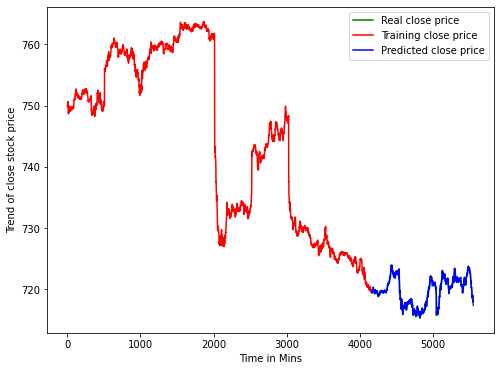

In [ ]:
plt.figure(figsize=(8,6))
plt.plot(real_close, 'g', label = 'Real close price')
plt.plot(trainPredictPlot, 'r', label = 'Training close price')
plt.plot(testPredictPlot, 'b', label = 'Predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of close stock price')
plt.show()

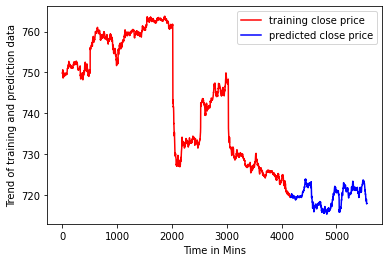

In [ ]:
# PLOT OF MAIN OHSBC VALUES, TRAIN PREDICTIONS AND TEST PREDICTIONS
plt.plot(trainPredictPlot, 'r', label = 'training close price')
plt.plot(testPredictPlot, 'b', label = 'predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of training and prediction data')
plt.show()

In [ ]:
# PREDICT FUTURE VALUES
last_val = testPredict[-1]
last_val_scaled = last_val/last_val
next_val = model.predict(np.reshape(last_val_scaled, (1,1,1)))
print("Last Min Value:", np.asscalar(last_val))
print("Next Min Value:", np.asscalar(last_val*next_val))
# print np.append(last_val, next_val)

Last Min Value: 717.9691162109375
Next Min Value: 716.53271484375


**BP**

In [ ]:
df1_BP = df1_BP.drop(['ma7','ma21','MACD','upper_band','lower_band','ARIMA'],axis=1)
df1_BP.head()

,Open,Close,High,Low,26ema,ema
5574,475.15,475.15,475.15,475.15,476.697615,475.266044
5573,475.15,475.15,475.15,475.15,476.821424,475.498131
5572,476.45,476.05,476.50,476.05,476.955138,476.194392
5571,476.60,476.40,476.60,476.25,477.027549,476.483177
5570,476.60,476.65,476.85,476.55,477.077753,476.649531


In [ ]:
# FUNCTION TO CREATE 1D DATA INTO TIME SERIES DATASET
def new_dataset(dataset, step_size):
	data_X, data_Y = [], []
	for i in range(len(dataset)-step_size-1):
		a = dataset[i:(i+step_size), 0]
		data_X.append(a)
		data_Y.append(dataset[i + step_size, 0])
	return np.array(data_X), np.array(data_Y)

In [ ]:
# FOR REPRODUCIBILITY
np.random.seed(7)

In [ ]:
# IMPORTING DATASET 
df1_BP = df1_BP.reindex(index = df1_BP.index[::-1])
df1_BP.head(3)

,Open,Close,High,Low,26ema,ema
0,477.00,476.70,478.00,476.50,476.700000,476.700000
1,477.05,476.25,477.05,476.25,476.466346,476.362500
2,476.05,475.00,476.05,475.00,475.939502,475.419231


In [ ]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_BP) + 1, 1)

In [ ]:
# TAKING DIFFERENT INDICATORS FOR PREDICTION
OBP_avg = df1_BP.mean(axis = 1)
BP_avg = df1_BP[['High', 'Close']].mean(axis = 1)
close_val = df1_BP[['Close']]

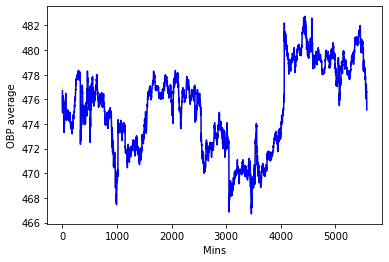

In [ ]:
# PLOTTING All INDICATORS IN PLOT
plt.plot(OBP_avg, 'yellow', label = 'OBP avg')
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('OBP average')
plt.show()

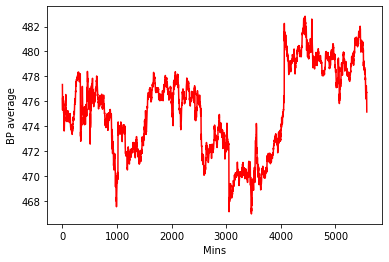

In [ ]:
plt.plot(BP_avg, 'red', label = 'BP avg')
plt.xlabel('Mins')
plt.ylabel('BP average')
plt.show()

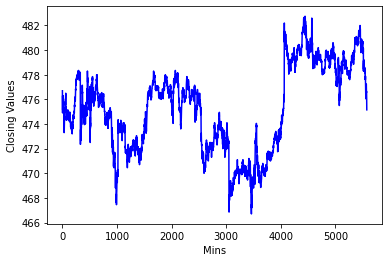

In [ ]:
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('Closing Values')
plt.show()

In [ ]:
# PREPARATION OF TIME SERIES DATASE
OBP_avg = np.reshape(OBP_avg.values, (len(OBP_avg),1)) 
scaler = MinMaxScaler(feature_range=(0, 1))
OBP_avg = scaler.fit_transform(OBP_avg)

In [ ]:
# TRAIN-TEST SPLIT
train_OBP = int(len(OBP_avg) * 0.75)
test_OBP = len(OBP_avg) - train_OBP
train_OBP, test_OBP = OBP_avg[0:train_OBP,:], OBP_avg[train_OBP:len(OBP_avg),:]

In [ ]:
# TIME-SERIES DATASET (FOR TIME T, VALUES FOR TIME T+1)
trainX, trainY = new_dataset(train_OBP, 1)
testX, testY = new_dataset(test_OBP, 1)

In [ ]:
# RESHAPING TRAIN AND TEST DATA
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
step_size = 1

In [ ]:
# LSTM MODEL
model = Sequential()
model.add(LSTM(32, input_shape=(1, step_size), return_sequences = True))
model.add(LSTM(16))
model.add(Dense(1))
model.add(Activation('linear'))

In [ ]:
# MODEL COMPILING AND TRAINING
start = time.time()
model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mae']) 
print ('compilation time : ', time.time() - start)
model.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2)

compilation time :  0.010390996932983398
Epoch 1/50
4179/4179 - 7s - loss: 0.0037 - mae: 0.0245
Epoch 2/50
4179/4179 - 7s - loss: 1.9474e-04 - mae: 0.0093
Epoch 3/50
4179/4179 - 7s - loss: 1.9664e-04 - mae: 0.0092
Epoch 4/50
4179/4179 - 7s - loss: 1.9750e-04 - mae: 0.0093
Epoch 5/50
4179/4179 - 8s - loss: 1.9431e-04 - mae: 0.0092
Epoch 6/50
4179/4179 - 7s - loss: 1.9602e-04 - mae: 0.0092
Epoch 7/50
4179/4179 - 7s - loss: 1.8644e-04 - mae: 0.0089
Epoch 8/50
4179/4179 - 7s - loss: 1.7672e-04 - mae: 0.0086
Epoch 9/50
4179/4179 - 7s - loss: 1.8594e-04 - mae: 0.0089
Epoch 10/50
4179/4179 - 7s - loss: 1.8666e-04 - mae: 0.0089
Epoch 11/50
4179/4179 - 7s - loss: 1.8054e-04 - mae: 0.0087
Epoch 12/50
4179/4179 - 7s - loss: 1.8529e-04 - mae: 0.0090
Epoch 13/50
4179/4179 - 7s - loss: 1.8257e-04 - mae: 0.0089
Epoch 14/50
4179/4179 - 7s - loss: 1.8318e-04 - mae: 0.0088
Epoch 15/50
4179/4179 - 7s - loss: 1.7539e-04 - mae: 0.0085
Epoch 16/50
4179/4179 - 7s - loss: 1.8495e-04 - mae: 0.0090
Epoch 17/50


In [ ]:
mae = model.evaluate(testX, testY, batch_size=16)
print('Mean Absolute Error for Y:', mae)

87/87 [==============================] - 0s 1ms/step - loss: 1.0204e-04 - mae: 0.0075
Mean Absolute Error for Y: [0.00010203509009443223, 0.007484932895749807]


In [ ]:
# PREDICTION
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

In [ ]:
# DE-NORMALIZING FOR PLOTTING
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

In [ ]:
# TRAINING mse,rmse,mae, r2_score
trainScore1 = mean_squared_error(trainY[0], trainPredict[:,0])
print('Train mse : %.2f' % (trainScore1))
trainScore2 = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train rmse : %.2f' % (trainScore2))
trainScore3 = mean_absolute_error(trainY[0], trainPredict[:,0])
print('Train mae : %.2f' % (trainScore3))
trainScore4 = r2_score(trainY[0], trainPredict[:,0])
print('Train r2_score : %.2f' % (trainScore4))

Train mse : 0.11
Train rmse : 0.33
Train mae : 0.27
Train r2_score : 0.99


In [ ]:
# TEST RMSE
testScore1 = mean_squared_error(testY[0], testPredict[:,0])
print('Test MSE: %.2f' % (testScore1))
testScore2 = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test RMSE: %.2f' % (testScore2))
testScore3 = mean_absolute_error(testY[0], testPredict[:,0])
print('Test mae: %.2f' % (testScore3))
testScore4 = r2_score(testY[0], testPredict[:,0])
print('Test r2_score: %.2f' % (testScore4))

Test MSE: 0.02
Test RMSE: 0.16
Test mae: 0.12
Test r2_score: 0.98


In [ ]:
# CREATING SIMILAR DATASET TO PLOT REAL PREDICTIONS
trainPredictPlot = np.empty_like(OBP_avg)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[step_size:len(trainPredict)+step_size, :] = trainPredict

In [ ]:
# CREATING SIMILAR DATASSET TO PLOT TEST PREDICTIONS
testPredictPlot = np.empty_like(OBP_avg)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(step_size*2)+1:len(OBP_avg)-1, :] = testPredict

In [ ]:
real_close = OBP_avg[-1392: ]
real_close.head(3)

4183    478.399341
4184    478.528269
4185    478.526337
dtype: float64

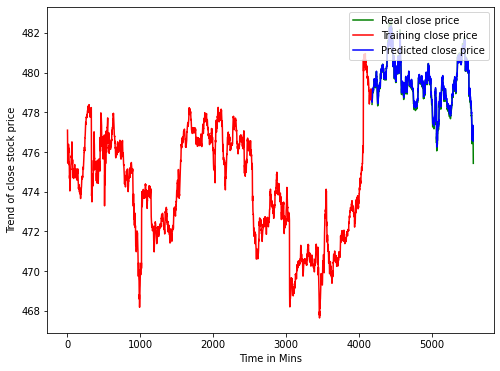

In [ ]:
plt.figure(figsize=(8,6))
plt.plot(real_close, 'g', label = 'Real close price')
plt.plot(trainPredictPlot, 'r', label = 'Training close price')
plt.plot(testPredictPlot, 'b', label = 'Predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of close stock price')
plt.show()

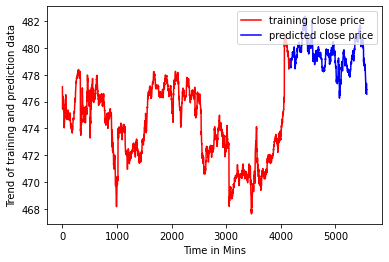

In [ ]:
# PLOT OF MAIN ORDSB VALUES, TRAIN PREDICTIONS AND TEST PREDICTIONS
plt.plot(trainPredictPlot, 'r', label = 'training close price')
plt.plot(testPredictPlot, 'b', label = 'predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of training and prediction data')
plt.show()

In [ ]:
# PREDICT FUTURE VALUES
last_val = testPredict[-1]
last_val_scaled = last_val/last_val
next_val = model.predict(np.reshape(last_val_scaled, (1,1,1)))
print("Last Min Value:", np.asscalar(last_val))
print("Next Min Value:", np.asscalar(last_val*next_val))
# print np.append(last_val, next_val)

Last Min Value: 476.5503845214844
Next Min Value: 469.4687805175781


**GSK**

In [ ]:
df1_GSK = df1_GSK.drop(['ma7','upper_band','lower_band','ARIMA'],axis=1)
df1_GSK.head(3)

,Close,High,Low,26ema,12ema,ema
0,1292.8,1294.0,1291.0,1292.800000,1292.800000,1292.800000
1,1288.8,1293.0,1288.8,1290.723077,1290.633333,1289.800000
2,1286.4,1289.6,1286.0,1289.169837,1288.981062,1287.446154


In [ ]:
# FUNCTION TO CREATE 1D DATA INTO TIME SERIES DATASET
def new_dataset(dataset, step_size):
	data_X, data_Y = [], []
	for i in range(len(dataset)-step_size-1):
		a = dataset[i:(i+step_size), 0]
		data_X.append(a)
		data_Y.append(dataset[i + step_size, 0])
	return np.array(data_X), np.array(data_Y)

In [ ]:
# FOR REPRODUCIBILITY
np.random.seed(7)

In [ ]:
# IMPORTING DATASET 
df1_GSK = df1_GSK.reindex(index = df1_GSK.index[::-1])
df1_GSK.head(3)

,Close,High,Low,26ema,12ema,ema
0,1292.8,1294.0,1291.0,1292.800000,1292.800000,1292.800000
1,1288.8,1293.0,1288.8,1290.723077,1290.633333,1289.800000
2,1286.4,1289.6,1286.0,1289.169837,1288.981062,1287.446154


In [ ]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_GSK) + 1, 1)

In [ ]:
# TAKING DIFFERENT INDICATORS FOR PREDICTION
OGSK_avg = df1_GSK.mean(axis = 1)
GSK_avg = df1_GSK[['High', 'Close']].mean(axis = 1)
close_val = df1_GSK[['Close']]

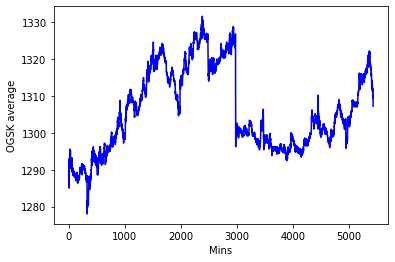

In [ ]:
# PLOTTING All INDICATORS IN PLOT
plt.plot(OGSK_avg, 'yellow', label = 'OGSK avg')
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('OGSK average')
plt.show()

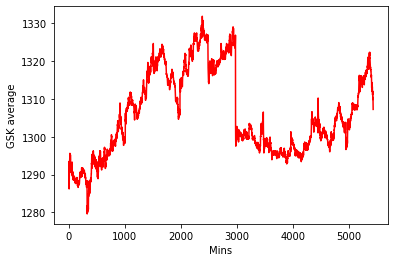

In [ ]:
plt.plot(GSK_avg, 'red', label = 'GSK avg')
plt.xlabel('Mins')
plt.ylabel('GSK average')
plt.show()

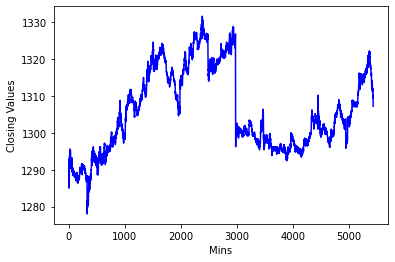

In [ ]:
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('Closing Values')
plt.show()

In [ ]:
# PREPARATION OF TIME SERIES DATASE
OGSK_avg = np.reshape(OGSK_avg.values, (len(OGSK_avg),1)) 
scaler = MinMaxScaler(feature_range=(0, 1))
OGSK_avg = scaler.fit_transform(OGSK_avg)

In [ ]:
# TRAIN-TEST SPLIT
train_OGSK = int(len(OGSK_avg) * 0.75)
test_OGSK = len(OGSK_avg) - train_OGSK
train_OGSK, test_OGSK = OGSK_avg[0:train_OGSK,:], OGSK_avg[train_OGSK:len(OGSK_avg),:]

In [ ]:
# TIME-SERIES DATASET (FOR TIME T, VALUES FOR TIME T+1)
trainX, trainY = new_dataset(train_OGSK, 1)
testX, testY = new_dataset(test_OGSK, 1)

In [ ]:
# RESHAPING TRAIN AND TEST DATA
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
step_size = 1

In [ ]:
# LSTM MODEL
model = Sequential()
model.add(LSTM(32, input_shape=(1, step_size), return_sequences = True))
model.add(LSTM(16))
model.add(Dense(1))
model.add(Activation('linear'))

In [ ]:
# MODEL COMPILING AND TRAINING
start = time.time()
model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mae']) 
print ('compilation time : ', time.time() - start)
model.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2)

compilation time :  0.009692668914794922
Epoch 1/50
4072/4072 - 7s - loss: 0.0057 - mae: 0.0277
Epoch 2/50
4072/4072 - 7s - loss: 1.2792e-04 - mae: 0.0071
Epoch 3/50
4072/4072 - 7s - loss: 1.2588e-04 - mae: 0.0072
Epoch 4/50
4072/4072 - 7s - loss: 1.2752e-04 - mae: 0.0071
Epoch 5/50
4072/4072 - 7s - loss: 1.2186e-04 - mae: 0.0073
Epoch 6/50
4072/4072 - 8s - loss: 1.2829e-04 - mae: 0.0071
Epoch 7/50
4072/4072 - 7s - loss: 1.4044e-04 - mae: 0.0073
Epoch 8/50
4072/4072 - 7s - loss: 1.1538e-04 - mae: 0.0069
Epoch 9/50
4072/4072 - 7s - loss: 1.2566e-04 - mae: 0.0071
Epoch 10/50
4072/4072 - 7s - loss: 1.1280e-04 - mae: 0.0070
Epoch 11/50
4072/4072 - 7s - loss: 1.2696e-04 - mae: 0.0072
Epoch 12/50
4072/4072 - 7s - loss: 1.2491e-04 - mae: 0.0073
Epoch 13/50
4072/4072 - 7s - loss: 1.2941e-04 - mae: 0.0073
Epoch 14/50
4072/4072 - 7s - loss: 1.1857e-04 - mae: 0.0071
Epoch 15/50
4072/4072 - 7s - loss: 1.1804e-04 - mae: 0.0070
Epoch 16/50
4072/4072 - 7s - loss: 1.2474e-04 - mae: 0.0069
Epoch 17/50


In [ ]:
mae = model.evaluate(testX, testY, batch_size=16)
print('Mean Absolute Error for Y:', mae)

85/85 [==============================] - 0s 1ms/step - loss: 6.4855e-05 - mae: 0.0058
Mean Absolute Error for Y: [6.485501944553107e-05, 0.005776712205260992]


In [ ]:
# PREDICTION
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

In [ ]:
# DE-NORMALIZING FOR PLOTTING
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

In [ ]:
# TRAINING mse,rmse,mae, r2_score
trainScore1 = mean_squared_error(trainY[0], trainPredict[:,0])
print('Train mse : %.2f' % (trainScore1))
trainScore2 = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train rmse : %.2f' % (trainScore2))
trainScore3 = mean_absolute_error(trainY[0], trainPredict[:,0])
print('Train mae : %.2f' % (trainScore3))
trainScore4 = r2_score(trainY[0], trainPredict[:,0])
print('Train r2_score : %.2f' % (trainScore4))

Train mse : 0.23
Train rmse : 0.48
Train mae : 0.32
Train r2_score : 1.00


In [ ]:
# TEST RMSE
testScore1 = mean_squared_error(testY[0], testPredict[:,0])
print('Test MSE: %.2f' % (testScore1))
testScore2 = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test RMSE: %.2f' % (testScore2))
testScore3 = mean_absolute_error(testY[0], testPredict[:,0])
print('Test mae: %.2f' % (testScore3))
testScore4 = r2_score(testY[0], testPredict[:,0])
print('Test r2_score: %.2f' % (testScore4))

Test MSE: 0.16
Test RMSE: 0.40
Test mae: 0.29
Test r2_score: 1.00


In [ ]:
# CREATING SIMILAR DATASET TO PLOT REAL PREDICTIONS
trainPredictPlot = np.empty_like(OGSK_avg)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[step_size:len(trainPredict)+step_size, :] = trainPredict

In [ ]:
# CREATING SIMILAR DATASSET TO PLOT TEST PREDICTIONS
testPredictPlot = np.empty_like(OGSK_avg)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(step_size*2)+1:len(OGSK_avg)-1, :] = testPredict

In [ ]:
real_close = OGSK_avg[-1356: ]
real_close.head(3)

4076    1295.559257
4077    1295.508280
4078    1295.171672
dtype: float64

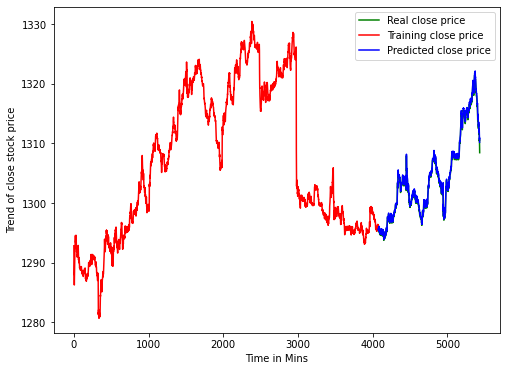

In [ ]:
plt.figure(figsize=(8,6))
plt.plot(real_close, 'g', label = 'Real close price')
plt.plot(trainPredictPlot, 'r', label = 'Training close price')
plt.plot(testPredictPlot, 'b', label = 'Predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of close stock price')
plt.show()

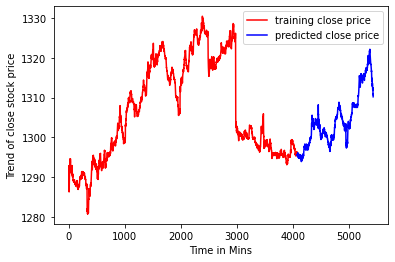

In [ ]:
# PLOT OF MAIN OULVR VALUES, TRAIN PREDICTIONS AND TEST PREDICTIONS
plt.plot(trainPredictPlot, 'r', label = 'training close price')
plt.plot(testPredictPlot, 'b', label = 'predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of close stock price')
plt.show()

In [ ]:
# PREDICT FUTURE VALUES
last_val = testPredict[-1]
last_val_scaled = last_val/last_val
next_val = model.predict(np.reshape(last_val_scaled, (1,1,1)))
print("Last Min Value:", np.asscalar(last_val))
print("Next Min Value:", np.asscalar(last_val*next_val))
# print np.append(last_val, next_val)

Last Min Value: 1310.184326171875
Next Min Value: 1314.8975830078125


**LLOY**

In [ ]:
df1_LLOY = df1_LLOY.drop(['Low','ma7','ma21','upper_band','lower_band'],axis=1)
df1_LLOY.head(3)

,Open,Close,High,26ema,12ema,ema
0,67.00,67.07,67.07,67.070000,67.070000,67.070000
1,67.17,67.16,67.18,67.116731,67.118750,67.137500
2,67.10,66.98,67.10,67.067605,67.064596,67.028462


In [ ]:
# FUNCTION TO CREATE 1D DATA INTO TIME SERIES DATASET
def new_dataset(dataset, step_size):
	data_X, data_Y = [], []
	for i in range(len(dataset)-step_size-1):
		a = dataset[i:(i+step_size), 0]
		data_X.append(a)
		data_Y.append(dataset[i + step_size, 0])
	return np.array(data_X), np.array(data_Y)

In [ ]:
# FOR REPRODUCIBILITY
np.random.seed(7)

In [ ]:
# IMPORTING DATASET 
df1_LLOY = df1_LLOY.reindex(index = df1_LLOY.index[::-1])
df1_LLOY.head(3)

,Open,Close,High,26ema,12ema,ema
0,67.00,67.07,67.07,67.070000,67.070000,67.070000
1,67.17,67.16,67.18,67.116731,67.118750,67.137500
2,67.10,66.98,67.10,67.067605,67.064596,67.028462


In [ ]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_LLOY) + 1, 1)

In [ ]:
# TAKING DIFFERENT INDICATORS FOR PREDICTION
OLLOY_avg = df1_LLOY.mean(axis = 1)
LLOY_avg = df1_LLOY[['High', 'Close']].mean(axis = 1)
close_val = df1_LLOY[['Close']]

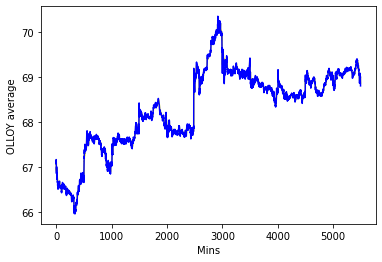

In [ ]:
# PLOTTING All INDICATORS IN PLOT
plt.plot(OLLOY_avg, 'yellow', label = 'OLLOY avg')
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('OLLOY average')
plt.show()

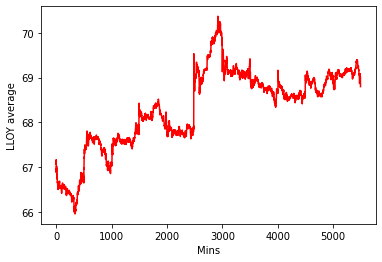

In [ ]:
plt.plot(LLOY_avg, 'red', label = 'LLOY avg')
plt.xlabel('Mins')
plt.ylabel('LLOY average')
plt.show()

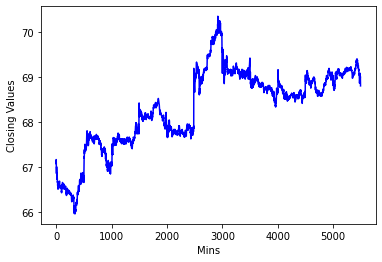

In [ ]:
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('Closing Values')
plt.show()

In [ ]:
# PREPARATION OF TIME SERIES DATASE
OLLOY_avg = np.reshape(OLLOY_avg.values, (len(OLLOY_avg),1)) 
scaler = MinMaxScaler(feature_range=(0, 1))
OLLOY_avg = scaler.fit_transform(OLLOY_avg)

In [ ]:
# TRAIN-TEST SPLIT
train_OLLOY = int(len(OLLOY_avg) * 0.75)
test_OLLOY = len(OLLOY_avg) - train_OLLOY
train_OLLOY, test_OLLOY = OLLOY_avg[0:train_OLLOY,:], OLLOY_avg[train_OLLOY:len(OLLOY_avg),:]

In [ ]:
# TIME-SERIES DATASET (FOR TIME T, VALUES FOR TIME T+1)
trainX, trainY = new_dataset(train_OLLOY, 1)
testX, testY = new_dataset(test_OLLOY, 1)

In [ ]:
# RESHAPING TRAIN AND TEST DATA
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
step_size = 1

In [ ]:
# LSTM MODEL
model = Sequential()
model.add(LSTM(32, input_shape=(1, step_size), return_sequences = True))
model.add(LSTM(16))
model.add(Dense(1))
model.add(Activation('linear'))

In [ ]:
# MODEL COMPILING AND TRAINING
start = time.time()
model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mae']) 
print ('compilation time : ', time.time() - start)
model.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2)

compilation time :  0.012542963027954102
Epoch 1/50
4119/4119 - 8s - loss: 0.0061 - mae: 0.0267
Epoch 2/50
4119/4119 - 7s - loss: 7.5542e-05 - mae: 0.0053
Epoch 3/50
4119/4119 - 7s - loss: 7.8505e-05 - mae: 0.0056
Epoch 4/50
4119/4119 - 8s - loss: 7.2949e-05 - mae: 0.0053
Epoch 5/50
4119/4119 - 7s - loss: 7.3718e-05 - mae: 0.0054
Epoch 6/50
4119/4119 - 7s - loss: 7.5424e-05 - mae: 0.0053
Epoch 7/50
4119/4119 - 7s - loss: 7.2797e-05 - mae: 0.0052
Epoch 8/50
4119/4119 - 7s - loss: 7.5687e-05 - mae: 0.0053
Epoch 9/50
4119/4119 - 7s - loss: 7.3723e-05 - mae: 0.0051
Epoch 10/50
4119/4119 - 8s - loss: 7.1991e-05 - mae: 0.0051
Epoch 11/50
4119/4119 - 7s - loss: 6.8382e-05 - mae: 0.0050
Epoch 12/50
4119/4119 - 7s - loss: 6.4045e-05 - mae: 0.0049
Epoch 13/50
4119/4119 - 7s - loss: 6.5064e-05 - mae: 0.0048
Epoch 14/50
4119/4119 - 7s - loss: 6.8409e-05 - mae: 0.0051
Epoch 15/50
4119/4119 - 7s - loss: 6.6638e-05 - mae: 0.0049
Epoch 16/50
4119/4119 - 7s - loss: 7.2271e-05 - mae: 0.0051
Epoch 17/50


In [ ]:
mae = model.evaluate(testX, testY, batch_size=16)
print('Mean Absolute Error for Y:', mae)

86/86 [==============================] - 0s 1ms/step - loss: 2.2812e-05 - mae: 0.0037
Mean Absolute Error for Y: [2.2812228053226136e-05, 0.0036593505647033453]


In [ ]:
# PREDICTION
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

In [ ]:
# DE-NORMALIZING FOR PLOTTING
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

In [ ]:
# TRAINING mse,rmse,mae, r2_score
trainScore1 = mean_squared_error(trainY[0], trainPredict[:,0])
print('Train mse : %.2f' % (trainScore1))
trainScore2 = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train rmse : %.2f' % (trainScore2))
trainScore3 = mean_absolute_error(trainY[0], trainPredict[:,0])
print('Train mae : %.2f' % (trainScore3))
trainScore4 = r2_score(trainY[0], trainPredict[:,0])
print('Train r2_score : %.2f' % (trainScore4))

Train mse : 0.00
Train rmse : 0.03
Train mae : 0.02
Train r2_score : 1.00


In [ ]:
# TEST RMSE
testScore1 = mean_squared_error(testY[0], testPredict[:,0])
print('Test MSE: %.2f' % (testScore1))
testScore2 = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test RMSE: %.2f' % (testScore2))
testScore3 = mean_absolute_error(testY[0], testPredict[:,0])
print('Test mae: %.2f' % (testScore3))
testScore4 = r2_score(testY[0], testPredict[:,0])
print('Test r2_score: %.2f' % (testScore4))

Test MSE: 0.00
Test RMSE: 0.02
Test mae: 0.02
Test r2_score: 0.99


In [ ]:
# CREATING SIMILAR DATASET TO PLOT REAL PREDICTIONS
trainPredictPlot = np.empty_like(OLLOY_avg)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[step_size:len(trainPredict)+step_size, :] = trainPredict

In [ ]:
# CREATING SIMILAR DATASSET TO PLOT TEST PREDICTIONS
testPredictPlot = np.empty_like(OLLOY_avg)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(step_size*2)+1:len(OLLOY_avg)-1, :] = testPredict

In [ ]:
real_close_L = df1_LLOY[['Close']]
real_close_L.head(3)
real_close = real_close_L[-1372:]
real_close.head(3)

,Close
4123,68.54
4124,68.52
4125,68.52


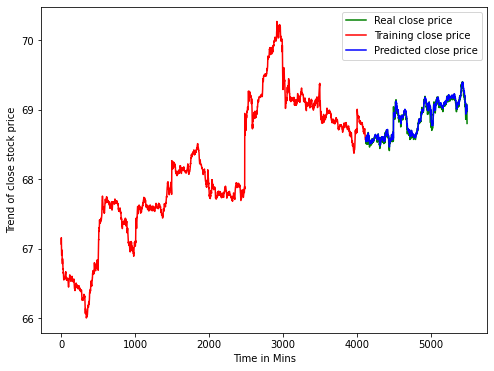

In [ ]:
plt.figure(figsize=(8,6))
plt.plot(real_close, 'g', label = 'Real close price')
plt.plot(trainPredictPlot, 'r', label = 'Training close price')
plt.plot(testPredictPlot, 'b', label = 'Predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of close stock price')
plt.show()

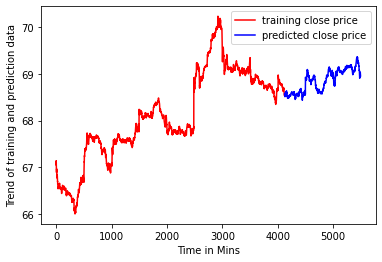

In [ ]:
# PLOT OF MAIN ORDSB VALUES, TRAIN PREDICTIONS AND TEST PREDICTIONS
plt.plot(trainPredictPlot, 'r', label = 'training close price')
plt.plot(testPredictPlot, 'b', label = 'predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of training and prediction data')
plt.show()

In [ ]:
# PREDICT FUTURE VALUES
last_val = testPredict[-1]
last_val_scaled = last_val/last_val
next_val = model.predict(np.reshape(last_val_scaled, (1,1,1)))
print("Last Min Value:", np.asscalar(last_val))
print("Next Min Value:", np.asscalar(last_val*next_val))
# print np.append(last_val, next_val)

Last Min Value: 68.95814514160156
Next Min Value: 68.58219146728516


**AZN**

In [ ]:
df1_AZN = df1_AZN.drop(['lower_band'],axis=1)
df1_AZN.head(3)

,Open,Close,High,Low,26ema,ema
0,4835.5,4832.5,4838.0,4832.5,4832.500000,4832.500000
1,4832.5,4832.5,4832.5,4832.5,4832.500000,4832.500000
2,4834.5,4830.0,4838.0,4830.0,4831.601774,4830.769231


In [ ]:
# FUNCTION TO CREATE 1D DATA INTO TIME SERIES DATASET
def new_dataset(dataset, step_size):
	data_X, data_Y = [], []
	for i in range(len(dataset)-step_size-1):
		a = dataset[i:(i+step_size), 0]
		data_X.append(a)
		data_Y.append(dataset[i + step_size, 0])
	return np.array(data_X), np.array(data_Y)

In [ ]:
# FOR REPRODUCIBILITY
np.random.seed(7)

In [ ]:
# IMPORTING DATASET 
df1_AZN = df1_AZN.reindex(index = df1_AZN.index[::-1])
df1_AZN.head(3)

In [ ]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_AZN) + 1, 1)

In [ ]:
# TAKING DIFFERENT INDICATORS FOR PREDICTION
OAZN_avg = df1_AZN.mean(axis = 1)
AZN_avg = df1_AZN[['High', 'Close']].mean(axis = 1)
close_val = df1_AZN[['Close']]

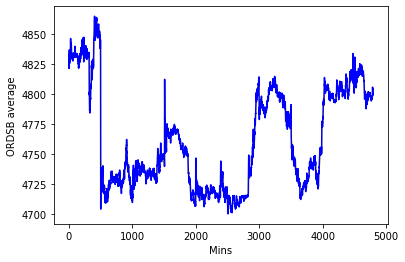

In [ ]:
# PLOTTING All INDICATORS IN PLOT
plt.plot(OAZN_avg, 'yellow', label = 'OAZN avg')
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('ORDSB average')
plt.show()

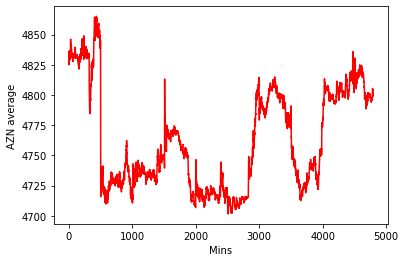

In [ ]:
plt.plot(AZN_avg, 'red', label = 'AZN avg')
plt.xlabel('Mins')
plt.ylabel('AZN average')
plt.show()

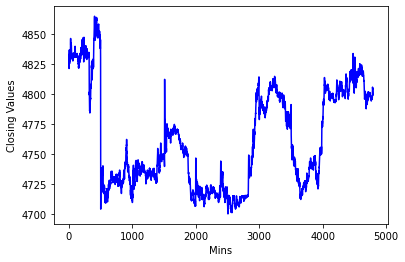

In [ ]:
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('Closing Values')
plt.show()

In [ ]:
# PREPARATION OF TIME SERIES DATASE
OAZN_avg = np.reshape(OAZN_avg.values, (len(OAZN_avg),1)) 
scaler = MinMaxScaler(feature_range=(0, 1))
OAZN_avg = scaler.fit_transform(OAZN_avg)

In [ ]:
# TRAIN-TEST SPLIT
train_OAZN = int(len(OAZN_avg) * 0.75)
test_OAZN = len(OAZN_avg) - train_OAZN
train_OAZN, test_OAZN = OAZN_avg[0:train_OAZN,:], OAZN_avg[train_OAZN:len(OAZN_avg),:]

In [ ]:
# TIME-SERIES DATASET (FOR TIME T, VALUES FOR TIME T+1)
trainX, trainY = new_dataset(train_OAZN, 1)
testX, testY = new_dataset(test_OAZN, 1)

In [ ]:
# RESHAPING TRAIN AND TEST DATA
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
step_size = 1

In [ ]:
# LSTM MODEL
model = Sequential()
model.add(LSTM(32, input_shape=(1, step_size), return_sequences = True))
model.add(LSTM(16))
model.add(Dense(1))
model.add(Activation('linear'))

In [ ]:
# MODEL COMPILING AND TRAINING
start = time.time()
model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mae']) 
print ('compilation time : ', time.time() - start)
model.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2)

compilation time :  0.015246391296386719
Epoch 1/50
3595/3595 - 6s - loss: 0.0045 - mae: 0.0267
Epoch 2/50
3595/3595 - 7s - loss: 2.8632e-04 - mae: 0.0089
Epoch 3/50
3595/3595 - 7s - loss: 3.1647e-04 - mae: 0.0093
Epoch 4/50
3595/3595 - 7s - loss: 3.0379e-04 - mae: 0.0092
Epoch 5/50
3595/3595 - 7s - loss: 3.1371e-04 - mae: 0.0089
Epoch 6/50
3595/3595 - 7s - loss: 3.0043e-04 - mae: 0.0091
Epoch 7/50
3595/3595 - 7s - loss: 2.9000e-04 - mae: 0.0090
Epoch 8/50
3595/3595 - 7s - loss: 3.1615e-04 - mae: 0.0095
Epoch 9/50
3595/3595 - 7s - loss: 2.8265e-04 - mae: 0.0087
Epoch 10/50
3595/3595 - 7s - loss: 3.1863e-04 - mae: 0.0092
Epoch 11/50
3595/3595 - 6s - loss: 2.9362e-04 - mae: 0.0088
Epoch 12/50
3595/3595 - 7s - loss: 2.9475e-04 - mae: 0.0090
Epoch 13/50
3595/3595 - 7s - loss: 3.0172e-04 - mae: 0.0089
Epoch 14/50
3595/3595 - 7s - loss: 2.9627e-04 - mae: 0.0091
Epoch 15/50
3595/3595 - 6s - loss: 2.8719e-04 - mae: 0.0089
Epoch 16/50
3595/3595 - 6s - loss: 3.0139e-04 - mae: 0.0088
Epoch 17/50


In [ ]:
mae = model.evaluate(testX, testY, batch_size=16)
print('Mean Absolute Error for Y:', mae)

75/75 [==============================] - 0s 1ms/step - loss: 7.2728e-05 - mae: 0.0063
Mean Absolute Error for Y: [7.272759103216231e-05, 0.006342098116874695]


In [ ]:
# PREDICTION
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

In [ ]:
# DE-NORMALIZING FOR PLOTTING
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

In [ ]:
# TRAINING mse,rmse,mae, r2_score
trainScore1 = mean_squared_error(trainY[0], trainPredict[:,0])
print('Train mse : %.2f' % (trainScore1))
trainScore2 = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train rmse : %.2f' % (trainScore2))
trainScore3 = mean_absolute_error(trainY[0], trainPredict[:,0])
print('Train mae : %.2f' % (trainScore3))
trainScore4 = r2_score(trainY[0], trainPredict[:,0])
print('Train r2_score : %.2f' % (trainScore4))


Train mse : 5.71
Train rmse : 2.39
Train mae : 1.11
Train r2_score : 1.00


In [ ]:
# TEST RMSE
testScore1 = mean_squared_error(testY[0], testPredict[:,0])
print('Test MSE: %.2f' % (testScore1))
testScore2 = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test RMSE: %.2f' % (testScore2))
testScore3 = mean_absolute_error(testY[0], testPredict[:,0])
print('Test mae: %.2f' % (testScore3))
testScore4 = r2_score(testY[0], testPredict[:,0])
print('Test r2_score: %.2f' % (testScore4))

Test MSE: 1.87
Test RMSE: 1.37
Test mae: 1.02
Test r2_score: 1.00


In [ ]:
# CREATING SIMILAR DATASET TO PLOT REAL PREDICTIONS
trainPredictPlot = np.empty_like(OAZN_avg)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[step_size:len(trainPredict)+step_size, :] = trainPredict

In [ ]:
# CREATING SIMILAR DATASSET TO PLOT TEST PREDICTIONS
testPredictPlot = np.empty_like(OAZN_avg)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(step_size*2)+1:len(OAZN_avg)-1, :] = testPredict

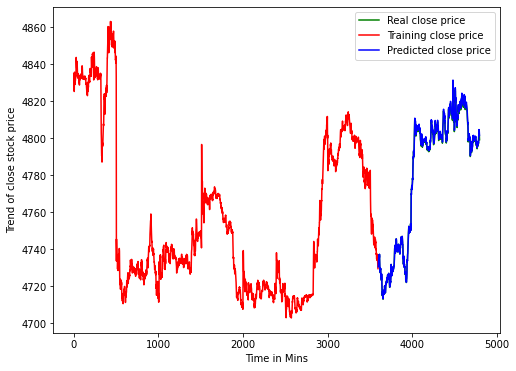

In [ ]:
plt.figure(figsize=(8,6))
real_close = OAZN_avg[-1197: ]
real_close
plt.plot(real_close, 'g', label = 'Real close price')
plt.plot(trainPredictPlot, 'r', label = 'Training close price')
plt.plot(testPredictPlot, 'b', label = 'Predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of close stock price')
plt.show()

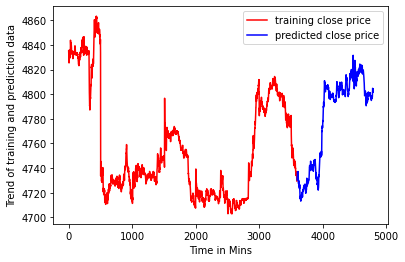

In [ ]:
# PLOT OF MAIN ORDSB VALUES, TRAIN PREDICTIONS AND TEST PREDICTIONS
plt.plot(trainPredictPlot, 'r', label = 'training close price')
plt.plot(testPredictPlot, 'b', label = 'predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of training and prediction data')
plt.show()

In [ ]:
# PREDICT FUTURE VALUES
last_val = testPredict[-1]
last_val_scaled = last_val/last_val
next_val = model.predict(np.reshape(last_val_scaled, (1,1,1)))
print("Last Min Value:", np.asscalar(last_val))
print("Next Min Value:", np.asscalar(last_val*next_val))
# print np.append(last_val, next_val)

Last Min Value: 4801.5771484375
Next Min Value: 4816.2099609375


**TSCO**

In [ ]:
df1_TSCO = df1_TSCO.drop(['ma21','upper_band'],axis=1)
df1_ULVR.head(3)

In [ ]:
# FUNCTION TO CREATE 1D DATA INTO TIME SERIES DATASET
def new_dataset(dataset, step_size):
	data_X, data_Y = [], []
	for i in range(len(dataset)-step_size-1):
		a = dataset[i:(i+step_size), 0]
		data_X.append(a)
		data_Y.append(dataset[i + step_size, 0])
	return np.array(data_X), np.array(data_Y)

In [ ]:
# FOR REPRODUCIBILITY
np.random.seed(7)

In [ ]:
# IMPORTING DATASET 
df1_TSCO = df1_TSCO.reindex(index = df1_TSCO.index[::-1])
df1_TSCO.head(3)

In [ ]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_TSCO) + 1, 1)

In [ ]:
# TAKING DIFFERENT INDICATORS FOR PREDICTION
OTSCO_avg = df1_TSCO.mean(axis = 1)
TSCO_avg = df1_TSCO[['High', 'Close']].mean(axis = 1)
close_val = df1_TSCO[['Close']]

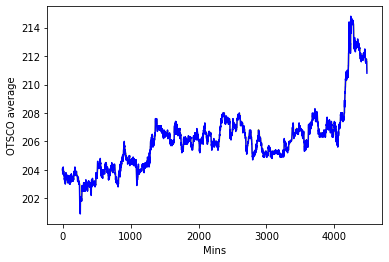

In [ ]:
# PLOTTING All INDICATORS IN PLOT
plt.plot(OTSCO_avg, 'yellow', label = 'OTSCO avg')
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('OTSCO average')
plt.show()

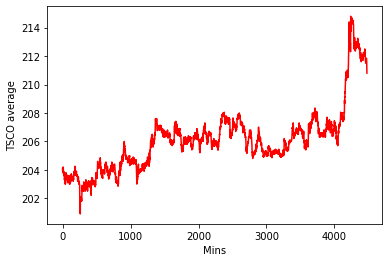

In [ ]:
plt.plot(TSCO_avg, 'red', label = 'TSCO avg')
plt.xlabel('Mins')
plt.ylabel('TSCO average')
plt.show()

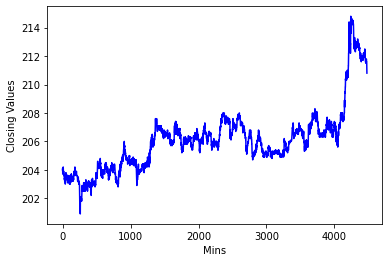

In [ ]:
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('Closing Values')
plt.show()

In [ ]:
# PREPARATION OF TIME SERIES DATASE
OTSCO_avg = np.reshape(OTSCO_avg.values, (len(OTSCO_avg),1)) 
scaler = MinMaxScaler(feature_range=(0, 1))
OTSCO_avg = scaler.fit_transform(OTSCO_avg)

In [ ]:
# TRAIN-TEST SPLIT
train_OTSCO = int(len(OTSCO_avg) * 0.75)
test_OTSCO = len(OTSCO_avg) - train_OTSCO
train_OTSCO, test_OTSCO = OTSCO_avg[0:train_OTSCO,:], OTSCO_avg[train_OTSCO:len(OTSCO_avg),:]

In [ ]:
# TIME-SERIES DATASET (FOR TIME T, VALUES FOR TIME T+1)
trainX, trainY = new_dataset(train_OTSCO, 1)
testX, testY = new_dataset(test_OTSCO, 1)

In [ ]:
# RESHAPING TRAIN AND TEST DATA
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
step_size = 1

In [ ]:
# LSTM MODEL
model = Sequential()
model.add(LSTM(32, input_shape=(1, step_size), return_sequences = True))
model.add(LSTM(16))
model.add(Dense(1))
model.add(Activation('linear'))

In [ ]:
# MODEL COMPILING AND TRAINING
start = time.time()
model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mae']) 
print ('compilation time : ', time.time() - start)
model.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2)

compilation time :  0.015981197357177734
Epoch 1/50
3356/3356 - 6s - loss: 0.0018 - mae: 0.0189
Epoch 2/50
3356/3356 - 6s - loss: 6.8246e-05 - mae: 0.0064
Epoch 3/50
3356/3356 - 6s - loss: 6.6875e-05 - mae: 0.0063
Epoch 4/50
3356/3356 - 6s - loss: 5.9854e-05 - mae: 0.0060
Epoch 5/50
3356/3356 - 6s - loss: 6.3967e-05 - mae: 0.0062
Epoch 6/50
3356/3356 - 6s - loss: 5.8299e-05 - mae: 0.0058
Epoch 7/50
3356/3356 - 6s - loss: 6.1442e-05 - mae: 0.0060
Epoch 8/50
3356/3356 - 6s - loss: 5.8663e-05 - mae: 0.0059
Epoch 9/50
3356/3356 - 6s - loss: 6.1175e-05 - mae: 0.0060
Epoch 10/50
3356/3356 - 6s - loss: 5.9662e-05 - mae: 0.0059
Epoch 11/50
3356/3356 - 6s - loss: 5.5914e-05 - mae: 0.0057
Epoch 12/50
3356/3356 - 6s - loss: 5.6596e-05 - mae: 0.0056
Epoch 13/50
3356/3356 - 6s - loss: 5.5554e-05 - mae: 0.0057
Epoch 14/50
3356/3356 - 6s - loss: 5.5405e-05 - mae: 0.0056
Epoch 15/50
3356/3356 - 6s - loss: 5.6116e-05 - mae: 0.0057
Epoch 16/50
3356/3356 - 6s - loss: 5.5866e-05 - mae: 0.0057
Epoch 17/50


In [ ]:
mae = model.evaluate(testX, testY, batch_size=16)
print('Mean Absolute Error for Y:', mae)

70/70 [==============================] - 0s 1ms/step - loss: 0.0018 - mae: 0.0242
Mean Absolute Error for Y: [0.0017641527811065316, 0.024225866422057152]


In [ ]:
# PREDICTION
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

In [ ]:
# DE-NORMALIZING FOR PLOTTING
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

In [ ]:
# TRAINING mse,rmse,mae, r2_score
trainScore1 = mean_squared_error(trainY[0], trainPredict[:,0])
print('Train mse : %.2f' % (trainScore1))
trainScore2 = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train rmse : %.2f' % (trainScore2))
trainScore3 = mean_absolute_error(trainY[0], trainPredict[:,0])
print('Train mae : %.2f' % (trainScore3))
trainScore4 = r2_score(trainY[0], trainPredict[:,0])
print('Train r2_score : %.2f' % (trainScore4))


Train mse : 0.01
Train rmse : 0.09
Train mae : 0.07
Train r2_score : 1.00


In [ ]:
# TEST RMSE
testScore1 = mean_squared_error(testY[0], testPredict[:,0])
print('Test MSE: %.2f' % (testScore1))
testScore2 = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test RMSE: %.2f' % (testScore2))
testScore3 = mean_absolute_error(testY[0], testPredict[:,0])
print('Test mae: %.2f' % (testScore3))
testScore4 = r2_score(testY[0], testPredict[:,0])
print('Test r2_score: %.2f' % (testScore4))

Test MSE: 0.32
Test RMSE: 0.56
Test mae: 0.33
Test r2_score: 0.95


In [ ]:
# CREATING SIMILAR DATASET TO PLOT REAL PREDICTIONS
trainPredictPlot = np.empty_like(OTSCO_avg)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[step_size:len(trainPredict)+step_size, :] = trainPredict

In [ ]:
# CREATING SIMILAR DATASSET TO PLOT TEST PREDICTIONS
testPredictPlot = np.empty_like(OTSCO_avg)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(step_size*2)+1:len(OTSCO_avg)-1, :] = testPredict

In [ ]:
real_close = dfi1_TSCO.Close[-1120:]
real_close

3358    206.0
3359    206.0
3360    206.0
3361    206.0
3362    206.1
        ...  
4473    211.6
4474    211.6
4475    211.2
4476    211.3
4477    210.8
Name: Close, Length: 1120, dtype: float64

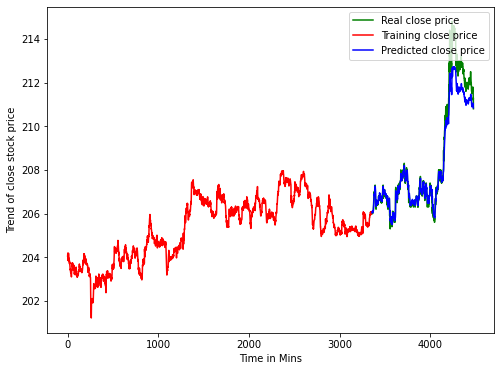

In [ ]:
plt.figure(figsize=(8,6))
plt.plot(real_close, 'g', label = 'Real close price')
plt.plot(trainPredictPlot, 'r', label = 'Training close price')
plt.plot(testPredictPlot, 'b', label = 'Predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of close stock price')
plt.show()

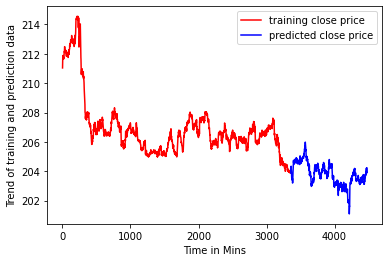

In [ ]:
# PLOT OF MAIN ORDSB VALUES, TRAIN PREDICTIONS AND TEST PREDICTIONS
plt.plot(trainPredictPlot, 'r', label = 'training close price')
plt.plot(testPredictPlot, 'b', label = 'predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of training and prediction data')
plt.show()

In [ ]:
# PREDICT FUTURE VALUES
last_val = testPredict[-1]
last_val_scaled = last_val/last_val
next_val = model.predict(np.reshape(last_val_scaled, (1,1,1)))
print("Last Min Value:", np.asscalar(last_val))
print("Next Min Value:", np.asscalar(last_val*next_val))
# print np.append(last_val, next_val)

Last Min Value: 204.21697998046875
Next Min Value: 204.8748016357422


**AAL**

In [ ]:
df1_AAL = df1_AAL.drop(['ma7','ma21','20sd','upper_band','lower_band'],axis=1)
df1_AAL.head(3)

,Open,Close,High,Low,26ema,12ema,ema
0,1682.0,1679.8,1682.0,1677.6,1679.800000,1679.800000,1679.800000
1,1679.8,1680.8,1681.6,1678.0,1680.319231,1680.341667,1680.550000
2,1681.2,1679.0,1681.2,1678.0,1679.845244,1679.818014,1679.476923


In [ ]:
# FUNCTION TO CREATE 1D DATA INTO TIME SERIES DATASET
def new_dataset(dataset, step_size):
	data_X, data_Y = [], []
	for i in range(len(dataset)-step_size-1):
		a = dataset[i:(i+step_size), 0]
		data_X.append(a)
		data_Y.append(dataset[i + step_size, 0])
	return np.array(data_X), np.array(data_Y)

In [ ]:
# FOR REPRODUCIBILITY
np.random.seed(7)

In [ ]:
# IMPORTING DATASET 
df1_AAL = df1_AAL.reindex(index = df1_AAL.index[::-1])
df1_AAL.head(3)

,Open,Close,High,Low,26ema,12ema,ema
0,1682.0,1679.8,1682.0,1677.6,1679.800000,1679.800000,1679.800000
1,1679.8,1680.8,1681.6,1678.0,1680.319231,1680.341667,1680.550000
2,1681.2,1679.0,1681.2,1678.0,1679.845244,1679.818014,1679.476923


In [ ]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_AAL) + 1, 1)

In [ ]:
# TAKING DIFFERENT INDICATORS FOR PREDICTION
OAAL_avg = df1_AAL.mean(axis = 1)
AAL_avg = df1_AAL[['High', 'Close']].mean(axis = 1)
close_val = df1_AAL[['Close']]

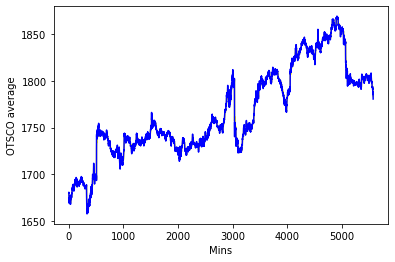

In [ ]:
# PLOTTING All INDICATORS IN PLOT
plt.plot(OAAL_avg, 'yellow', label = 'OAAL avg')
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('OAAL average')
plt.show()

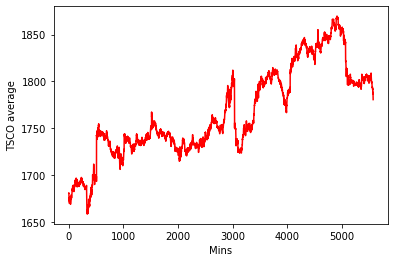

In [ ]:
plt.plot(AAL_avg, 'red', label = 'AAL avg')
plt.xlabel('Mins')
plt.ylabel('AAL average')
plt.show()

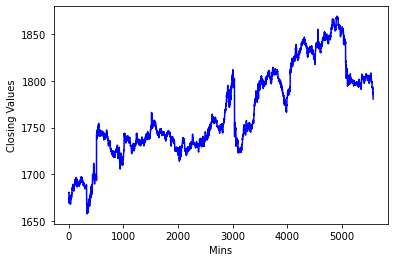

In [ ]:
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('Closing Values')
plt.show()

In [ ]:
# PREPARATION OF TIME SERIES DATASE
OAAL_avg = np.reshape(OAAL_avg.values, (len(OAAL_avg),1)) 
scaler = MinMaxScaler(feature_range=(0, 1))
OAAL_avg = scaler.fit_transform(OAAL_avg)

In [ ]:
# TRAIN-TEST SPLIT
train_OAAL = int(len(OAAL_avg) * 0.75)
test_OAAL = len(OAAL_avg) - train_OAAL
train_OAAL, test_OAAL = OAAL_avg[0:train_OAAL,:], OAAL_avg[train_OAAL:len(OAAL_avg),:]

In [ ]:
# TIME-SERIES DATASET (FOR TIME T, VALUES FOR TIME T+1)
trainX, trainY = new_dataset(train_OAAL, 1)
testX, testY = new_dataset(test_OAAL, 1)

In [ ]:
# RESHAPING TRAIN AND TEST DATA
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
step_size = 1

In [ ]:
# LSTM MODEL
model = Sequential()
model.add(LSTM(32, input_shape=(1, step_size), return_sequences = True))
model.add(LSTM(16))
model.add(Dense(1))
model.add(Activation('linear'))

In [ ]:
# MODEL COMPILING AND TRAINING
start = time.time()
model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mae']) 
print ('compilation time : ', time.time() - start)
model.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2)

compilation time :  0.012604951858520508
Epoch 1/50
4178/4178 - 7s - loss: 0.0031 - mae: 0.0204
Epoch 2/50
4178/4178 - 7s - loss: 6.0011e-05 - mae: 0.0047
Epoch 3/50
4178/4178 - 7s - loss: 7.6112e-05 - mae: 0.0051
Epoch 4/50
4178/4178 - 7s - loss: 6.4712e-05 - mae: 0.0050
Epoch 5/50
4178/4178 - 7s - loss: 6.3644e-05 - mae: 0.0049
Epoch 6/50
4178/4178 - 7s - loss: 6.3760e-05 - mae: 0.0050
Epoch 7/50
4178/4178 - 7s - loss: 6.5332e-05 - mae: 0.0048
Epoch 8/50
4178/4178 - 7s - loss: 6.6305e-05 - mae: 0.0051
Epoch 9/50
4178/4178 - 7s - loss: 6.0924e-05 - mae: 0.0047
Epoch 10/50
4178/4178 - 7s - loss: 6.3735e-05 - mae: 0.0050
Epoch 11/50
4178/4178 - 7s - loss: 6.0400e-05 - mae: 0.0046
Epoch 12/50
4178/4178 - 7s - loss: 6.0146e-05 - mae: 0.0047
Epoch 13/50
4178/4178 - 7s - loss: 6.1220e-05 - mae: 0.0047
Epoch 14/50
4178/4178 - 7s - loss: 5.8963e-05 - mae: 0.0047
Epoch 15/50
4178/4178 - 7s - loss: 6.0617e-05 - mae: 0.0046
Epoch 16/50
4178/4178 - 8s - loss: 5.8665e-05 - mae: 0.0047
Epoch 17/50


In [ ]:
mae = model.evaluate(testX, testY, batch_size=16)
print('Mean Absolute Error for Y:', mae)

87/87 [==============================] - 0s 1ms/step - loss: 1.1577e-04 - mae: 0.0099
Mean Absolute Error for Y: [0.00011576891120057553, 0.009866403415799141]


In [ ]:
# PREDICTION
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

In [ ]:
# DE-NORMALIZING FOR PLOTTING
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

In [ ]:
# TRAINING mse,rmse,mae, r2_score
trainScore1 = mean_squared_error(trainY[0], trainPredict[:,0])
print('Train mse : %.2f' % (trainScore1))
trainScore2 = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train rmse : %.2f' % (trainScore2))
trainScore3 = mean_absolute_error(trainY[0], trainPredict[:,0])
print('Train mae : %.2f' % (trainScore3))
trainScore4 = r2_score(trainY[0], trainPredict[:,0])
print('Train r2_score : %.2f' % (trainScore4))

Train mse : 2.24
Train rmse : 1.50
Train mae : 0.94
Train r2_score : 1.00


In [ ]:
# TEST RMSE
testScore1 = mean_squared_error(testY[0], testPredict[:,0])
print('Test MSE: %.2f' % (testScore1))
testScore2 = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test RMSE: %.2f' % (testScore2))
testScore3 = mean_absolute_error(testY[0], testPredict[:,0])
print('Test mae: %.2f' % (testScore3))
testScore4 = r2_score(testY[0], testPredict[:,0])
print('Test r2_score: %.2f' % (testScore4))

Test MSE: 5.02
Test RMSE: 2.24
Test mae: 2.05
Test r2_score: 0.99


In [ ]:
# CREATING SIMILAR DATASET TO PLOT REAL PREDICTIONS
trainPredictPlot = np.empty_like(OAAL_avg)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[step_size:len(trainPredict)+step_size, :] = trainPredict

In [ ]:
# CREATING SIMILAR DATASSET TO PLOT TEST PREDICTIONS
testPredictPlot = np.empty_like(OAAL_avg)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(step_size*2)+1:len(OAAL_avg)-1, :] = testPredict

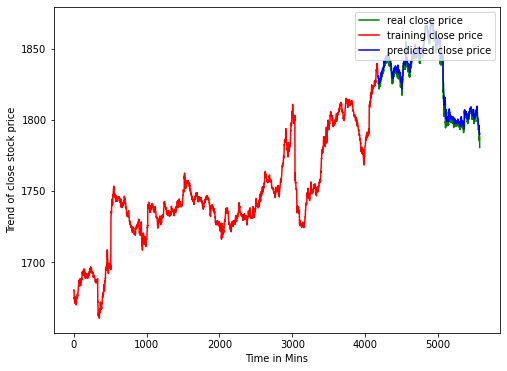

In [ ]:
plt.figure(figsize=(8,6))
real_close = df1_AAL.Close[-1392: ]
real_close
plt.plot(real_close, 'g', label = 'real close price')
plt.plot(trainPredictPlot, 'r', label = 'training close price')
plt.plot(testPredictPlot, 'b', label = 'predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of close stock price')
plt.show()

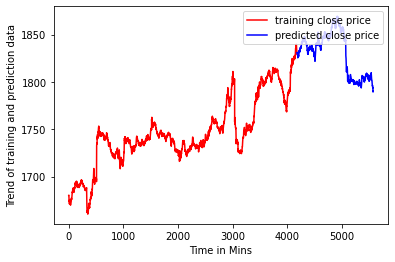

In [ ]:
# PLOT OF MAIN ORDSB VALUES, TRAIN PREDICTIONS AND TEST PREDICTIONS
plt.plot(trainPredictPlot, 'r', label = 'training close price')
plt.plot(testPredictPlot, 'b', label = 'predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of training and prediction data')
plt.show()

In [ ]:
# PREDICT FUTURE VALUES
last_val = testPredict[-1]
last_val_scaled = last_val/last_val
next_val = model.predict(np.reshape(last_val_scaled, (1,1,1)))
print("Last Min Value:", np.asscalar(last_val))
print("Next Min Value:", np.asscalar(last_val*next_val))
# print np.append(last_val, next_val)

Last Min Value: 1790.43505859375
Next Min Value: 1798.6993408203125


**DGE**

In [ ]:
df1_DGE = df1_DGE.drop(['ma7','MACD','upper_band','lower_band','Fourier','ARIMA'],axis=1)
df1_DGE.head(3)

,Close,Low,ema
0,2473.0,2472.0,2473.000000
1,2474.5,2474.0,2474.125000
2,2475.0,2475.0,2474.730769


In [ ]:
# FUNCTION TO CREATE 1D DATA INTO TIME SERIES DATASET
def new_dataset(dataset, step_size):
	data_X, data_Y = [], []
	for i in range(len(dataset)-step_size-1):
		a = dataset[i:(i+step_size), 0]
		data_X.append(a)
		data_Y.append(dataset[i + step_size, 0])
	return np.array(data_X), np.array(data_Y)

In [ ]:
# FOR REPRODUCIBILITY
np.random.seed(7)

In [ ]:
# IMPORTING DATASET 
df1_DGE = df1_DGE.reindex(index = df1_DGE.index[::-1])
df1_DGE.head(3)

,Close,Low,ema
5369,2460.0,2460.0,2459.678134
5368,2459.0,2458.0,2459.034401
5367,2458.0,2457.0,2459.103202


In [ ]:
# CREATING OWN INDEX FOR FLEXIBILITY
obs = np.arange(1, len(df1_DGE) + 1, 1)

In [ ]:
# TAKING DIFFERENT INDICATORS FOR PREDICTION
ODGE_avg = dataset.mean(axis = 1)
DGE_avg = dataset[['Low', 'Close']].mean(axis = 1)
close_val = dataset[['Close']]

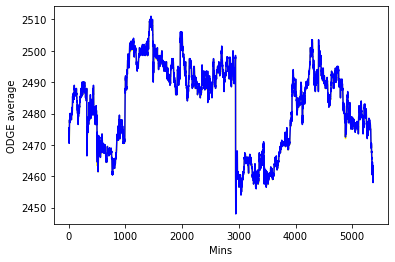

In [ ]:
# PLOTTING All INDICATORS IN PLOT
plt.plot(ODGE_avg, 'yellow', label = 'ODGE avg')
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('ODGE average')
plt.show()

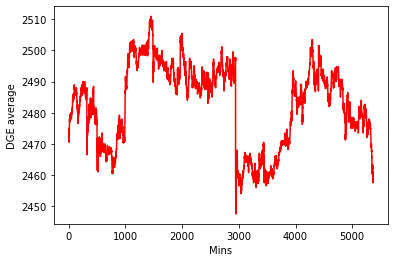

In [ ]:
plt.plot(DGE_avg, 'red', label = 'DGE avg')
plt.xlabel('Mins')
plt.ylabel('DGE average')
plt.show()

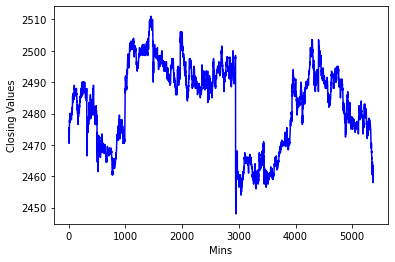

In [ ]:
plt.plot(close_val, 'blue', label = 'Closing price')
plt.xlabel('Mins')
plt.ylabel('Closing Values')
plt.show()

In [ ]:
# PREPARATION OF TIME SERIES DATASE
ODGE_avg = np.reshape(ODGE_avg.values, (len(ODGE_avg),1)) 
scaler = MinMaxScaler(feature_range=(0, 1))
ODGE_avg = scaler.fit_transform(ODGE_avg)

In [ ]:
# TRAIN-TEST SPLIT
train_ODGE = int(len(ODGE_avg) * 0.75)
test_ODGE = len(ODGE_avg) - train_ODGE
train_ODGE, test_ODGE = ODGE_avg[0:train_ODGE,:], ODGE_avg[train_ODGE:len(ODGE_avg),:]

In [ ]:
# TIME-SERIES DATASET (FOR TIME T, VALUES FOR TIME T+1)
trainX, trainY = new_dataset(train_ODGE, 1)
testX, testY = new_dataset(test_ODGE, 1)

In [ ]:
# RESHAPING TRAIN AND TEST DATA
trainX = np.reshape(trainX, (trainX.shape[0], 1, trainX.shape[1]))
testX = np.reshape(testX, (testX.shape[0], 1, testX.shape[1]))
step_size = 1

In [ ]:
# LSTM MODEL
model = Sequential()
model.add(LSTM(32, input_shape=(1, step_size), return_sequences = True))
model.add(LSTM(16))
model.add(Dense(1))
model.add(Activation('linear'))

In [ ]:
# MODEL COMPILING AND TRAINING
start = time.time()
model.compile(loss='mean_squared_error', optimizer='adam',metrics = ['mae']) 
print ('compilation time : ', time.time() - start)
model.fit(trainX, trainY, epochs=50, batch_size=1, verbose=2)

compilation time :  0.011486053466796875
Epoch 1/50
4025/4025 - 6s - loss: 0.0051 - mae: 0.0290
Epoch 2/50
4025/4025 - 7s - loss: 3.2969e-04 - mae: 0.0116
Epoch 3/50
4025/4025 - 7s - loss: 3.2941e-04 - mae: 0.0115
Epoch 4/50
4025/4025 - 7s - loss: 3.4829e-04 - mae: 0.0117
Epoch 5/50
4025/4025 - 7s - loss: 3.0800e-04 - mae: 0.0109
Epoch 6/50
4025/4025 - 7s - loss: 3.3059e-04 - mae: 0.0114
Epoch 7/50
4025/4025 - 7s - loss: 3.1475e-04 - mae: 0.0112
Epoch 8/50
4025/4025 - 7s - loss: 3.2388e-04 - mae: 0.0114
Epoch 9/50
4025/4025 - 7s - loss: 3.1870e-04 - mae: 0.0110
Epoch 10/50
4025/4025 - 7s - loss: 3.1838e-04 - mae: 0.0112
Epoch 11/50
4025/4025 - 7s - loss: 3.0766e-04 - mae: 0.0110
Epoch 12/50
4025/4025 - 7s - loss: 3.2133e-04 - mae: 0.0113
Epoch 13/50
4025/4025 - 7s - loss: 3.1833e-04 - mae: 0.0113
Epoch 14/50
4025/4025 - 6s - loss: 3.0478e-04 - mae: 0.0109
Epoch 15/50
4025/4025 - 7s - loss: 2.9890e-04 - mae: 0.0109
Epoch 16/50
4025/4025 - 7s - loss: 3.2005e-04 - mae: 0.0112
Epoch 17/50


In [ ]:
mae = model.evaluate(testX, testY, batch_size=16)
print('Mean Absolute Error for Y:', mae)

84/84 [==============================] - 0s 1ms/step - loss: 1.6810e-04 - mae: 0.0098
Mean Absolute Error for Y: [0.00016810439410619438, 0.009782482869923115]


In [ ]:
# PREDICTION
trainPredict = model.predict(trainX)
testPredict = model.predict(testX)

In [ ]:
# DE-NORMALIZING FOR PLOTTING
trainPredict = scaler.inverse_transform(trainPredict)
trainY = scaler.inverse_transform([trainY])
testPredict = scaler.inverse_transform(testPredict)
testY = scaler.inverse_transform([testY])

In [ ]:
# TRAINING mse,rmse,mae, r2_score
trainScore1 = mean_squared_error(trainY[0], trainPredict[:,0])
print('Train mse : %.2f' % (trainScore1))
trainScore2 = math.sqrt(mean_squared_error(trainY[0], trainPredict[:,0]))
print('Train rmse : %.2f' % (trainScore2))
trainScore3 = mean_absolute_error(trainY[0], trainPredict[:,0])
print('Train mae : %.2f' % (trainScore3))
trainScore4 = r2_score(trainY[0], trainPredict[:,0])
print('Train r2_score : %.2f' % (trainScore4))


Train mse : 1.04
Train rmse : 1.02
Train mae : 0.65
Train r2_score : 0.99


In [ ]:
# TEST RMSE
testScore1 = mean_squared_error(testY[0], testPredict[:,0])
print('Test MSE: %.2f' % (testScore1))
testScore2 = math.sqrt(mean_squared_error(testY[0], testPredict[:,0]))
print('Test RMSE: %.2f' % (testScore2))
testScore3 = mean_absolute_error(testY[0], testPredict[:,0])
print('Test mae: %.2f' % (testScore3))
testScore4 = r2_score(testY[0], testPredict[:,0])
print('Test r2_score: %.2f' % (testScore4))

Test MSE: 0.66
Test RMSE: 0.81
Test mae: 0.61
Test r2_score: 0.99


In [ ]:
# CREATING SIMILAR DATASET TO PLOT REAL PREDICTIONS
trainPredictPlot = np.empty_like(ORDSB_avg)
trainPredictPlot[:, :] = np.nan
trainPredictPlot[step_size:len(trainPredict)+step_size, :] = trainPredict

In [ ]:
# CREATING SIMILAR DATASSET TO PLOT TEST PREDICTIONS
testPredictPlot = np.empty_like(ODGE_avg)
testPredictPlot[:, :] = np.nan
testPredictPlot[len(trainPredict)+(step_size*2)+1:len(ODGE_avg)-1, :] = testPredict

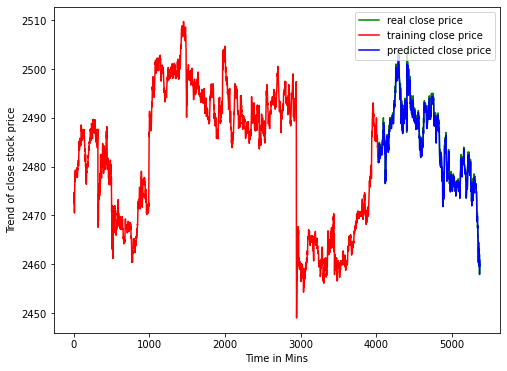

In [ ]:
plt.figure(figsize=(8,6))
real_close = df1_DGE.Close[-1341:]
real_close
plt.plot(real_close, 'g', label = 'real close price')
plt.plot(trainPredictPlot, 'r', label = 'training close price')
plt.plot(testPredictPlot, 'b', label = 'predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of close stock price')
plt.show()

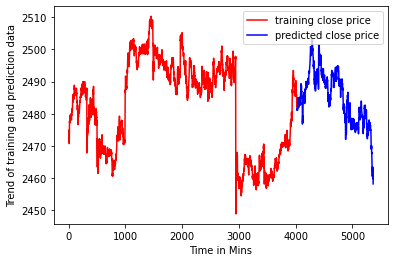

In [ ]:
# PLOT OF MAIN ORDSB VALUES, TRAIN PREDICTIONS AND TEST PREDICTIONS
plt.plot(trainPredictPlot, 'r', label = 'training close price')
plt.plot(testPredictPlot, 'b', label = 'predicted close price')
plt.legend(loc = 'upper right')
plt.xlabel('Time in Mins')
plt.ylabel('Trend of training and prediction data')
plt.show()

In [ ]:
# PREDICT FUTURE VALUES
last_val = testPredict[-1]
last_val_scaled = last_val/last_val
next_val = model.predict(np.reshape(last_val_scaled, (1,1,1)))
print("Last Min Value:", np.asscalar(last_val))
print("Next Min Value:", np.asscalar(last_val*next_val))
# print np.append(last_val, next_val)

Last Min Value: 2457.932861328125
Next Min Value: 2411.251708984375


#XGBoost

Because I want to predict the next min price, after calculating all features for min Mi , I shift Close price column by -1 rows. After doing that, for min Mi we have features from the same timestamp e.g. RSIi , but the price Ci+1 from upcoming min

In [ ]:
df1_RDSB['Close'] = df1_RDSB['Close'].shift(-1)

In [ ]:
import plotly.graph_objects as go
test_size  = 0.15
valid_size = 0.15

test_split_idx  = int(df1_RDSB.shape[0] * (1-test_size))
valid_split_idx = int(df1_RDSB.shape[0] * (1-(valid_size+test_size)))

train_df1_RDSB  = df1_RDSB.loc[:valid_split_idx].copy()
valid_df1_RDSB  = df1_RDSB.loc[valid_split_idx+1:test_split_idx].copy()
test_df1_RDSB   = df1_RDSB.loc[test_split_idx+1:].copy()

fig = go.Figure()
fig.add_trace(go.Scatter(x=train_df1_RDSB.Dates, y=train_df1_RDSB.Close, name='Training'))
fig.add_trace(go.Scatter(x=valid_df1_RDSB.Dates, y=valid_df1_RDSB.Close, name='Validation'))
fig.add_trace(go.Scatter(x=test_df1_RDSB.Dates,  y=test_df1_RDSB.Close,  name='Test'))
fig.show()

In [ ]:
drop_cols = ['Dates', 'High', '12ema','26ema']

train_df1_RDSB = train_df1_RDSB.drop(drop_cols, 1)
valid_df1_RDSB = valid_df1_RDSB.drop(drop_cols, 1)
test_df1_RDSB  = test_df1_RDSB.drop(drop_cols, 1)

In [ ]:
# Split into features and labels
y_train = train_df1_RDSB['Close'].copy()
X_train = train_df1_RDSB.drop(['Close'], 1)

y_valid = valid_df1_RDSB['Close'].copy()
X_valid = valid_df1_RDSB.drop(['Close'], 1)

y_test  = test_df1_RDSB['Close'].copy()
X_test  = test_df1_RDSB.drop(['Close'], 1)

X_train.info()

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV
#### Fine-tune XGBoostRegressor
# %%time

parameters = {
    'n_estimators': [100, 200, 300, 400],
    'learning_rate': [0.001, 0.005, 0.01, 0.05],
    'max_depth': [8, 10, 12, 15],
    'gamma': [0.001, 0.005, 0.01, 0.02],
    'random_state': [42]
}
start = time.time() ####
eval_set = [(X_train, y_train), (X_valid, y_valid)]
model = xgb.XGBRegressor(eval_set=eval_set, objective='reg:squarederror', verbose=False)
clf = GridSearchCV(model, parameters)

clf.fit(X_train, y_train)

print(f'Best params: {clf.best_params_}')
print(f'Best validation score = {clf.best_score_}')
print ('compilation time : ', time.time() - start) #####

In [ ]:
model = xgb.XGBRegressor(**clf.best_params_, objective='reg:squarederror')
model.fit(X_train, y_train, eval_set=eval_set, verbose=False)

In [ ]:
x_pred = model.predict(X_train)
print(f'x_true = {np.array(X_test)[:5]}')
print(f'x_pred = {x_pred[:5]}')

In [ ]:
y_pred = model.predict(X_test)
print(f'y_true = {np.array(y_test)[:5]}')
print(f'y_pred = {y_pred[:5]}')


In [ ]:
print(f'mse = {mean_squared_error(y_test, y_pred)}')
print(f'rmse = {sqrt(mean_squared_error(y_test, y_pred))}')
print(f'mae = {mean_absolute_error(y_test, y_pred)}')
print(f'r2_score = {r2_score(y_test, y_pred)}')

In [ ]:
import matplotlib.pyplot as plt
predicted_stateful = y_pred
plt.plot(y_test, color = 'red',label = 'Actual Closing Prices')
plt.plot(y_pred.flatten(), color = 'blue', label  = 'Predicted closing Prices')
plt.xlabel('Mins')
plt.ylabel('Close Prices')
plt.legend(loc='best')
plt.show()

In [ ]:
from plotly.subplots import make_subplots
predicted_prices = df1_RDSB.loc[test_split_idx+1:].copy()
predicted_prices['Close'] = y_pred

fig = make_subplots(rows=2, cols=1)
fig.add_trace(go.Scatter(x=df1_RDSB.Dates, y=df1_RDSB.Close,
                         name='Actual Closing Prices',
                         marker_color='LightSkyBlue'), row=1, col=1)

fig.add_trace(go.Scatter(x=predicted_prices.Dates,
                         y=predicted_prices.Close,
                         name='Prediction',
                         marker_color='MediumPurple'), row=1, col=1)

fig.add_trace(go.Scatter(x=predicted_prices.Dates,
                         y=y_test,
                         name='Truth',
                         marker_color='LightSkyBlue',
                         showlegend=False), row=2, col=1)

fig.add_trace(go.Scatter(x=predicted_prices.Dates,
                         y=y_pred,
                         name='Prediction',
                         marker_color='MediumPurple',
                         showlegend=False), row=2, col=1)

fig.show()

**ULVR**

**HSBC**

**BP**

**GSK**

**LLOY**

**AZN**

**TSCO**

**AAL**

**DGE**

#LR

**RDSB**

**ULVR**

**HSBC**

**BP**

**LLOY**

**AZN**

**TSCO**

**AAL**

**DGE**